In [1]:
# Importing librares 
import os  # to provide a way to use operating system-dependent functionalities. It allows you to interact with the underlying operating system, such as reading or writing files, navigating directories, etc
import sys  # to provide access to some variables used or maintained by the interpreter and functions that interact with the interpreter. It allows you to manipulate the Python runtime environment
import warnings  # to provide a way to handle warnings issued by Python or external libraries. It allows you to control the display and handling of warning messages
import numpy as np  # to provide support for large, multi-dimensional arrays and matrices, along with a wide range of mathematical functions to operate on these arrays efficiently
import pandas as pd  # to provide high-performance data structures like DataFrames and Series, along with a wide range of functions to manipulate, clean, and analyze structured data
import matplotlib.pyplot as plt  # to provide a wide variety of functions to create different types of plots and visualizations, allowing you to customize the appearance of your plots extensively
import seaborn as sns  # to provide a high-level interface for creating attractive and informative statistical graphics, making it easier to explore and understand data visually
warnings.filterwarnings("ignore")  # to ensure that warning messages are not displayed during the execution of your code
import os
from tabulate import tabulate
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import sys
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict, KFold

import statsmodels.api as sm

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf



import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV

import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.base import clone

import warnings
from sklearn.model_selection import KFold  # Import KFold from sklearn
from sklearn.linear_model import LassoCV  # Import LassoCV from sklearn.linear_model
from sklearn.linear_model import ElasticNetCV  # Import ElasticNetCV from sklearn.linear_model
from sklearn.linear_model import RidgeCV  # Import RidgeCV from sklearn.linear_model
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import shap
shap.initjs()
import numba

import pandas as pd
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.core.display import HTML
from plotnine import *
from stargazer.stargazer import Stargazer

import pandas as pd #for building dataframes from CSV files
import seaborn as sns #for fancy charts
import numpy as np #for np.nan
from scipy import stats #for statistical analysis
from scipy.stats import norm #for statistical analysis
from datetime import datetime #for time-series plots
import statsmodels #for integration with pandas and analysis
import statsmodels.api as sm # for regression modules
from statsmodels.formula.api import ols # for regression modules
import matplotlib.pyplot as plt 
from sklearn.decomposition import PCA
%matplotlib inline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
import pandas as pd
import statsmodels as sm

warnings.filterwarnings('ignore')


# BASELINE MODELS
In this section, I will use three different datasets based on the different numbers of potential IVs. As estimation strategies, I will employ common first-stage and second-stage specifications with no ML techniques and I will use the results from those baseline models to compare the results from ML based results to see if there is improvement in the results.  

In [2]:
filtered_data = pd.read_csv('data_final_full.csv')
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [3]:
# Filter the columns in df_IV that include "DRX" in their names
drx_columns = [col for col in filtered_data.columns if 'DRX' in col]
filtered_data = filtered_data.drop(columns=drx_columns)
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [4]:
filtered_data = filtered_data.rename(columns={'PAQ665': 'exercise'})
filtered_data = filtered_data.rename(columns={'OCD390G': 'work_type1'})

In [5]:
columns_to_drop = [
    'Unnamed: 0_x',
    'SEQN',
    'SDDSRVYR',
    'SEQN_new',
    'Unnamed: 0_y',
    'Unnamed: 0_x.1',
    'Unnamed: 0_y.1',
    'Unnamed: 0_x.2',
    'Unnamed: 0_y.2',
    'SDMVSTRA',
    'total_alcohol',
    'veggies',
    'fruit',
    'diastolic',
    'systolic',
    'VNAVEBPXSY',
    'VNLBAVEBPXDI',
    'BMXWT',
    'cholesterol1',
    'DMDHHSIZ',
    'DMDHRAGE',
    'total_hh_income',
    'MIALANG',
    'SIALANG',
    'WTINT2YR',
    'WTMEC2YR',
    'hh_income_percap'
]

# Drop the specified columns
filtered_data = filtered_data.drop(columns=columns_to_drop)
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [6]:
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [7]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ fv", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ fv+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [8]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("fv ~ ln_hh_income_percap", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ hh_size1", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ exercise", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ work_type1", data=filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1", data=filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6])
stargazer.covariate_order(["Intercept", "ln_hh_income_percap", "hh_size1", "exercise", "work_type1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "gender", "age", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"], [1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [9]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()

# Add the predicted values as new columns to the DataFrame
filtered_data['veggies_n_fruits_1'] = predicted_values_1
filtered_data['veggies_n_fruits_2'] = predicted_values_2
filtered_data['veggies_n_fruits_3'] = predicted_values_3
filtered_data['veggies_n_fruits_4'] = predicted_values_4
filtered_data['veggies_n_fruits_5'] = predicted_values_5
filtered_data['veggies_n_fruits_6'] = predicted_values_6
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,work_type1,fv,bp,ln_hh_income_percap,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,2.420000,182.0,1.098612,2.485583,2.545174,2.35621,2.48079,2.335325,1.869538
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,1.890000,182.0,1.098612,2.485583,2.545174,2.35621,2.48079,2.335325,1.726942
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,2.549986,182.0,1.098612,2.485583,2.545174,2.35621,2.48079,2.335325,1.844583
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,3.120000,208.0,0.916291,2.450927,2.545174,2.35621,2.48079,2.303769,3.021861
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,1.140000,208.0,0.916291,2.450927,2.545174,2.35621,2.48079,2.303769,2.262604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,3.390000,198.0,2.484907,2.749095,2.592867,2.35621,2.48079,2.570067,3.429418
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,2.475441,198.0,2.484907,2.749095,2.592867,2.35621,2.48079,2.570067,2.760194
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,3.520000,238.0,0.559616,2.383129,2.449788,2.35621,2.48079,2.252422,2.479790
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,0.000000,238.0,0.559616,2.383129,2.449788,2.35621,2.48079,2.252422,1.900653


In [10]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_1", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [11]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_2", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_2", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [12]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_3", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_3", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [13]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_4", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_4", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [14]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_5", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_5", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [15]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [16]:
# Your baseline model's reg4
baseline_reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")

# List to store all model reg4's including the baseline
all_reg4s = [baseline_reg4]

# Loop over veggies_n_fruits from 1 to 9 and run regression for each
for i in range(1, 7):
    filtered_data['fv'] = filtered_data[f'veggies_n_fruits_{i}']
    
    reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
    all_reg4s.append(reg4)

# Report results using Stargazer
stargazer = Stargazer(all_reg4s)
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})

# Names for the results table
model_names = ["Baseline Model 4"] + ["Model 4 for veggies_n_fruits_" + str(i) for i in range(1, 7)]

stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Displaying the HTML
HTML(stargazer.render_html())


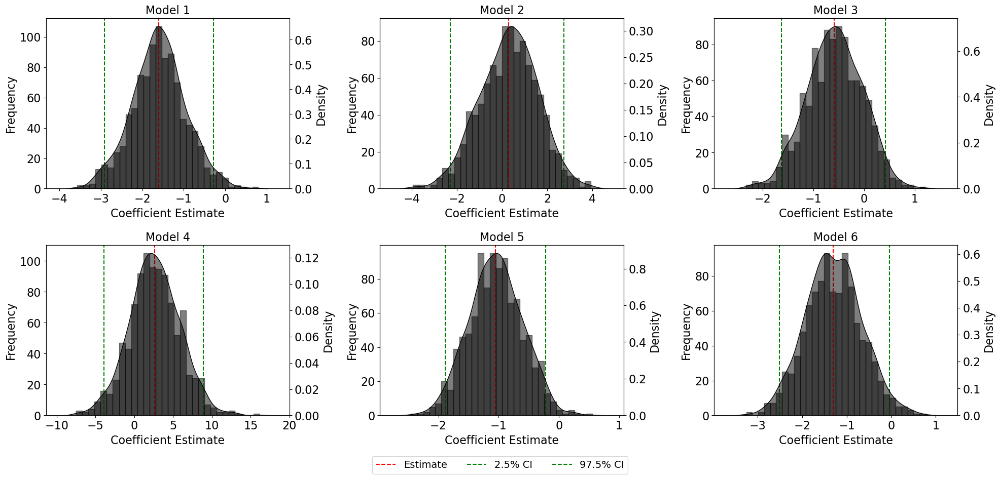

In [165]:
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 7):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = filtered_data.sample(n=len(filtered_data), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ veggies_n_fruits_{i} + red_meat + nuts + total_cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(2, 3, figsize=(20, 10))  # Adjust to 2x3 if you have 6 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"]

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()

    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i], fontsize=16)
    axs[i].set_xlabel('Coefficient Estimate', fontsize=16)
    axs[i].set_ylabel('Frequency', fontsize=16)
    
    # Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

# Adjust the layout to better fit the subplots and titles
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

# OLS with scaled endogenous variable

In [48]:
filtered_dataOLS = filtered_data
filtered_dataOLS

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [49]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the 'fv' column and transform it
filtered_dataOLS['scaled_fv'] = scaler.fit_transform(filtered_dataOLS[['fv']])

# Drop the original 'fv' column
filtered_dataOLS = filtered_dataOLS.drop('fv', axis=1)

# Now 'filtered_data' contains the scaled 'fv' and has removed the original 'fv'
filtered_dataOLS

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,bp,ln_hh_income_percap,scaled_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,182.0,1.098612,-0.047519
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,182.0,1.098612,-0.356386
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,182.0,1.098612,0.028232
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,208.0,0.916291,0.360417
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,208.0,0.916291,-0.793461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,198.0,2.484907,0.517764
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,198.0,2.484907,-0.015210
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,238.0,0.559616,0.593524
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,238.0,0.559616,-1.457815


In [50]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ scaled_fv", data=filtered_dataOLS).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ scaled_fv+red_meat+nuts", data=filtered_dataOLS).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ scaled_fv+red_meat+nuts+total_cholesterol+bmi", data=filtered_dataOLS).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ scaled_fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_dataOLS).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "scaled_fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

# Traditional iv with scaled data in the first stage

In [17]:
filtered_data = pd.read_csv('data_final_full.csv')
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [18]:
# Filter the columns in df_IV that include "DRX" in their names
drx_columns = [col for col in filtered_data.columns if 'DRX' in col]
filtered_data = filtered_data.drop(columns=drx_columns)
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [19]:
filtered_data = filtered_data.rename(columns={'PAQ665': 'exercise'})
filtered_data = filtered_data.rename(columns={'OCD390G': 'work_type1'})

In [20]:
columns_to_drop = [
    'Unnamed: 0_x',
    'SEQN',
    'SDDSRVYR',
    'SEQN_new',
    'Unnamed: 0_y',
    'Unnamed: 0_x.1',
    'Unnamed: 0_y.1',
    'Unnamed: 0_x.2',
    'Unnamed: 0_y.2',
    'SDMVSTRA',
    'total_alcohol',
    'veggies',
    'fruit',
    'diastolic',
    'systolic',
    'VNAVEBPXSY',
    'VNLBAVEBPXDI',
    'BMXWT',
    'cholesterol1',
    'DMDHHSIZ',
    'DMDHRAGE',
    'total_hh_income',
    'MIALANG',
    'SIALANG',
    'WTINT2YR',
    'WTMEC2YR',
    'hh_income_percap'
]

# Drop the specified columns
filtered_data = filtered_data.drop(columns=columns_to_drop)
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [21]:
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [22]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the DataFrame
filtered_data_standardized = pd.DataFrame(scaler.fit_transform(filtered_data), columns=filtered_data.columns, index=filtered_data.index)

# Display the standardized DataFrame
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [23]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("fv ~ ln_hh_income_percap", data=filtered_data_standardized).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ hh_size1", data=filtered_data_standardized).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ exercise", data=filtered_data_standardized).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ work_type1", data=filtered_data_standardized).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1", data=filtered_data_standardized).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6])
stargazer.covariate_order(["Intercept", "ln_hh_income_percap", "hh_size1", "exercise", "work_type1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "gender", "age", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"], [1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [24]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()

# Add the predicted values as new columns to the DataFrame
filtered_data['veggies_n_fruits_1'] = predicted_values_1
filtered_data['veggies_n_fruits_2'] = predicted_values_2
filtered_data['veggies_n_fruits_3'] = predicted_values_3
filtered_data['veggies_n_fruits_4'] = predicted_values_4
filtered_data['veggies_n_fruits_5'] = predicted_values_5
filtered_data['veggies_n_fruits_6'] = predicted_values_6
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,work_type1,fv,bp,ln_hh_income_percap,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,2.420000,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.368311
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,1.890000,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.451410
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,2.549986,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.382853
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,3.120000,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,0.303225
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,1.140000,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,-0.139245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,3.390000,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.540736
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,2.475441,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.150734
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,3.520000,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.012676
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,0.000000,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.350177


In [25]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_1", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [26]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_2", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_2", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [27]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_3", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_3", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [28]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_4", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_4", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [29]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_5", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_5", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [30]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [31]:
# Your baseline model's reg4
baseline_reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")

# List to store all model reg4's including the baseline
all_reg4s = [baseline_reg4]

# Loop over veggies_n_fruits from 1 to 9 and run regression for each
for i in range(1, 7):
    filtered_data['fv'] = filtered_data[f'veggies_n_fruits_{i}']
    
    reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
    all_reg4s.append(reg4)

# Report results using Stargazer
stargazer = Stargazer(all_reg4s)
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})

# Names for the results table
model_names = ["Baseline Model 4"] + ["Model 4 for veggies_n_fruits_" + str(i) for i in range(1, 7)]

stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Displaying the HTML
HTML(stargazer.render_html())


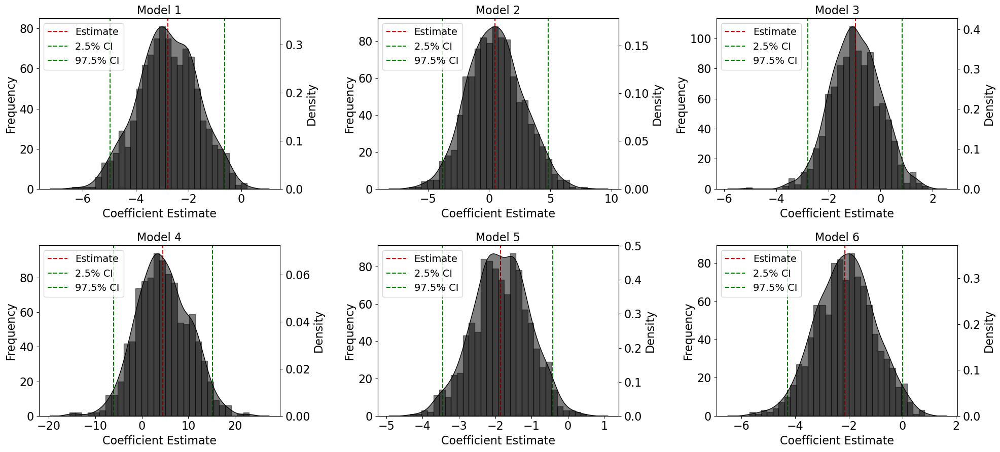

In [69]:
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 7):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = filtered_data.sample(n=len(filtered_data), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ veggies_n_fruits_{i} + red_meat + nuts + total_cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(2, 3, figsize=(20, 10))  # Adjust to 2x3 if you have 6 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"]

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()

    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i], fontsize=16)
    axs[i].set_xlabel('Coefficient Estimate', fontsize=16)
    axs[i].set_ylabel('Frequency', fontsize=16)
    axs[i].legend(loc='upper left')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Adjust the layout to better fit the subplots and titles
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()


# with controls in the first stage

In [22]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("fv ~ ln_hh_income_percap+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ hh_size1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ exercise+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ work_type1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1", data=filtered_data_standardized).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise+work_type1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data_standardized).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6])
stargazer.covariate_order(["Intercept", "ln_hh_income_percap", "hh_size1", "exercise", "work_type1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "gender", "age", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"], [1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [23]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()

# Add the predicted values as new columns to the DataFrame
filtered_data['veggies_n_fruits_1'] = predicted_values_1
filtered_data['veggies_n_fruits_2'] = predicted_values_2
filtered_data['veggies_n_fruits_3'] = predicted_values_3
filtered_data['veggies_n_fruits_4'] = predicted_values_4
filtered_data['veggies_n_fruits_5'] = predicted_values_5
filtered_data['veggies_n_fruits_6'] = predicted_values_6
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,work_type1,fv,bp,ln_hh_income_percap,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.368311,182.0,1.098612,-0.326418,-0.329023,-0.366552,-0.344757,-0.096865,-0.368311
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.451410,182.0,1.098612,-0.409744,-0.412570,-0.450074,-0.427921,-0.096865,-0.451410
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.382853,182.0,1.098612,-0.340462,-0.342972,-0.381038,-0.358583,-0.096865,-0.382853
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,0.303225,208.0,0.916291,0.362679,0.387852,0.334880,0.371396,-0.115255,0.303225
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.139245,208.0,0.916291,-0.080999,-0.056999,-0.109841,-0.071414,-0.115255,-0.139245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.540736,198.0,2.484907,0.638906,0.583847,0.497548,0.541128,0.039935,0.540736
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.150734,198.0,2.484907,0.239854,0.181770,0.103626,0.140019,0.039935,0.150734
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.012676,238.0,0.559616,0.062400,0.087617,0.030424,0.075528,-0.145178,-0.012676
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.350177,238.0,0.559616,-0.276023,-0.251701,-0.308795,-0.262233,-0.145178,-0.350177


In [24]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_1", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_1", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [25]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_2", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_2+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_2", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [26]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_3", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_3+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_3", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [27]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_4", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_4+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_4", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [28]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_5", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_5+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_5", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [29]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts", data=filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi", data=filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [30]:
# Your baseline model's reg4
baseline_reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")

# List to store all model reg4's including the baseline
all_reg4s = [baseline_reg4]

# Loop over veggies_n_fruits from 1 to 9 and run regression for each
for i in range(1, 7):
    filtered_data['fv'] = filtered_data[f'veggies_n_fruits_{i}']
    
    reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=filtered_data).fit(cov_type="HC1")
    all_reg4s.append(reg4)

# Report results using Stargazer
stargazer = Stargazer(all_reg4s)
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})

# Names for the results table
model_names = ["Baseline Model 4"] + ["Model 4 for veggies_n_fruits_" + str(i) for i in range(1, 7)]

stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Displaying the HTML
HTML(stargazer.render_html())


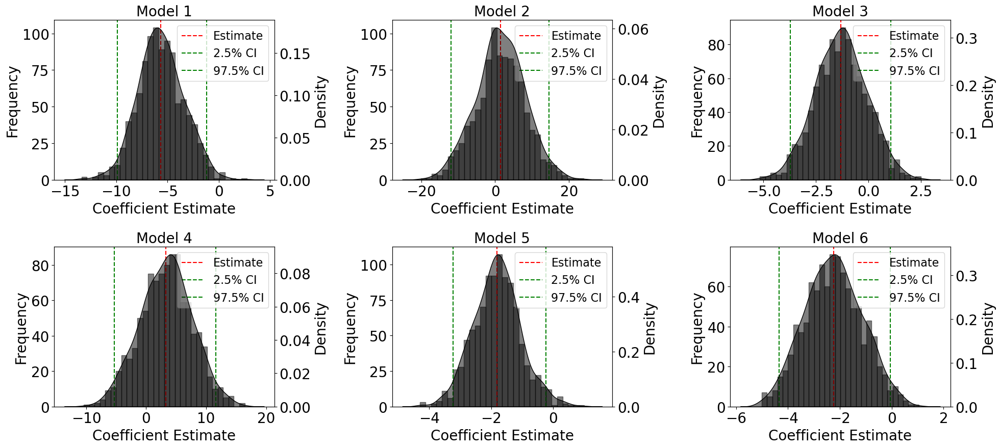

In [33]:
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 20, 'axes.labelsize': 20, 'axes.titlesize': 20, 'legend.fontsize': 16})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 7):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = filtered_data.sample(n=len(filtered_data), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ veggies_n_fruits_{i} + red_meat + nuts + total_cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(2, 3, figsize=(20, 10))  # Adjust to 2x3 if you have 6 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"]

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()

    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i], fontsize=20)
    axs[i].set_xlabel('Coefficient Estimate', fontsize=20)
    axs[i].set_ylabel('Frequency', fontsize=20)
    axs[i].legend(loc='upper right')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=20)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Adjust the layout to better fit the subplots and titles
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()


# ML Models

In [113]:
filtered_data = pd.read_csv('data_final_full.csv')
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [114]:
# Filter the columns in df_IV that include "DRX" in their names
drx_columns = [col for col in filtered_data.columns if 'DRX' in col]
filtered_data = filtered_data.drop(columns=drx_columns)
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [115]:
filtered_data = filtered_data.rename(columns={'PAQ665': 'exercise'})
filtered_data = filtered_data.rename(columns={'OCD390G': 'work_type1'})

In [116]:
columns_to_drop = [
    'Unnamed: 0_x',
    'SEQN',
    'SDDSRVYR',
    'SEQN_new',
    'Unnamed: 0_y',
    'Unnamed: 0_x.1',
    'Unnamed: 0_y.1',
    'Unnamed: 0_x.2',
    'Unnamed: 0_y.2',
    'SDMVSTRA',
    'total_alcohol',
    'veggies',
    'fruit',
    'diastolic',
    'systolic',
    'VNAVEBPXSY',
    'VNLBAVEBPXDI',
    'BMXWT',
    'cholesterol1',
    'DMDHHSIZ',
    'DMDHRAGE',
    'total_hh_income',
    'MIALANG',
    'SIALANG',
    'WTINT2YR',
    'WTMEC2YR',
    'hh_income_percap'
]

# Drop the specified columns
filtered_data = filtered_data.drop(columns=columns_to_drop)
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [117]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the DataFrame
filtered_data_standardized = pd.DataFrame(scaler.fit_transform(filtered_data), columns=filtered_data.columns, index=filtered_data.index)

# Display the standardized DataFrame
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [118]:
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,5,2,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [33]:
nonscaled_no_outliers = filtered_data
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,work_type1,fv,bp,ln_hh_income_percap,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.368311,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.368311
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.451410,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.451410
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.382853,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.382853
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,0.303225,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,0.303225
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.139245,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,-0.139245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.540736,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.540736
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.150734,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.150734
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.012676,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.012676
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.350177,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.350177


In [34]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


# ML MODELS

In this section, we provide the calculations of the Mean Squared Error (MSE) and R-squared scores for each fold of each model using the test set, train set, and both. The code uses k-fold cross-validation, where each fold corresponds to a different subset of the data, and the test set in each fold is used to evaluate the model's performance. The test set is separate from the training set and is used to assess how well the model generalizes to unseen data.

/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages

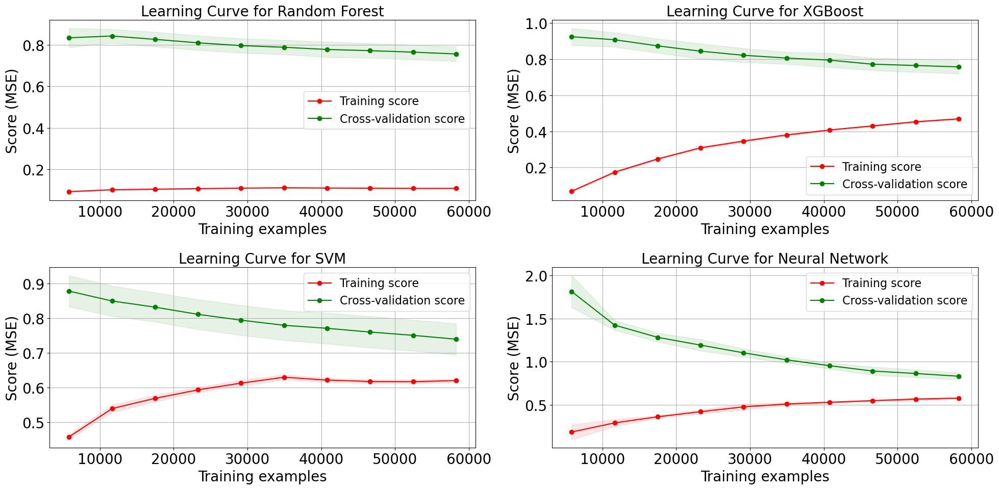

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold

# Apply font size settings
plt.rcParams.update({
    'font.size': 20,
    'axes.labelsize': 20,
    'axes.titlesize': 20,
    'legend.fontsize': 16
})

data = filtered_data_standardized
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define cross-validation strategy
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Define the number of training examples to use for generating the learning curves
train_sizes = np.linspace(0.1, 1.0, 10)

plt.figure(figsize=(20, 10))

for i, (name, model) in enumerate(models.items(), 1):
    plt.subplot(2, 2, i)
    
    # Generate learning curves
    train_sizes_abs, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes,
        scoring='neg_mean_squared_error')

    # Calculate mean and standard deviation for training set scores
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    
    # Calculate mean and standard deviation for test set scores
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    # Plot learning curve for the training set
    plt.fill_between(train_sizes_abs, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.plot(train_sizes_abs, train_scores_mean, 'o-', color="r",
             label="Training score")
    
    # Plot learning curve for the test set
    plt.fill_between(train_sizes_abs, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes_abs, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    # Labels and title
    plt.title(f"Learning Curve for {name}")
    plt.xlabel("Training examples")
    plt.ylabel("Score (MSE)")
    plt.legend(loc="best")
    plt.grid()

plt.tight_layout()
plt.show()


In [121]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


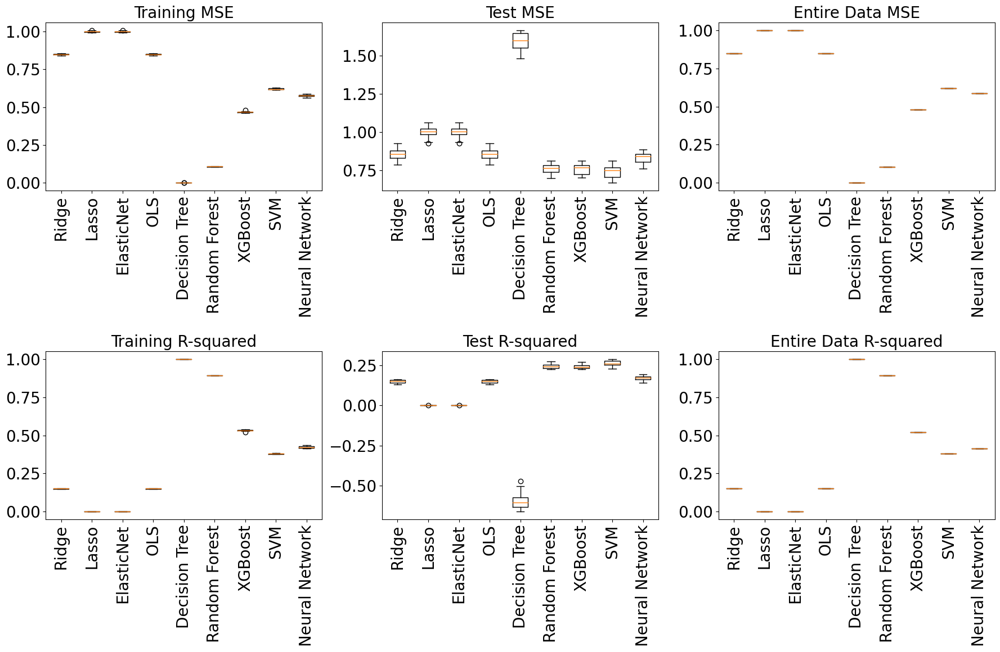

In [122]:
# Apply font size settings
plt.rcParams.update({
    'font.size': 20,
    'axes.labelsize': 20,
    'axes.titlesize': 20,
    'legend.fontsize': 16
})

data = filtered_data_standardized
# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "ElasticNet": ElasticNet(),
    "OLS": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionaries to store results
results = {name: {'mse_train': [], 'r2_train': [], 'mse_test': [], 'r2_test': [], 'mse_entire': [], 'r2_entire': []} for name in models}

# Perform 10-fold cross-validation for each model
for name, model in models.items():
    for train_index, test_index in kf.split(X):
        # Split data into training and test sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Fit the model on the training data and predict on both training and test sets
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Evaluate the model
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        # Store the results
        results[name]['mse_train'].append(mse_train)
        results[name]['r2_train'].append(r2_train)
        results[name]['mse_test'].append(mse_test)
        results[name]['r2_test'].append(r2_test)
        
        # Fit the model on the entire dataset and evaluate
        model.fit(X, y)
        y_pred_entire = model.predict(X)
        mse_entire = mean_squared_error(y, y_pred_entire)
        r2_entire = r2_score(y, y_pred_entire)
        results[name]['mse_entire'].append(mse_entire)
        results[name]['r2_entire'].append(r2_entire)

# Create the box plots
plt.figure(figsize=(18, 12))

# Plot for MSE
for i, (metric, title) in enumerate(zip(['mse_train', 'mse_test', 'mse_entire'], ["Training MSE", "Test MSE", "Entire Data MSE"]), 1):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

# Plot for R-squared
for i, (metric, title) in enumerate(zip(['r2_train', 'r2_test', 'r2_entire'], ["Training R-squared", "Test R-squared", "Entire Data R-squared"]), 4):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


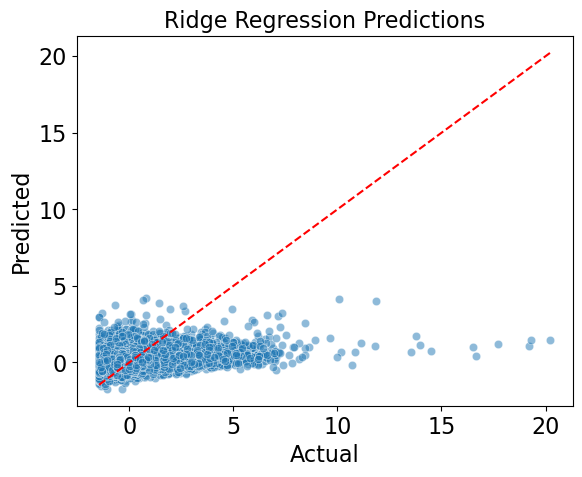

   Alpha       MSE       R^2          Bias     Error
0    0.1  0.849520  0.150480 -1.361067e-17  0.849520
1    1.0  0.849546  0.150454 -2.634323e-17  0.849546
2    3.0  0.849556  0.150444 -3.863674e-17  0.849556
3    5.0  0.849558  0.150442 -2.546512e-17  0.849558
4   10.0  0.849560  0.150440 -4.390538e-18  0.849560


In [93]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
# Split the data into features and target variable
X = filtered_data_standardized.drop(['fv', 'bp'], axis=1)
y = filtered_data_standardized['fv']

# Define alpha values for ridge regularization
alpha_values = [0.1, 1.0, 3.0, 5.0, 10.0]

# Initialize results list
results = []

# Loop over different values of alpha
for alpha in alpha_values:
    # Instantiate and fit a Ridge regression model
    ridge_model = Ridge(alpha=alpha)
    ridge_model.fit(X, y)
    
    # Predict on the same dataset
    y_pred = ridge_model.predict(X)
    
    # Calculate the error metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    bias = np.mean(y_pred - y)  # Mean prediction error
    error = mse  # Mean squared error can represent the error
    
    # Append the results
    results.append({
        'Alpha': alpha,
        'MSE': mse,
        'R^2': r2,
        'Bias': bias,
        'Error': error
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot actual vs predicted values
sns.scatterplot(x=y, y=y_pred, alpha=0.5)
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Line for perfect predictions
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Ridge Regression Predictions')
plt.show()

# Display the results DataFrame
print(results_df)


In [12]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import make_pipeline


# Split the data into features and target variable
X = filtered_data_standardized.drop(['fv', 'bp'], axis=1)
y = filtered_data_standardized['fv']

# Define alpha values for ridge regularization
alpha_values = [0.1, 1.0, 3.0, 5.0, 10.0]

# Define the degree of the polynomial features
degree = 2  # Example degree

# Initialize results list
results = []

# Loop over different values of alpha
for alpha in alpha_values:
    # Create a pipeline that first creates polynomial features, then applies Ridge regression
    model = make_pipeline(PolynomialFeatures(degree), Ridge(alpha=alpha))
    
    # Fit the model to the data
    model.fit(X, y)
    
    # Predict on the same dataset
    y_pred = model.predict(X)
    
    # Calculate the error metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    
    # Append the results
    results.append({
        'Alpha': alpha,
        'Degree': degree,
        'MSE': mse,
        'R^2': r2
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results DataFrame
print(results_df)


   Alpha  Degree       MSE       R^2
0    0.1       2  0.734876  0.265124
1    1.0       2  0.735528  0.264472
2    3.0       2  0.735689  0.264311
3    5.0       2  0.735733  0.264267
4   10.0       2  0.735774  0.264226


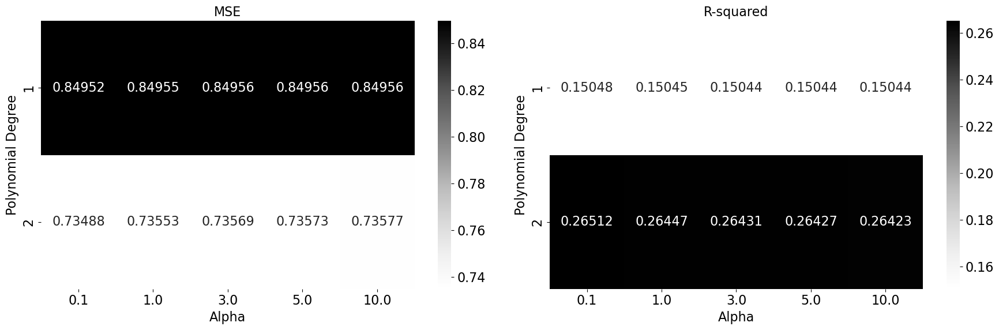

In [76]:
# Correcting the code and retrying the heatmap generation

# Importing necessary libraries
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Data for Panel A as provided in a structured format
panel_a_data = [
    {'Alpha': 0.1, 'Degree': 1, 'MSE': 0.849520, 'R^2': 0.150480},
    {'Alpha': 1.0, 'Degree': 1, 'MSE': 0.849546, 'R^2': 0.150454},
    {'Alpha': 3.0, 'Degree': 1, 'MSE': 0.849556, 'R^2': 0.150444},
    {'Alpha': 5.0, 'Degree': 1, 'MSE': 0.849558, 'R^2': 0.150442},
    {'Alpha': 10.0, 'Degree': 1, 'MSE': 0.849560, 'R^2': 0.150440},
    {'Alpha': 0.1, 'Degree': 2, 'MSE': 0.734876, 'R^2': 0.265124},
    {'Alpha': 1.0, 'Degree': 2, 'MSE': 0.735528, 'R^2': 0.264472},
    {'Alpha': 3.0, 'Degree': 2, 'MSE': 0.735689, 'R^2': 0.264311},
    {'Alpha': 5.0, 'Degree': 2, 'MSE': 0.735733, 'R^2': 0.264267},
    {'Alpha': 10.0, 'Degree': 2, 'MSE': 0.735774, 'R^2': 0.264226}
]

# Convert to DataFrame
df_panel_a = pd.DataFrame(panel_a_data)

# Create a pivot table for MSE and R^2
pivot_mse = df_panel_a.pivot_table(index='Degree', columns='Alpha', values='MSE')
pivot_r2 = df_panel_a.pivot_table(index='Degree', columns='Alpha', values='R^2')

# Set up the matplotlib figure for two subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Create heatmaps
sns.heatmap(pivot_mse, annot=True, fmt=".5g", cmap="Greys", ax=axes[0])
sns.heatmap(pivot_r2, annot=True, fmt=".5g", cmap="Greys", ax=axes[1])

# Set titles for subplots
axes[0].set_title('MSE')
axes[1].set_title('R-squared')

# Set axis labels
for ax in axes:
    ax.set_xlabel('Alpha')
    ax.set_ylabel('Polynomial Degree')

# Adjust layout for better fit
plt.tight_layout()

# Display the plot
plt.show()


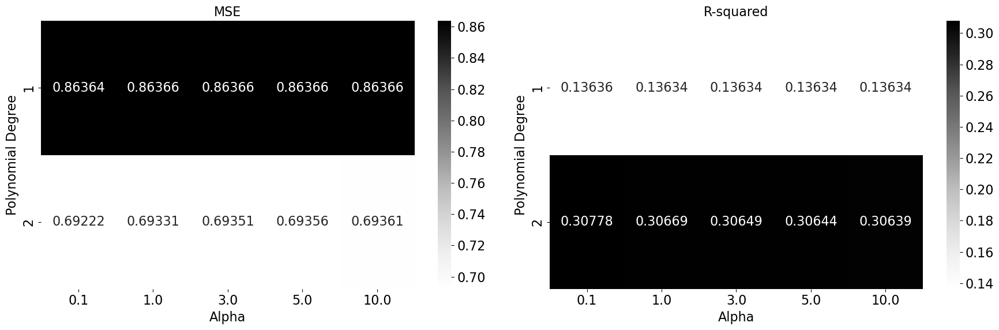

In [77]:
panel_b_data = [
    {'Alpha': 0.1, 'Degree': 1, 'MSE': 0.863642, 'R^2': 0.136358},
    {'Alpha': 1.0, 'Degree': 1, 'MSE': 0.863658, 'R^2': 0.136342},
    {'Alpha': 3.0, 'Degree': 1, 'MSE': 0.863661, 'R^2': 0.136339},
    {'Alpha': 5.0, 'Degree': 1, 'MSE': 0.863662, 'R^2': 0.136338},
    {'Alpha': 10.0, 'Degree': 1, 'MSE': 0.863662, 'R^2': 0.136338},
    {'Alpha': 0.1, 'Degree': 2, 'MSE': 0.692224, 'R^2': 0.307776},
    {'Alpha': 1.0, 'Degree': 2, 'MSE': 0.693306, 'R^2': 0.306694},
    {'Alpha': 3.0, 'Degree': 2, 'MSE': 0.693510, 'R^2': 0.306490},
    {'Alpha': 5.0, 'Degree': 2, 'MSE': 0.693561, 'R^2': 0.306439},
    {'Alpha': 10.0, 'Degree': 2, 'MSE': 0.693612, 'R^2': 0.306388}
]

# Convert to DataFrame
df_panel_b = pd.DataFrame(panel_b_data)

# Create a pivot table for MSE and R^2
pivot_mse = df_panel_b.pivot_table(index='Degree', columns='Alpha', values='MSE')
pivot_r2 = df_panel_b.pivot_table(index='Degree', columns='Alpha', values='R^2')

# Set up the matplotlib figure for two subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Create heatmaps
sns.heatmap(pivot_mse, annot=True, fmt=".5g", cmap="Greys", ax=axes[0])
sns.heatmap(pivot_r2, annot=True, fmt=".5g", cmap="Greys", ax=axes[1])

# Set titles for subplots
axes[0].set_title('MSE')
axes[1].set_title('R-squared')

# Set axis labels
for ax in axes:
    ax.set_xlabel('Alpha')
    ax.set_ylabel('Polynomial Degree')

# Adjust layout for better fit
plt.tight_layout()

# Display the plot
plt.show()


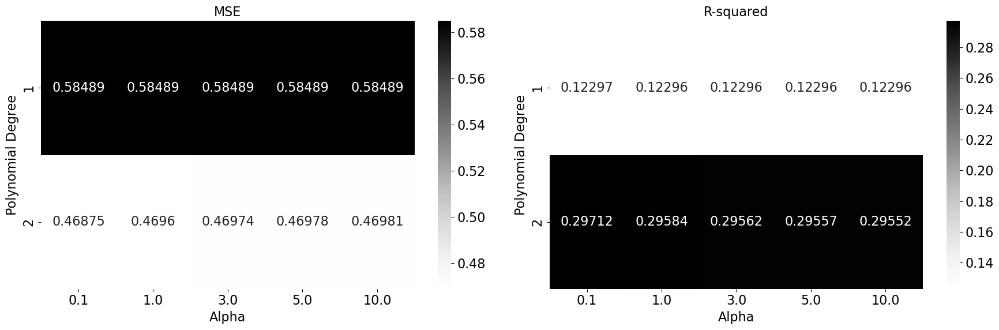

In [86]:
# Data for Panel C as provided in a structured format
panel_c_data = [
    {'Alpha': 0.1, 'Degree': 1, 'MSE': 0.584887, 'R^2': 0.122968},
    {'Alpha': 1.0, 'Degree': 1, 'MSE': 0.584891, 'R^2': 0.122961},
    {'Alpha': 3.0, 'Degree': 1, 'MSE': 0.584892, 'R^2': 0.122959},
    {'Alpha': 5.0, 'Degree': 1, 'MSE': 0.584892, 'R^2': 0.122959},
    {'Alpha': 10.0, 'Degree': 1, 'MSE': 0.584893, 'R^2': 0.122959},
    {'Alpha': 0.1, 'Degree': 2, 'MSE': 0.468749, 'R^2': 0.297115},
    {'Alpha': 1.0, 'Degree': 2, 'MSE': 0.469597, 'R^2': 0.295843},
    {'Alpha': 3.0, 'Degree': 2, 'MSE': 0.469743, 'R^2': 0.295624},
    {'Alpha': 5.0, 'Degree': 2, 'MSE': 0.469778, 'R^2': 0.295572},
    {'Alpha': 10.0, 'Degree': 2, 'MSE': 0.469812, 'R^2': 0.295521}
]

# Convert to DataFrame
df_panel_c = pd.DataFrame(panel_c_data)

# Create a pivot table for MSE and R^2
pivot_mse_c = df_panel_c.pivot_table(index='Degree', columns='Alpha', values='MSE')
pivot_r2_c = df_panel_c.pivot_table(index='Degree', columns='Alpha', values='R^2')

# Set up the matplotlib figure for two subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Create heatmaps
sns.heatmap(pivot_mse_c, annot=True, fmt=".5g", cmap="Greys", ax=axes[0])
sns.heatmap(pivot_r2_c, annot=True, fmt=".5g", cmap="Greys", ax=axes[1])

# Set titles for subplots
axes[0].set_title('MSE')
axes[1].set_title('R-squared')

# Set axis labels
for ax in axes:
    ax.set_xlabel('Alpha')
    ax.set_ylabel('Polynomial Degree')

# Adjust layout for better fit
plt.tight_layout()

# Display the plot
plt.show()


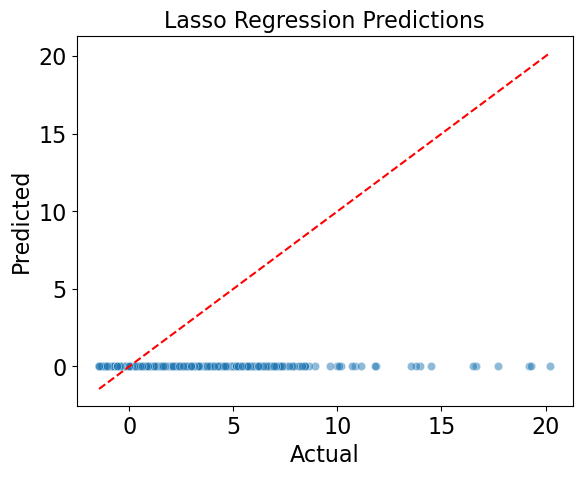

   Alpha       MSE       R^2          Bias     Error
0    0.1  0.931395  0.068605  5.268646e-18  0.931395
1    1.0  1.000000  0.000000 -7.902969e-18  1.000000
2    3.0  1.000000  0.000000 -7.902969e-18  1.000000
3    5.0  1.000000  0.000000 -7.902969e-18  1.000000
4   10.0  1.000000  0.000000 -7.902969e-18  1.000000


In [91]:
# LASSO regularization

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into features and target variable
X = filtered_data_standardized.drop(['fv', 'bp'], axis=1)
y = filtered_data_standardized['fv']

# Define alpha values for lasso regularization
alpha_values = [0.1, 1.0, 3.0, 5.0, 10.0]

# Initialize results list
results = []

# Loop over different values of alpha
for alpha in alpha_values:
    # Instantiate and fit a lasso regression model
    lasso_model = Lasso(alpha=alpha)
    lasso_model.fit(X, y)
    
    # Predict on the same dataset
    y_pred = lasso_model.predict(X)
    
    # Calculate the error metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    bias = np.mean(y_pred - y)  # Mean prediction error
    error = mse  # Mean squared error can represent the error
    
    # Append the results
    results.append({
        'Alpha': alpha,
        'MSE': mse,
        'R^2': r2,
        'Bias': bias,
        'Error': error
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot actual vs predicted values
sns.scatterplot(x=y, y=y_pred, alpha=0.5)
plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red')  # Line for perfect predictions
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Lasso Regression Predictions')
plt.show()

# Display the results DataFrame
print(results_df)


In [92]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import make_pipeline

# Split the data into features and target variable
X = filtered_data_standardized.drop(['fv', 'bp'], axis=1)
y = filtered_data_standardized['fv']

# Define alpha values for lasso regularization
alpha_values = [0.1, 1.0, 3.0, 5.0, 10.0]

# Define the degree of the polynomial features
degree = 2  # Example degree

# Initialize results list
results = []

# Loop over different values of alpha
for alpha in alpha_values:
    # Create a pipeline that first creates polynomial features, then applies Lasso regression
    model = make_pipeline(PolynomialFeatures(degree), Lasso(alpha=alpha))
    
    # Fit the model to the data
    model.fit(X, y)
    
    # Predict on the same dataset
    y_pred = model.predict(X)
    
    # Calculate the error metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    
    # Append the results
    results.append({
        'Alpha': alpha,
        'Degree': degree,
        'MSE': mse,
        'R^2': r2
    })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results DataFrame
print(results_df)


   Alpha  Degree       MSE       R^2
0    0.1       2  0.925374  0.074626
1    1.0       2  1.000000  0.000000
2    3.0       2  1.000000  0.000000
3    5.0       2  1.000000  0.000000
4   10.0       2  1.000000  0.000000


In [29]:
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
import numpy as np
import matplotlib.pyplot as plt

data = filtered_data_standardized
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define hyperparameter grid for each model
hyperparameters = {
    "Random Forest": {"n_estimators": [100, 200], "max_depth": [10, 20, None]},
    "XGBoost": {"n_estimators": [100, 200], "max_depth": [3, 5, 7], "learning_rate": [0.01, 0.1, 0.2]},
    "SVM": {"C": [0.1, 1, 10], "gamma": ['scale', 'auto']},
    "Neural Network": {"hidden_layer_sizes": [(50,), (100,)], "activation": ['relu', 'tanh']}
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionary to store optimized models
optimized_models = {}

# Perform hyperparameter tuning and cross-validation for each model
for name in models:
    print(f"Tuning hyperparameters for {name}")
    grid_search = GridSearchCV(estimator=models[name],
                               param_grid=hyperparameters[name],
                               cv=kf,
                               scoring='neg_mean_squared_error',  # Change scoring if needed
                               verbose=1)
    grid_search.fit(X, y)
    optimized_models[name] = grid_search.best_estimator_
    print(f"Best parameters for {name}: {grid_search.best_params_}")

# Now you can train each optimized model on the entire dataset and evaluate the performance
for name, model in optimized_models.items():
    print(f"Evaluating optimized {name}")
    model.fit(X, y)
    y_pred = model.predict(X)
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    print(f"{name} - MSE: {mse}, R-squared: {r2}")

Tuning hyperparameters for Random Forest
Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best parameters for Random Forest: {'max_depth': None, 'n_estimators': 200}
Tuning hyperparameters for XGBoost
Fitting 10 folds for each of 18 candidates, totalling 180 fits
Best parameters for XGBoost: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200}
Tuning hyperparameters for SVM
Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best parameters for SVM: {'C': 10, 'gamma': 'scale'}
Tuning hyperparameters for Neural Network
Fitting 10 folds for each of 4 candidates, totalling 40 fits
Best parameters for Neural Network: {'activation': 'relu', 'hidden_layer_sizes': (50,)}
Evaluating optimized Random Forest
Random Forest - MSE: 0.10330368563232743, R-squared: 0.8966963143676726
Evaluating optimized XGBoost
XGBoost - MSE: 0.29812592850165787, R-squared: 0.7018740714983422
Evaluating optimized SVM
SVM - MSE: 0.344060531746672, R-squared: 0.655939468253328
Evaluating op

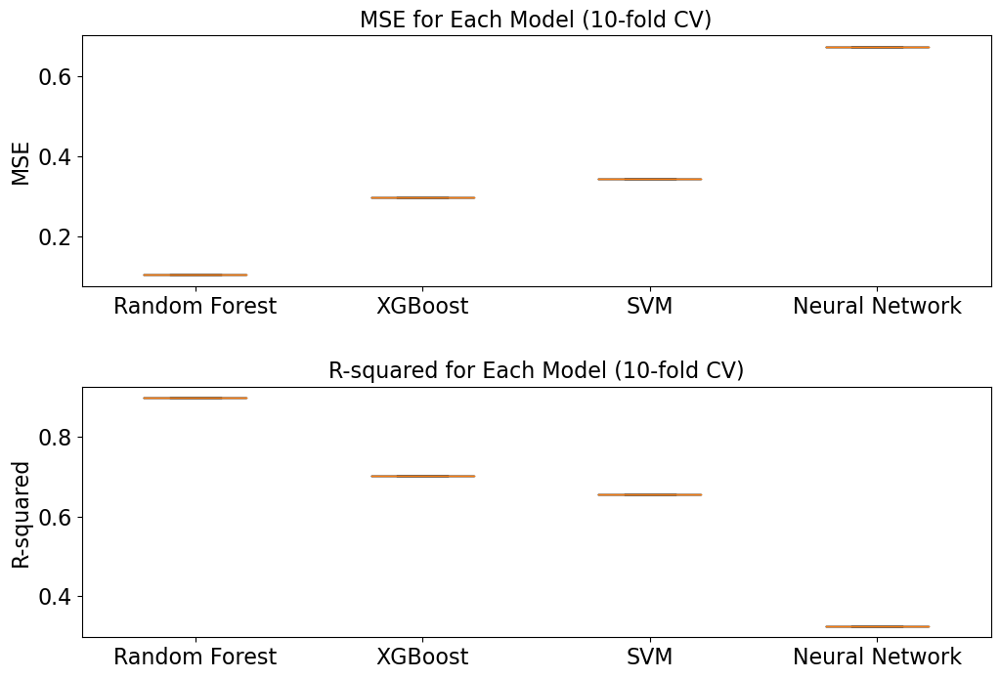

In [97]:
# Reconstructing the previous code snippet with the provided results to visualize MSE and R-squared values

# Given MSE and R-squared values from the previous results
mse_results = {
    'Random Forest': [0.10330368563232743],
    'XGBoost': [0.29812592850165787],
    'SVM': [0.344060531746672],
    'Neural Network': [0.6742580432598911]
}

r2_results = {
    'Random Forest': [0.8966963143676726],
    'XGBoost': [0.7018740714983422],
    'SVM': [0.655939468253328],
    'Neural Network': [0.3257419567401091]
}

# Create subplots for MSE and R-squared box plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
fig.subplots_adjust(hspace=0.4)

# Plot box plots for MSE results
axes[0].boxplot(mse_results.values(), labels=mse_results.keys())
axes[0].set_title("MSE for Each Model (10-fold CV)")
axes[0].set_ylabel("MSE")

# Plot box plots for R-squared results
axes[1].boxplot(r2_results.values(), labels=r2_results.keys())
axes[1].set_title("R-squared for Each Model (10-fold CV)")
axes[1].set_ylabel("R-squared")

# Show the plots
plt.show()


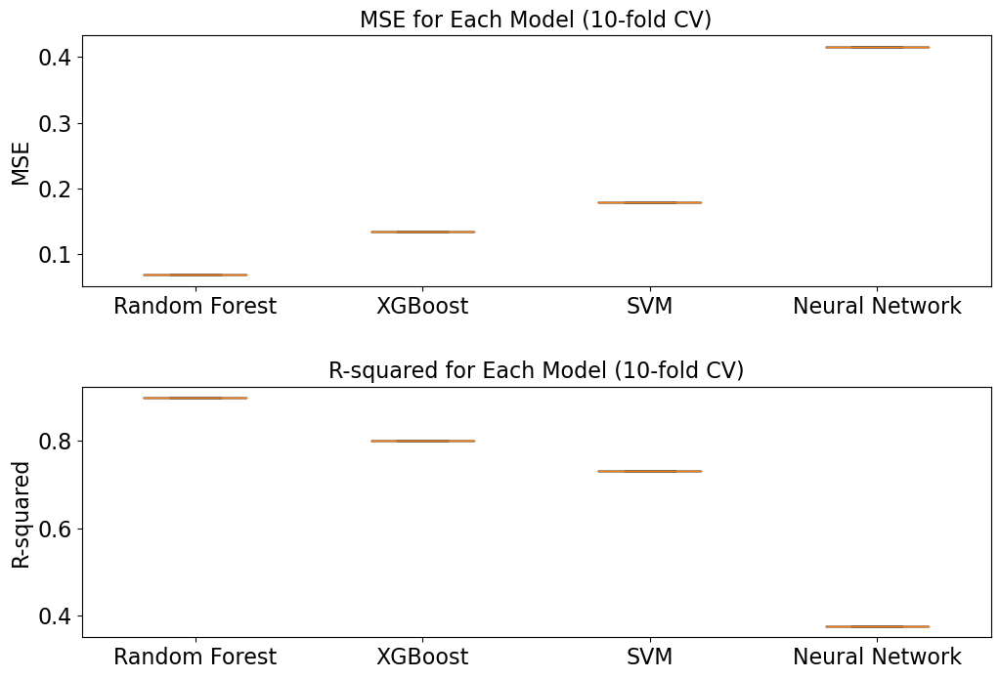

In [98]:
# This is for PANEL C

# Given MSE and R-squared values from the previous results
mse_results = {
    'Random Forest': [0.0689247394181435],
    'XGBoost': [0.1343792843068235],
    'SVM': [0.1794293822128442],
    'Neural Network': [0.41529607909903865]
}

r2_results = {
    'Random Forest': [0.8966479593043576],
    'XGBoost': [0.7984994447918914],
    'SVM': [0.7309472191116577],
    'Neural Network': [0.37726718112936364]
}

# Create subplots for MSE and R-squared box plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
fig.subplots_adjust(hspace=0.4)

# Plot box plots for MSE results
axes[0].boxplot(mse_results.values(), labels=mse_results.keys())
axes[0].set_title("MSE for Each Model (10-fold CV)")
axes[0].set_ylabel("MSE")

# Plot box plots for R-squared results
axes[1].boxplot(r2_results.values(), labels=r2_results.keys())
axes[1].set_title("R-squared for Each Model (10-fold CV)")
axes[1].set_ylabel("R-squared")

# Show the plots
plt.show()


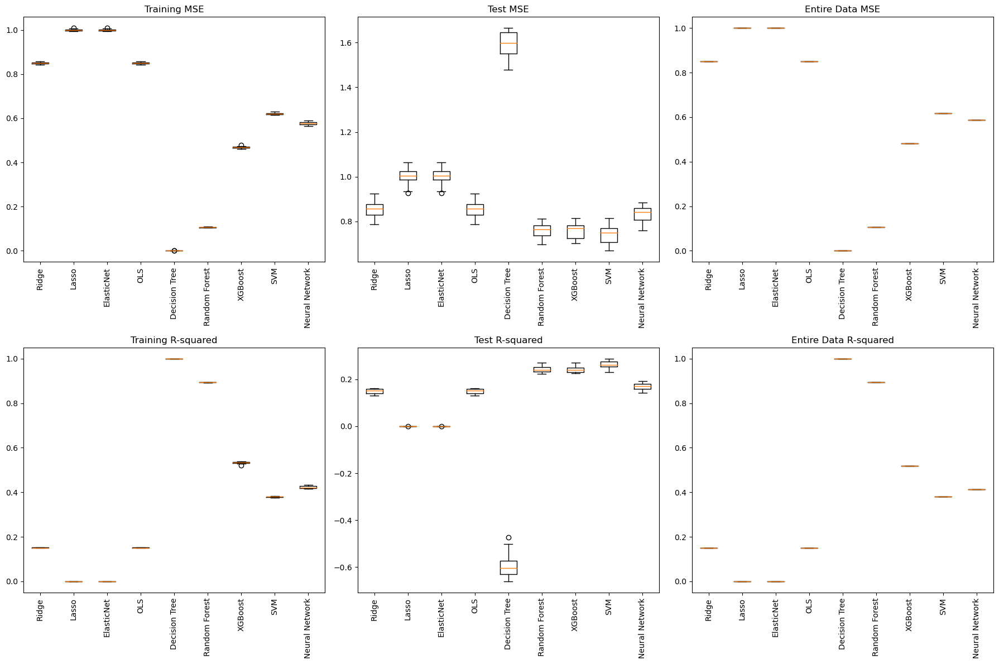

In [18]:
data = filtered_data_standardized
# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "ElasticNet": ElasticNet(),
    "OLS": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionaries to store results
results = {name: {'mse_train': [], 'r2_train': [], 'mse_test': [], 'r2_test': [], 'mse_entire': [], 'r2_entire': []} for name in models}

# Perform 10-fold cross-validation for each model
for name, model in models.items():
    for train_index, test_index in kf.split(X):
        # Split data into training and test sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Fit the model on the training data and predict on both training and test sets
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Evaluate the model
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        # Store the results
        results[name]['mse_train'].append(mse_train)
        results[name]['r2_train'].append(r2_train)
        results[name]['mse_test'].append(mse_test)
        results[name]['r2_test'].append(r2_test)
        
        # Fit the model on the entire dataset and evaluate
        model.fit(X, y)
        y_pred_entire = model.predict(X)
        mse_entire = mean_squared_error(y, y_pred_entire)
        r2_entire = r2_score(y, y_pred_entire)
        results[name]['mse_entire'].append(mse_entire)
        results[name]['r2_entire'].append(r2_entire)

# Create the box plots
plt.figure(figsize=(18, 12))

# Plot for MSE
for i, (metric, title) in enumerate(zip(['mse_train', 'mse_test', 'mse_entire'], ["Training MSE", "Test MSE", "Entire Data MSE"]), 1):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

# Plot for R-squared
for i, (metric, title) in enumerate(zip(['r2_train', 'r2_test', 'r2_entire'], ["Training R-squared", "Test R-squared", "Entire Data R-squared"]), 4):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


In [17]:
# Load the data
data = filtered_data_standardized

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the alpha/lambda values
alphas = [0.1, 1.0, 3.0, 5.0, 10.0]

# Define the number of folds
n_folds = 10

# Initialize lists to store the results
results = []

# Perform k-fold cross-validation
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

for alpha in alphas:
    # Perform Lasso regression
    lasso_cv = LassoCV(alphas=[alpha], cv=kf)
    lasso_cv.fit(X_train, y_train)
    lasso_train_pred = lasso_cv.predict(X_train)
    lasso_test_pred = lasso_cv.predict(X_test)
    lasso_train_r2 = r2_score(y_train, lasso_train_pred)
    lasso_train_mse = mean_squared_error(y_train, lasso_train_pred)
    lasso_train_rmse = np.sqrt(lasso_train_mse)
    lasso_test_r2 = r2_score(y_test, lasso_test_pred)
    lasso_test_mse = mean_squared_error(y_test, lasso_test_pred)
    lasso_test_rmse = np.sqrt(lasso_test_mse)
    results.append(['Lasso', alpha, lasso_train_r2, lasso_train_mse, lasso_train_rmse, lasso_test_r2, lasso_test_mse, lasso_test_rmse])

    # Perform Ridge regression
    ridge_cv = RidgeCV(alphas=[alpha], cv=kf)
    ridge_cv.fit(X_train, y_train)
    ridge_train_pred = ridge_cv.predict(X_train)
    ridge_test_pred = ridge_cv.predict(X_test)
    ridge_train_r2 = r2_score(y_train, ridge_train_pred)
    ridge_train_mse = mean_squared_error(y_train, ridge_train_pred)
    ridge_train_rmse = np.sqrt(ridge_train_mse)
    ridge_test_r2 = r2_score(y_test, ridge_test_pred)
    ridge_test_mse = mean_squared_error(y_test, ridge_test_pred)
    ridge_test_rmse = np.sqrt(ridge_test_mse)
    results.append(['Ridge', alpha, ridge_train_r2, ridge_train_mse, ridge_train_rmse, ridge_test_r2, ridge_test_mse, ridge_test_rmse])

    # Perform Elastic Net regression
    elastic_net_cv = ElasticNetCV(alphas=[alpha], cv=kf)
    elastic_net_cv.fit(X_train, y_train)
    elastic_net_train_pred = elastic_net_cv.predict(X_train)
    elastic_net_test_pred = elastic_net_cv.predict(X_test)
    elastic_net_train_r2 = r2_score(y_train, elastic_net_train_pred)
    elastic_net_train_mse = mean_squared_error(y_train, elastic_net_train_pred)
    elastic_net_train_rmse = np.sqrt(elastic_net_train_mse)
    elastic_net_test_r2 = r2_score(y_test, elastic_net_test_pred)
    elastic_net_test_mse = mean_squared_error(y_test, elastic_net_test_pred)
    elastic_net_test_rmse = np.sqrt(elastic_net_test_mse)
    results.append(['ElasticNet', alpha, elastic_net_train_r2, elastic_net_train_mse, elastic_net_train_rmse, elastic_net_test_r2, elastic_net_test_mse, elastic_net_test_rmse])

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Model', 'Alpha', 'Train R-squared', 'Train MSE', 'Train RMSE', 'Test R-squared', 'Test MSE', 'Test RMSE'])

# Print the results table
results_df


,Model,Alpha,Train R-squared,Train MSE,Train RMSE,Test R-squared,Test MSE,Test RMSE
0,Lasso,0.1,0.069882,0.922155,0.960289,0.064033,0.967924,0.983831
1,Ridge,0.1,0.152396,0.840347,0.916704,0.141760,0.887543,0.942095
2,ElasticNet,0.1,0.114756,0.877665,0.936838,0.106105,0.924415,0.961465
3,Lasso,1.0,0.000000,0.991438,0.995710,-0.000125,1.034273,1.016992
4,Ridge,1.0,0.152359,0.840384,0.916724,0.141765,0.887538,0.942092
5,ElasticNet,1.0,0.000000,0.991438,0.995710,-0.000125,1.034273,1.016992
6,Lasso,3.0,0.000000,0.991438,0.995710,-0.000125,1.034273,1.016992
7,Ridge,3.0,0.152348,0.840394,0.916730,0.141763,0.887540,0.942094
8,ElasticNet,3.0,0.000000,0.991438,0.995710,-0.000125,1.034273,1.016992
9,Lasso,5.0,0.000000,0.991438,0.995710,-0.000125,1.034273,1.016992


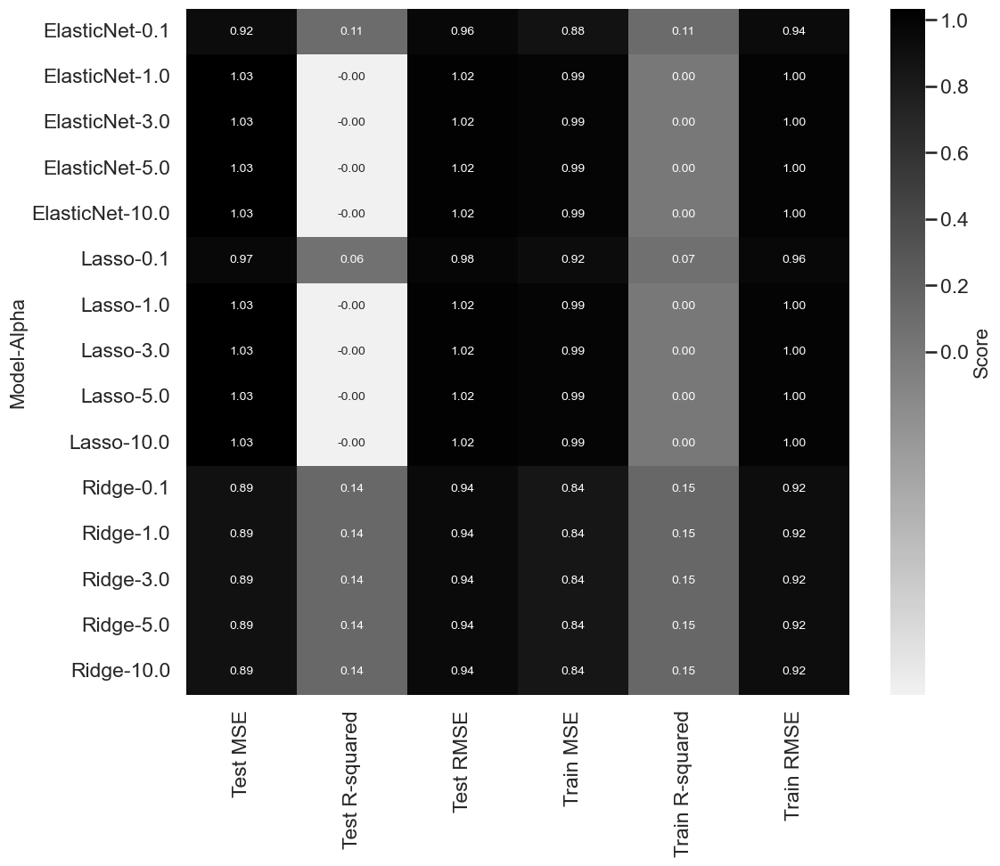

In [23]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

data = {
    'Model': ['Lasso', 'Ridge', 'ElasticNet'] * 5,
    'Alpha': [0.1, 0.1, 0.1, 1.0, 1.0, 1.0, 3.0, 3.0, 3.0, 5.0, 5.0, 5.0, 10.0, 10.0, 10.0],
    'Train R-squared': [0.069882, 0.152396, 0.114756, 0.0, 0.152359, 0.0, 0.0, 0.152348, 0.0, 0.0, 0.152345, 0.0, 0.0, 0.152343, 0.0],
    'Train MSE': [0.922155, 0.840347, 0.877665, 0.991438, 0.840384, 0.991438, 0.991438, 0.840394, 0.991438, 0.991438, 0.840397, 0.991438, 0.991438, 0.840399, 0.991438],
    'Train RMSE': [0.960289, 0.916704, 0.936838, 0.995710, 0.916724, 0.995710, 0.995710, 0.916730, 0.995710, 0.995710, 0.916732, 0.995710, 0.995710, 0.916733, 0.995710],
    'Test R-squared': [0.064033, 0.141760, 0.106105, -0.000125, 0.141765, -0.000125, -0.000125, 0.141763, -0.000125, -0.000125, 0.141762, -0.000125, -0.000125, 0.141761, -0.000125],
    'Test MSE': [0.967924, 0.887543, 0.924415, 1.034273, 0.887538, 1.034273, 1.034273, 0.887540, 1.034273, 1.034273, 0.887541, 1.034273, 1.034273, 0.887542, 1.034273],
    'Test RMSE': [0.983831, 0.942095, 0.961465, 1.016992, 0.942092, 1.016992, 1.016992, 0.942094, 1.016992, 1.016992, 0.942094, 1.016992, 1.016992, 0.942094, 1.016992]
}


df = pd.DataFrame(data)

# Set the color map to a grayscale
cmap = sns.light_palette("black", as_cmap=True)

# Create a custom diverging colormap
# We'll make the negative values a lighter shade and positive values darker
norm = TwoSlopeNorm(vmin=df[['Train R-squared', 'Train MSE', 'Train RMSE', 'Test R-squared', 'Test MSE', 'Test RMSE']].min().min(), 
                     vcenter=0, 
                     vmax=df[['Train R-squared', 'Train MSE', 'Train RMSE', 'Test R-squared', 'Test MSE', 'Test RMSE']].max().max())

# Pivot the DataFrame for the heatmap
heatmap_data = df.pivot_table(index=['Model', 'Alpha'], 
                              values=['Train R-squared', 'Train MSE', 'Train RMSE', 'Test R-squared', 'Test MSE', 'Test RMSE'],
                              aggfunc='mean')  # ensure aggregation method is specified if needed

# Plot a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap=cmap, norm=norm, cbar_kws={'label': 'Score'})
plt.title('')  # Corrected title
plt.show()


# graphs for 31776 

In [81]:
filtered_data = pd.read_csv('data_final_full.csv')
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [82]:
# Filter the columns in df_IV that include "DRX" in their names
drx_columns = [col for col in filtered_data.columns if 'DRX' in col]
filtered_data = filtered_data.drop(columns=drx_columns)
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.420000,182.0,3.00,1.098612
1,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,1.890000,182.0,3.00,1.098612
2,74674.0,41475.0,C-41475,5,0.0,1.0,2.0,2.0,2.0,3.0,...,2.0,59356.356426,60045.772497,26282.0,4.0,1.0,2.549986,182.0,3.00,1.098612
3,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,3.120000,208.0,2.50,0.916291
4,74675.0,41477.0,C-41477,5,0.0,1.0,1.0,2.0,2.0,3.0,...,2.0,9935.266183,10074.150074,26283.0,4.0,1.0,1.140000,208.0,2.50,0.916291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.00,2.484907
64730,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.00,2.484907
64731,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.75,0.559616
64732,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.75,0.559616


In [83]:
filtered_data = filtered_data.query("age>=30&age<60").reset_index(drop=True)
filtered_data

,Unnamed: 0_x,SEQN,SEQN_new,SDDSRVYR,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,...,SIAPROXY,WTINT2YR,WTMEC2YR,Unnamed: 0_y.2,work_type,OCD390G,fv,bp,hh_income_percap,ln_hh_income_percap
0,74676.0,41479.0,C-41479,5,3.0,2.0,2.0,2.0,2.0,4.0,...,2.0,8727.797555,9234.055759,26284.0,1.0,2.0,5.400000,174.0,1.600000,0.470004
1,74676.0,41479.0,C-41479,5,3.0,2.0,2.0,2.0,2.0,4.0,...,2.0,8727.797555,9234.055759,26284.0,1.0,2.0,3.340000,174.0,1.600000,0.470004
2,74676.0,41479.0,C-41479,5,3.0,2.0,2.0,2.0,2.0,4.0,...,2.0,8727.797555,9234.055759,26284.0,1.0,2.0,3.373854,174.0,1.600000,0.470004
3,74683.0,41489.0,C-41489,5,3.0,2.0,2.0,2.0,2.0,4.0,...,2.0,25274.173117,25651.324010,26291.0,1.0,2.0,2.370000,186.0,2.333333,0.847298
4,74683.0,41489.0,C-41489,5,3.0,2.0,2.0,2.0,2.0,4.0,...,2.0,25274.173117,25651.324010,26291.0,1.0,2.0,1.330000,186.0,2.333333,0.847298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,3.390000,198.0,12.000000,2.484907
32630,134155.0,102953.0,C-102953,10,6.0,2.0,2.0,2.0,2.0,4.0,...,2.0,61630.380013,63661.951573,64841.0,1.0,1.0,2.475441,198.0,12.000000,2.484907
32631,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,3.520000,238.0,1.750000,0.559616
32632,134158.0,102956.0,C-102956,10,8.0,1.0,2.0,2.0,2.0,3.0,...,2.0,38645.740291,39426.299948,64843.0,4.0,1.0,0.000000,238.0,1.750000,0.559616


In [84]:
filtered_data = filtered_data.rename(columns={'PAQ665': 'exercise'})
filtered_data = filtered_data.rename(columns={'OCD390G': 'work_type1'})

In [85]:
# Now I will drop outliers
filtered_data = filtered_data[filtered_data['exercise12'] <= 8]
filtered_data = filtered_data[filtered_data['alcoholic_beverages'] <= 30]
filtered_data = filtered_data[filtered_data['nuts'] <= 40]
filtered_data = filtered_data[filtered_data['exercise'] <= 8]

In [86]:
columns_to_drop = [
    'Unnamed: 0_x',
    'SEQN',
    'SDDSRVYR',
    'SEQN_new',
    'Unnamed: 0_y',
    'Unnamed: 0_x.1',
    'Unnamed: 0_y.1',
    'Unnamed: 0_x.2',
    'Unnamed: 0_y.2',
    'SDMVSTRA',
    'total_alcohol',
    'veggies',
    'fruit',
    'diastolic',
    'systolic',
    'VNAVEBPXSY',
    'VNLBAVEBPXDI',
    'BMXWT',
    'cholesterol1',
    'DMDHHSIZ',
    'DMDHRAGE',
    'total_hh_income',
    'MIALANG',
    'SIALANG',
    'WTINT2YR',
    'WTMEC2YR',
    'hh_income_percap'
]

# Drop the specified columns
filtered_data = filtered_data.drop(columns=columns_to_drop)
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,1,2.0,2.0,1.0,2.0,5.400000,174.0,0.470004
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,1,2.0,2.0,1.0,2.0,3.340000,174.0,0.470004
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,1,2.0,2.0,1.0,2.0,3.373854,174.0,0.470004
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,1,2.0,2.0,1.0,2.0,2.370000,186.0,0.847298
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,1,2.0,2.0,1.0,2.0,1.330000,186.0,0.847298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1,2,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3,2,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616


In [87]:
# Now I will drop outliers
filtered_data = filtered_data[filtered_data['work_type'] <= 7]
filtered_data = filtered_data[filtered_data['howoftendrinkalc'] <= 400]
filtered_data = filtered_data[filtered_data['cholesterol'] <= 200]
filtered_data = filtered_data[filtered_data['total_grain'] <= 50]
filtered_data = filtered_data[filtered_data['total_milkyogurtcheese'] <= 25]
filtered_data = filtered_data[filtered_data['marital_status'] <= 6]
filtered_data = filtered_data[filtered_data['red_meat'] <= 70]
filtered_data = filtered_data[filtered_data['edu'] <= 5]

In [88]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the DataFrame
filtered_data_standardized = pd.DataFrame(scaler.fit_transform(filtered_data), columns=filtered_data.columns, index=filtered_data.index)

# Display the standardized DataFrame
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,1.641642,-0.835001,-0.731448
1,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.476226,-0.835001,-0.731448
2,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.495379,-0.835001,-0.731448
3,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.072538,-0.348641,-0.295842
4,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.660903,-0.348641,-0.295842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,0.504513,0.137719,1.594864
32630,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,-0.012886,0.137719,1.594864
32631,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,0.578059,1.758919,-0.627986
32632,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,-1.413332,1.758919,-0.627986


In [89]:

# Select the columns of interest
columns_to_check = ['fv', 'bp']

# Calculate the Z-scores for the selected columns
z_scores = np.abs((filtered_data_standardized[columns_to_check] - filtered_data_standardized[columns_to_check].mean()) / filtered_data_standardized[columns_to_check].std())

# Define the Z-score threshold for outliers
z_score_threshold = 3

# Identify outliers based on Z-scores
outliers = (z_scores > z_score_threshold).any(axis=1)

# Print the rows with outliers
outlier_rows = filtered_data_standardized[outliers]
print("Rows with outliers:")
print(outlier_rows)


Rows with outliers:
       howoftendrinkalc    BPQ020    DIQ010  DIQ050_x  HSAQUEX    HSD010  \
9             -0.208673  0.557474  0.180703  0.154364      0.0 -0.838259   
50            -0.208673  0.557474  0.180703  0.154364      0.0  0.191123   
121           -0.208673 -1.386046  0.180703  0.154364      0.0  0.191123   
254           -0.141714 -1.386046  0.180703  0.154364      0.0 -0.838259   
357           -0.074755  0.557474  0.180703  0.154364      0.0 -0.838259   
...                 ...       ...       ...       ...      ...       ...   
32432          0.326998  0.557474  0.180703  0.154364      0.0 -1.867642   
32467          0.059163 -1.386046  0.180703  0.154364      0.0 -0.838259   
32570          0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   
32571          0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   
32572          0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   

         HSQ500    HSQ510    HSQ520    HSQ571  ...      race  RIDST

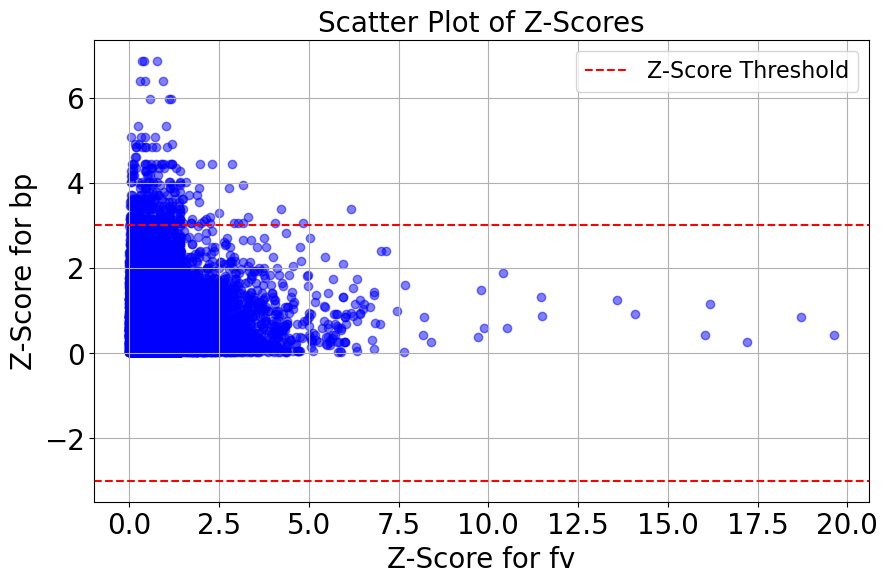

In [90]:
import matplotlib.pyplot as plt

# Select the columns of interest
columns_to_check = ['fv', 'bp']

# Calculate the Z-scores for the selected columns
z_scores = np.abs((filtered_data_standardized[columns_to_check] - filtered_data_standardized[columns_to_check].mean()) / filtered_data_standardized[columns_to_check].std())

# Create scatter plots
plt.figure(figsize=(10, 6))
plt.scatter(z_scores['fv'], z_scores['bp'], c='blue', alpha=0.5)
plt.axhline(y=z_score_threshold, color='red', linestyle='--', label='Z-Score Threshold')
plt.axhline(y=-z_score_threshold, color='red', linestyle='--')
plt.xlabel('Z-Score for fv')
plt.ylabel('Z-Score for bp')
plt.title('Scatter Plot of Z-Scores')
plt.legend()
plt.grid(True)
plt.show()


In [91]:
# Drop the outlier rows from the dataset
filtered_data_no_outliers = filtered_data_standardized[~outliers]

# Confirm the new shape of the dataset
print(f"Original dataset shape: {filtered_data_standardized.shape}")
print(f"Dataset shape after removing outliers: {filtered_data_no_outliers.shape}")


Original dataset shape: (32569, 74)
Dataset shape after removing outliers: (31776, 74)


In [92]:

# Select the columns of interest
columns_to_check = ['fv', 'bp']

# Calculate the Z-scores for the selected columns
z_scores = np.abs((filtered_data_no_outliers[columns_to_check] - filtered_data_no_outliers[columns_to_check].mean()) / filtered_data_no_outliers[columns_to_check].std())

# Define the Z-score threshold for outliers
z_score_threshold = 3

# Identify outliers based on Z-scores
outliers = (z_scores > z_score_threshold).any(axis=1)

# Print the rows with outliers
outlier_rows = filtered_data_no_outliers[outliers]
print("Rows with outliers:")
print(outlier_rows)


Rows with outliers:
       howoftendrinkalc    BPQ020    DIQ010  DIQ050_x  HSAQUEX    HSD010  \
149           -0.275631 -1.386046  0.180703  0.154364      0.0 -1.867642   
161           -0.074755  0.557474  0.180703  0.154364      0.0 -0.838259   
173            0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   
174            0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   
175            0.059163 -1.386046  0.180703  0.154364      0.0  0.191123   
...                 ...       ...       ...       ...      ...       ...   
32279         -0.007796 -1.386046  0.180703  0.154364      0.0 -0.838259   
32302          0.193081  0.557474  0.180703  0.154364      0.0  0.191123   
32357          0.260039  0.557474  0.180703  0.154364      0.0 -1.867642   
32473          0.059163  0.557474  0.180703  0.154364      0.0 -1.867642   
32522          0.126122 -1.386046  0.180703  0.154364      0.0  0.191123   

         HSQ500    HSQ510    HSQ520    HSQ571  ...      race  RIDST

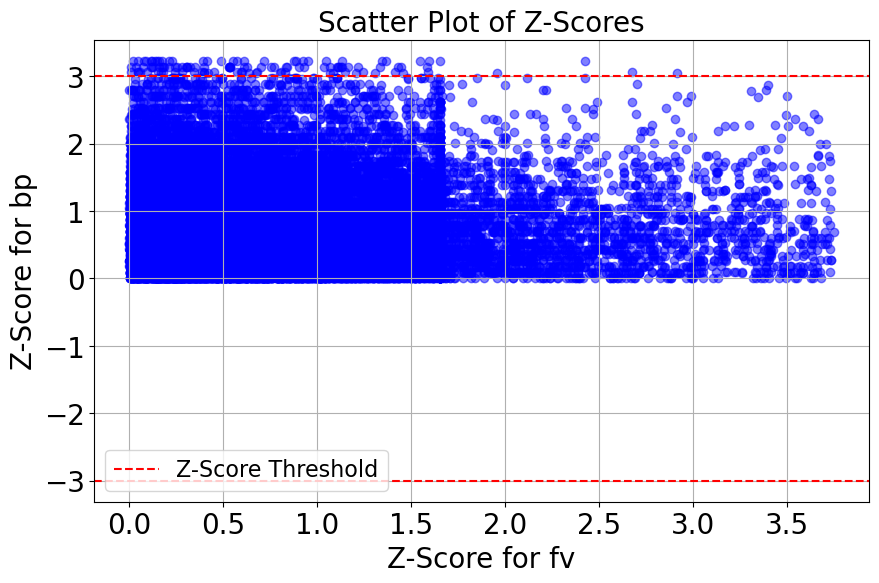

In [93]:
import matplotlib.pyplot as plt

# Select the columns of interest
columns_to_check = ['fv', 'bp']

# Calculate the Z-scores for the selected columns
z_scores = np.abs((filtered_data_no_outliers[columns_to_check] - filtered_data_no_outliers[columns_to_check].mean()) / filtered_data_no_outliers[columns_to_check].std())

# Create scatter plots
plt.figure(figsize=(10, 6))
plt.scatter(z_scores['fv'], z_scores['bp'], c='blue', alpha=0.5)
plt.axhline(y=z_score_threshold, color='red', linestyle='--', label='Z-Score Threshold')
plt.axhline(y=-z_score_threshold, color='red', linestyle='--')
plt.xlabel('Z-Score for fv')
plt.ylabel('Z-Score for bp')
plt.title('Scatter Plot of Z-Scores')
plt.legend()
plt.grid(True)
plt.show()


In [94]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,1.641642,-0.835001,-0.731448
1,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.476226,-0.835001,-0.731448
2,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.495379,-0.835001,-0.731448
3,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.072538,-0.348641,-0.295842
4,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.660903,-0.348641,-0.295842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,0.504513,0.137719,1.594864
32630,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,-0.012886,0.137719,1.594864
32631,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,0.578059,1.758919,-0.627986
32632,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,-1.413332,1.758919,-0.627986


In [95]:
filtered_data_standardized = filtered_data_no_outliers
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,1.641642,-0.835001,-0.731448
1,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.476226,-0.835001,-0.731448
2,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,0.495379,-0.835001,-0.731448
3,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.072538,-0.348641,-0.295842
4,-0.074755,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,-0.968532,0.124992,0.035503,-0.627044,0.700326,-0.660903,-0.348641,-0.295842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,0.504513,0.137719,1.594864
32630,0.126122,0.557474,0.180703,0.154364,0.0,1.220505,0.353451,0.200866,0.107657,0.148476,...,-1.714045,0.0,0.904189,0.124992,0.035503,-0.627044,-0.910929,-0.012886,0.137719,1.594864
32631,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,0.578059,1.758919,-0.627986
32632,0.260039,-1.386046,0.180703,0.154364,0.0,0.191123,0.353451,0.200866,0.107657,0.148476,...,-0.002837,0.0,-0.968532,0.124992,0.035503,1.717191,-0.910929,-1.413332,1.758919,-0.627986


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold

# Apply font size settings
plt.rcParams.update({
    'font.size': 20,
    'axes.labelsize': 20,
    'axes.titlesize': 20,
    'legend.fontsize': 16
})

data = filtered_data_standardized
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define cross-validation strategy
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Define the number of training examples to use for generating the learning curves
train_sizes = np.linspace(0.1, 1.0, 10)

plt.figure(figsize=(20, 10))

for i, (name, model) in enumerate(models.items(), 1):
    plt.subplot(2, 2, i)
    
    # Generate learning curves
    train_sizes_abs, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes,
        scoring='neg_mean_squared_error')

    # Calculate mean and standard deviation for training set scores
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    
    # Calculate mean and standard deviation for test set scores
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    # Plot learning curve for the training set
    plt.fill_between(train_sizes_abs, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.plot(train_sizes_abs, train_scores_mean, 'o-', color="r",
             label="Training score")
    
    # Plot learning curve for the test set
    plt.fill_between(train_sizes_abs, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes_abs, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    # Labels and title
    plt.title(f"Learning Curve for {name}")
    plt.xlabel("Training examples")
    plt.ylabel("Score (MSE)")
    plt.legend(loc="best")
    plt.grid()

plt.tight_layout()
plt.show()


/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages

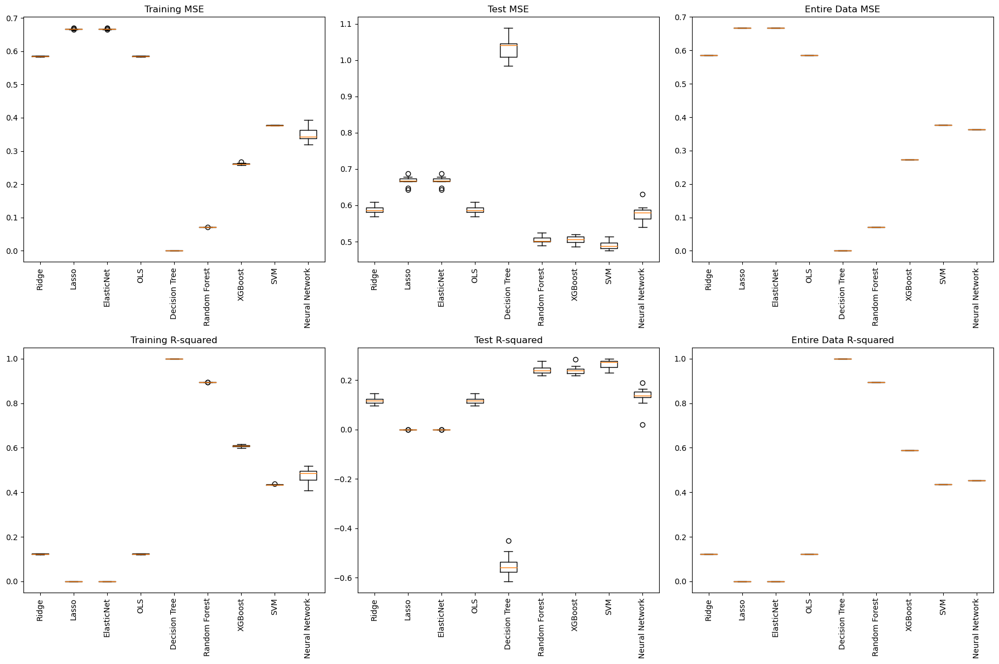

In [34]:
data = filtered_data_standardized
# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "ElasticNet": ElasticNet(),
    "OLS": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionaries to store results
results = {name: {'mse_train': [], 'r2_train': [], 'mse_test': [], 'r2_test': [], 'mse_entire': [], 'r2_entire': []} for name in models}

# Perform 10-fold cross-validation for each model
for name, model in models.items():
    for train_index, test_index in kf.split(X):
        # Split data into training and test sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Fit the model on the training data and predict on both training and test sets
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Evaluate the model
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        # Store the results
        results[name]['mse_train'].append(mse_train)
        results[name]['r2_train'].append(r2_train)
        results[name]['mse_test'].append(mse_test)
        results[name]['r2_test'].append(r2_test)
        
        # Fit the model on the entire dataset and evaluate
        model.fit(X, y)
        y_pred_entire = model.predict(X)
        mse_entire = mean_squared_error(y, y_pred_entire)
        r2_entire = r2_score(y, y_pred_entire)
        results[name]['mse_entire'].append(mse_entire)
        results[name]['r2_entire'].append(r2_entire)

# Create the box plots
plt.figure(figsize=(18, 12))

# Plot for MSE
for i, (metric, title) in enumerate(zip(['mse_train', 'mse_test', 'mse_entire'], ["Training MSE", "Test MSE", "Entire Data MSE"]), 1):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

# Plot for R-squared
for i, (metric, title) in enumerate(zip(['r2_train', 'r2_test', 'r2_entire'], ["Training R-squared", "Test R-squared", "Entire Data R-squared"]), 4):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


# graphs for 32569 

In [ ]:
filtered_data = pd.read_csv('data_final_full.csv')
filtered_data

In [ ]:
# Filter the columns in df_IV that include "DRX" in their names
drx_columns = [col for col in filtered_data.columns if 'DRX' in col]
filtered_data = filtered_data.drop(columns=drx_columns)
filtered_data

In [ ]:
filtered_data = filtered_data.query("age>=30&age<60").reset_index(drop=True)
filtered_data

In [ ]:
filtered_data = filtered_data.rename(columns={'PAQ665': 'exercise'})
filtered_data = filtered_data.rename(columns={'OCD390G': 'work_type1'})

In [ ]:
# Now I will drop outliers
filtered_data = filtered_data[filtered_data['exercise12'] <= 8]
filtered_data = filtered_data[filtered_data['alcoholic_beverages'] <= 30]
filtered_data = filtered_data[filtered_data['nuts'] <= 40]
filtered_data = filtered_data[filtered_data['exercise'] <= 8]

In [ ]:
columns_to_drop = [
    'Unnamed: 0_x',
    'SEQN',
    'SDDSRVYR',
    'SEQN_new',
    'Unnamed: 0_y',
    'Unnamed: 0_x.1',
    'Unnamed: 0_y.1',
    'Unnamed: 0_x.2',
    'Unnamed: 0_y.2',
    'SDMVSTRA',
    'total_alcohol',
    'veggies',
    'fruit',
    'diastolic',
    'systolic',
    'VNAVEBPXSY',
    'VNLBAVEBPXDI',
    'BMXWT',
    'cholesterol1',
    'DMDHHSIZ',
    'DMDHRAGE',
    'total_hh_income',
    'MIALANG',
    'SIALANG',
    'WTINT2YR',
    'WTMEC2YR',
    'hh_income_percap'
]

# Drop the specified columns
filtered_data = filtered_data.drop(columns=columns_to_drop)
filtered_data

In [ ]:
# Now I will drop outliers
filtered_data = filtered_data[filtered_data['work_type'] <= 7]
filtered_data = filtered_data[filtered_data['howoftendrinkalc'] <= 400]
filtered_data = filtered_data[filtered_data['cholesterol'] <= 200]
filtered_data = filtered_data[filtered_data['total_grain'] <= 50]
filtered_data = filtered_data[filtered_data['total_milkyogurtcheese'] <= 25]
filtered_data = filtered_data[filtered_data['marital_status'] <= 6]
filtered_data = filtered_data[filtered_data['red_meat'] <= 70]
filtered_data = filtered_data[filtered_data['edu'] <= 5]

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the DataFrame
filtered_data_standardized = pd.DataFrame(scaler.fit_transform(filtered_data), columns=filtered_data.columns, index=filtered_data.index)

# Display the standardized DataFrame
filtered_data_standardized

In [ ]:
filtered_data_standardized

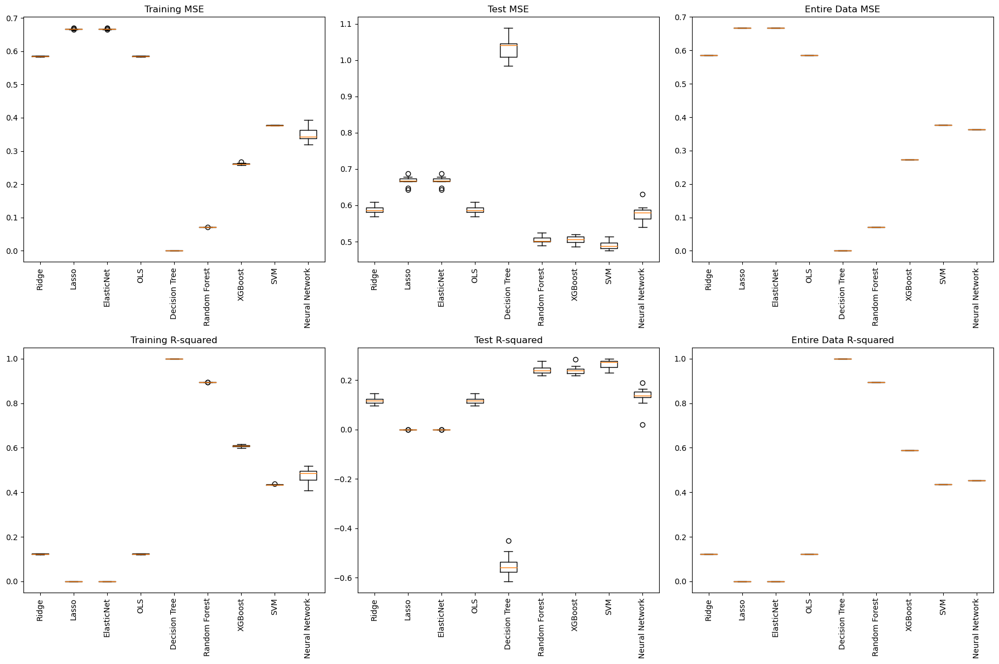

In [34]:
data = filtered_data_standardized
# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "ElasticNet": ElasticNet(),
    "OLS": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionaries to store results
results = {name: {'mse_train': [], 'r2_train': [], 'mse_test': [], 'r2_test': [], 'mse_entire': [], 'r2_entire': []} for name in models}

# Perform 10-fold cross-validation for each model
for name, model in models.items():
    for train_index, test_index in kf.split(X):
        # Split data into training and test sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Fit the model on the training data and predict on both training and test sets
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Evaluate the model
        mse_train = mean_squared_error(y_train, y_train_pred)
        r2_train = r2_score(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        # Store the results
        results[name]['mse_train'].append(mse_train)
        results[name]['r2_train'].append(r2_train)
        results[name]['mse_test'].append(mse_test)
        results[name]['r2_test'].append(r2_test)
        
        # Fit the model on the entire dataset and evaluate
        model.fit(X, y)
        y_pred_entire = model.predict(X)
        mse_entire = mean_squared_error(y, y_pred_entire)
        r2_entire = r2_score(y, y_pred_entire)
        results[name]['mse_entire'].append(mse_entire)
        results[name]['r2_entire'].append(r2_entire)

# Create the box plots
plt.figure(figsize=(18, 12))

# Plot for MSE
for i, (metric, title) in enumerate(zip(['mse_train', 'mse_test', 'mse_entire'], ["Training MSE", "Test MSE", "Entire Data MSE"]), 1):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

# Plot for R-squared
for i, (metric, title) in enumerate(zip(['r2_train', 'r2_test', 'r2_entire'], ["Training R-squared", "Test R-squared", "Entire Data R-squared"]), 4):
    plt.subplot(2, 3, i)
    plt.boxplot([results[name][metric] for name in models], labels=models.keys())
    plt.title(title)
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages

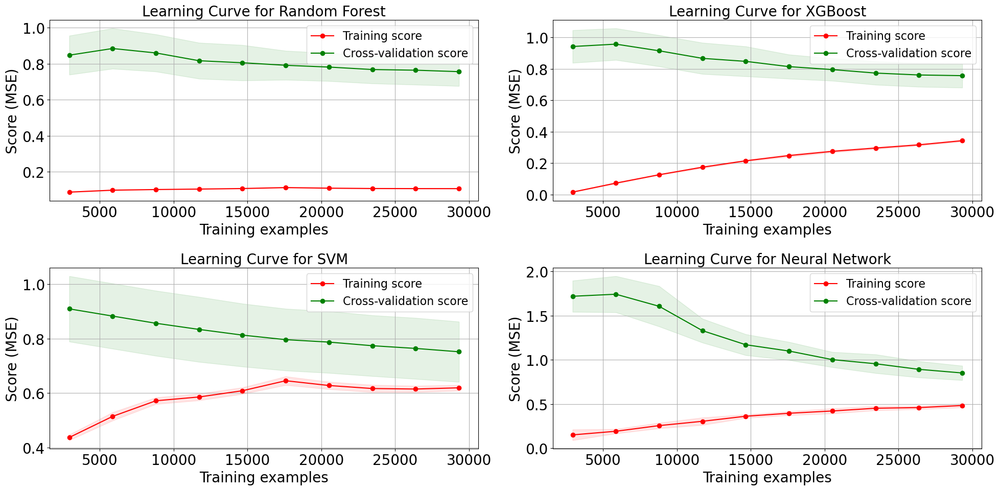

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold

# Apply font size settings
plt.rcParams.update({
    'font.size': 20,
    'axes.labelsize': 20,
    'axes.titlesize': 20,
    'legend.fontsize': 16
})

data = filtered_data_standardized
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define cross-validation strategy
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Define the number of training examples to use for generating the learning curves
train_sizes = np.linspace(0.1, 1.0, 10)

plt.figure(figsize=(20, 10))

for i, (name, model) in enumerate(models.items(), 1):
    plt.subplot(2, 2, i)
    
    # Generate learning curves
    train_sizes_abs, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes,
        scoring='neg_mean_squared_error')

    # Calculate mean and standard deviation for training set scores
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    
    # Calculate mean and standard deviation for test set scores
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    # Plot learning curve for the training set
    plt.fill_between(train_sizes_abs, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.plot(train_sizes_abs, train_scores_mean, 'o-', color="r",
             label="Training score")
    
    # Plot learning curve for the test set
    plt.fill_between(train_sizes_abs, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes_abs, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    # Labels and title
    plt.title(f"Learning Curve for {name}")
    plt.xlabel("Training examples")
    plt.ylabel("Score (MSE)")
    plt.legend(loc="best")
    plt.grid()

plt.tight_layout()
plt.show()


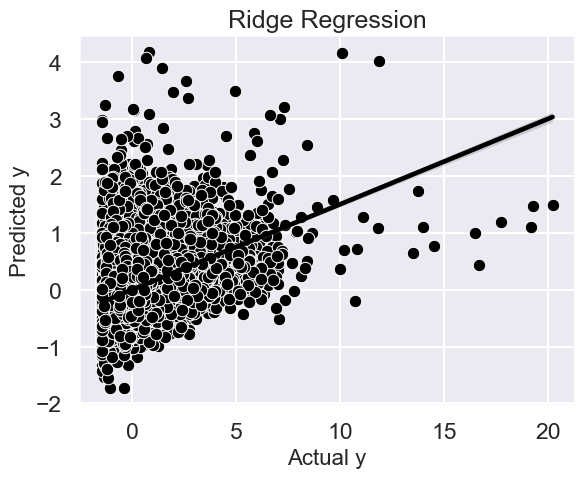

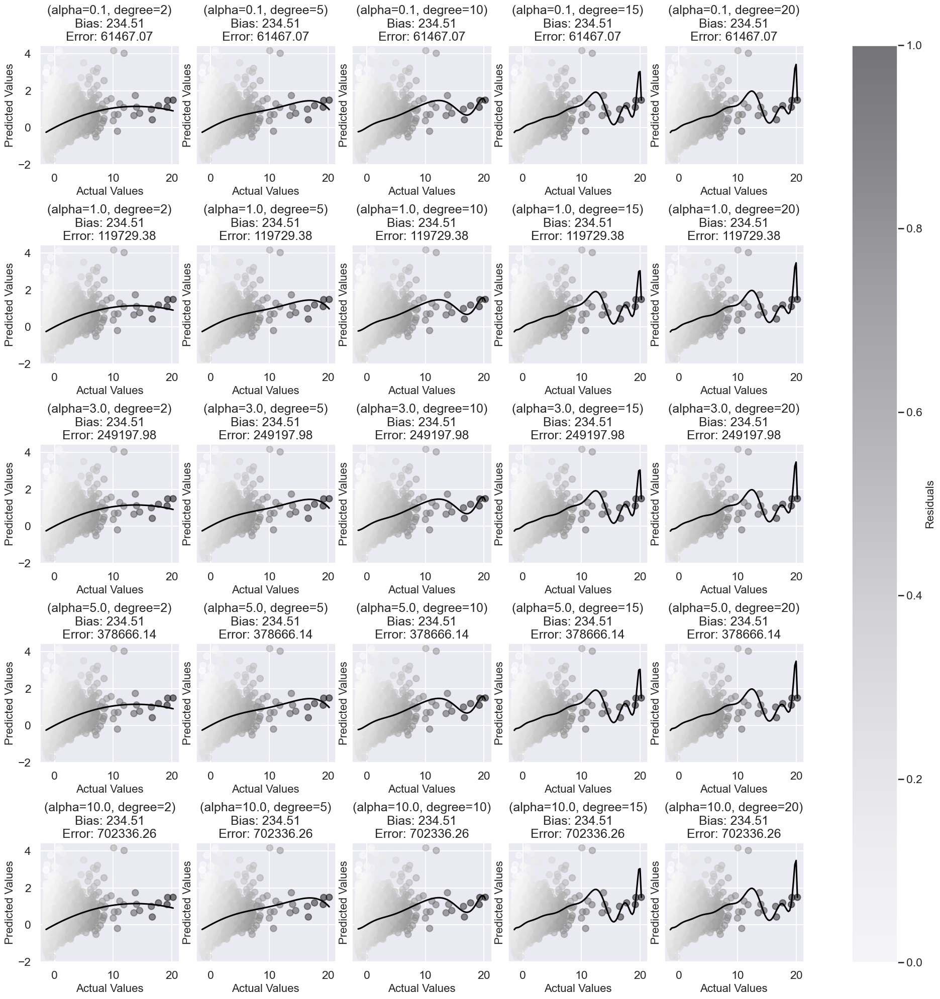

                 Model  Alpha  Degree        Bias          Error
0   Ridge (Whole Data)    0.1       2  234.505487   61467.072867
1   Ridge (Whole Data)    0.1       5  234.505487   61467.072867
2   Ridge (Whole Data)    0.1      10  234.505487   61467.072867
3   Ridge (Whole Data)    0.1      15  234.505487   61467.072867
4   Ridge (Whole Data)    0.1      20  234.505487   61467.072867
5   Ridge (Whole Data)    1.0       2  234.509131  119729.382251
6   Ridge (Whole Data)    1.0       5  234.509131  119729.382251
7   Ridge (Whole Data)    1.0      10  234.509131  119729.382251
8   Ridge (Whole Data)    1.0      15  234.509131  119729.382251
9   Ridge (Whole Data)    1.0      20  234.509131  119729.382251
10  Ridge (Whole Data)    3.0       2  234.510412  249197.982795
11  Ridge (Whole Data)    3.0       5  234.510412  249197.982795
12  Ridge (Whole Data)    3.0      10  234.510412  249197.982795
13  Ridge (Whole Data)    3.0      15  234.510412  249197.982795
14  Ridge (Whole Data)   

In [16]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
# Set the font size for all elements
plt.rcParams.update({'font.size': 10, 'axes.labelsize': 16})

# Load the data
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Instantiate the Ridge model
ridge_model = Ridge()

# Fit the Ridge model to the entire data
ridge_model.fit(X, y)

# Make predictions on the entire data
y_pred = ridge_model.predict(X)

# Calculate the prediction errors
errors = y - y_pred

# Create a DataFrame to hold the actual y values, predicted values, and errors
results_df = pd.DataFrame({'Actual': y, 'Predicted': y_pred, 'Errors': errors})

# Plot the actual y values against the predicted values using the grayscale colormap
sns.scatterplot(data=results_df, x='Actual', y='Predicted', color='black')

# Add a regression line to show the goodness of fit
sns.regplot(data=results_df, x='Actual', y='Predicted', scatter=False, color='black')

# Set the axis labels and title
plt.xlabel("Actual y")
plt.ylabel("Predicted y")
plt.title("Ridge Regression")

# Show the plot
plt.show()

# Define the alpha values
alpha_values = [0.1, 1.0, 3.0, 5.0, 10.0]

# Define the degree values for polynomial functions
degree_values = [2, 5, 10, 15, 20]

# Create subplots for each alpha and degree value combination
fig, axes = plt.subplots(len(alpha_values), len(degree_values), figsize=(20, 20), sharey=True)

# Define the grayscale colormap
cmap = "Greys"

# Create a dummy scatter plot for colorbar creation with the grayscale colormap
dummy_scatter = axes[0, 0].scatter([], [], c=[], cmap=cmap, alpha=0.5)

# Initialize lists to store the results
results = []

for i, alpha in enumerate(alpha_values):
    for j, degree in enumerate(degree_values):
        # Instantiate the Ridge model with the current alpha value
        ridge_model = Ridge(alpha=alpha)

        # Fit the Ridge model to the data
        ridge_model.fit(X, y)

        # Make predictions on the data
        y_pred = ridge_model.predict(X)

        # Calculate the residuals
        residuals = y - y_pred

        # Calculate the bias
        bias = np.linalg.norm(y - y_pred)

        # Calculate the error
        error = np.square(bias) + np.var(residuals) + alpha * len(X)

        # Create a scatter plot of predicted values with the grayscale colormap
        axes[i, j].scatter(y, y_pred, c=residuals, cmap=cmap, alpha=0.5)

        # Fit a polynomial curve to the predicted values
        coefficients = np.polyfit(y, y_pred, degree)
        polynomial = np.poly1d(coefficients)

        # Generate x values for the polynomial curve
        x_values = np.linspace(min(y), max(y), 100)

        # Plot the polynomial curve in black
        axes[i, j].plot(x_values, polynomial(x_values), color='black')

        # Set the title for each subplot with concatenated alpha and degree values
        axes[i, j].set_title(f"(alpha={alpha}, degree={degree})\nBias: {bias:.2f}\nError: {error:.2f}")

        # Set the x-axis label
        axes[i, j].set_xlabel("Actual Values")

        # Set the y-axis label
        axes[i, j].set_ylabel("Predicted Values")

        # Append results to the list
        results.append(['Ridge (Whole Data)', alpha, degree, bias, error])

# Adjust the spacing between subplots
plt.tight_layout()

# Create the colorbar using the dummy scatter plot with the grayscale colormap
cbar = plt.colorbar(dummy_scatter, ax=axes, label="Residuals")

# Show the plot
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Model', 'Alpha', 'Degree', 'Bias', 'Error'])

# Print the results table
print(results_df)


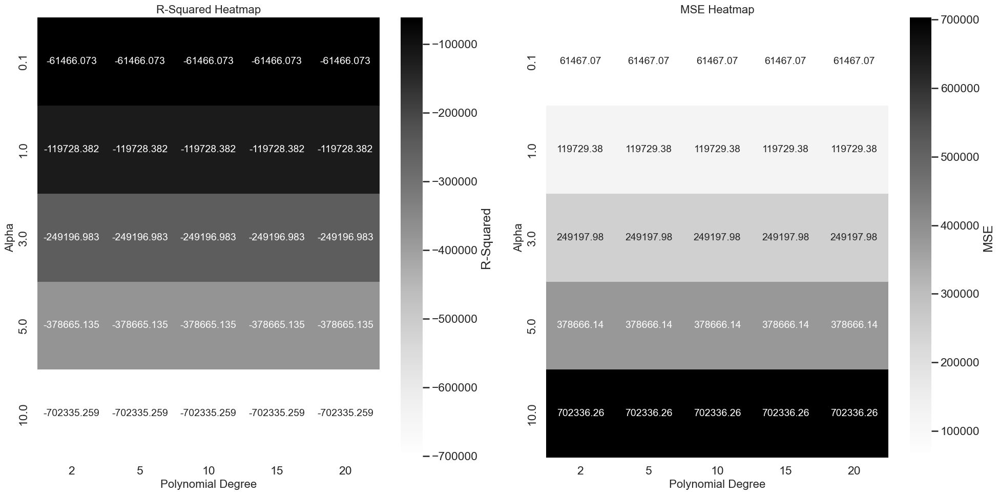

In [13]:
# Set the context and font scale for Seaborn plots
sns.set(context='talk', font_scale=1)

# Assuming the 'results' list has been populated as per your code
# Convert the 'results' list into a DataFrame for easier manipulation
results_df = pd.DataFrame(results, columns=['Model', 'Alpha', 'Degree', 'Bias', 'Error'])

# Assuming the 'Error' in your results DataFrame is MSE
results_df['R2'] = 1 - (results_df['Error'] / np.var(y))  # Adjusted R2 formula for MSE
results_df['MSE'] = results_df['Error']  # Assuming 'Error' is MSE

# Pivot the data to create a matrix for heatmaps
r2_matrix = results_df.pivot(index='Alpha', columns='Degree', values='R2')
mse_matrix = results_df.pivot(index='Alpha', columns='Degree', values='MSE')

# Set up the matplotlib figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))  # 1 row, 2 columns

# Draw the R-Squared heatmap
sns.heatmap(r2_matrix, annot=True, fmt=".3f", cmap="Greys", cbar_kws={'label': 'R-Squared'}, ax=ax1, annot_kws={"size": 14})
ax1.set_title("R-Squared Heatmap", fontsize=16)
ax1.set_xlabel("Polynomial Degree", fontsize=16)
ax1.set_ylabel("Alpha", fontsize=16)

# Draw the MSE heatmap
sns.heatmap(mse_matrix, annot=True, fmt=".2f", cmap="Greys", cbar_kws={'label': 'MSE'}, ax=ax2, annot_kws={"size": 14})
ax2.set_title("MSE Heatmap", fontsize=16)
ax2.set_xlabel("Polynomial Degree", fontsize=16)
ax2.set_ylabel("Alpha", fontsize=16)

# Display the heatmaps
plt.tight_layout()
plt.show()


In [35]:
# Assuming 'data' is the DataFrame with standardized data
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Define a 10-fold cross-validation strategy
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize models with placeholder hyperparameters
lasso = Lasso(alpha=0.1, random_state=42)
ridge = Ridge(alpha=0.1, random_state=42)
en = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)
ols = LinearRegression()


# Create a new DataFrame to store predicted values
nonscaled_no_outliers = nonscaled_no_outliers.copy()

# Predict 'fv' using cross-validation for each model and add to nonscaled_no_outliers DataFrame
nonscaled_no_outliers['lasso_predicted_fv'] = cross_val_predict(lasso, X, y, cv=kf)
nonscaled_no_outliers['ridge_predicted_fv'] = cross_val_predict(ridge, X, y, cv=kf)
nonscaled_no_outliers['en_predicted_fv'] = cross_val_predict(en, X, y, cv=kf)
nonscaled_no_outliers['ols_predicted_fv'] = cross_val_predict(ols, X, y, cv=kf)

nonscaled_no_outliers.head()

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv,ols_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.368311,-0.092914,-0.244468,-0.137715,-0.244861
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.451410,-0.077225,-0.310589,-0.144331,-0.312321
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.382853,-0.062436,-0.245949,-0.105278,-0.263339
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,0.303225,-0.159458,-0.078850,-0.083581,-0.078682
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,-0.139245,-0.245659,-0.583705,-0.334873,-0.595613


In [36]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ ols_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ ols_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ ols_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ ols_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "ols_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [37]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ lasso_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ lasso_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ lasso_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ lasso_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "lasso_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [66]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ ridge_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ ridge_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ ridge_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ ridge_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "ridge_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [38]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ en_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ en_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ en_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ en_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "en_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [39]:
# Assuming 'data' is the DataFrame with standardized data
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Define a 10-fold cross-validation strategy
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize models with placeholder hyperparameters
lasso = Lasso(alpha=0.1, random_state=42)
ridge = Ridge(alpha=0.1, random_state=42)
en = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)

# Create a new DataFrame to store predicted values
nonscaled_no_outliers = nonscaled_no_outliers.copy()

# Predict 'fv' using cross-validation for each model and add to nonscaled_no_outliers DataFrame
nonscaled_no_outliers['lasso_predicted_fv'] = cross_val_predict(lasso, X, y, cv=kf)
nonscaled_no_outliers['ridge_predicted_fv'] = cross_val_predict(ridge, X, y, cv=kf)
nonscaled_no_outliers['en_predicted_fv'] = cross_val_predict(en, X, y, cv=kf)


# Compute residuals for the predicted fv using the correct column names from nonscaled_no_outliers DataFrame
nonscaled_no_outliers['lasso_resid_fv'] = y - nonscaled_no_outliers['lasso_predicted_fv']
nonscaled_no_outliers['ridge_resid_fv'] = y - nonscaled_no_outliers['ridge_predicted_fv']
nonscaled_no_outliers['en_resid_fv'] = y - nonscaled_no_outliers['en_predicted_fv']

In [40]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ lasso_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ lasso_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ lasso_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ lasso_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "lasso_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [41]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ ridge_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ ridge_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ ridge_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ ridge_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "ridge_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [42]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ en_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ en_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ en_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ en_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "en_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [99]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/TC/anaconda3/lib/python3.11/site-packages

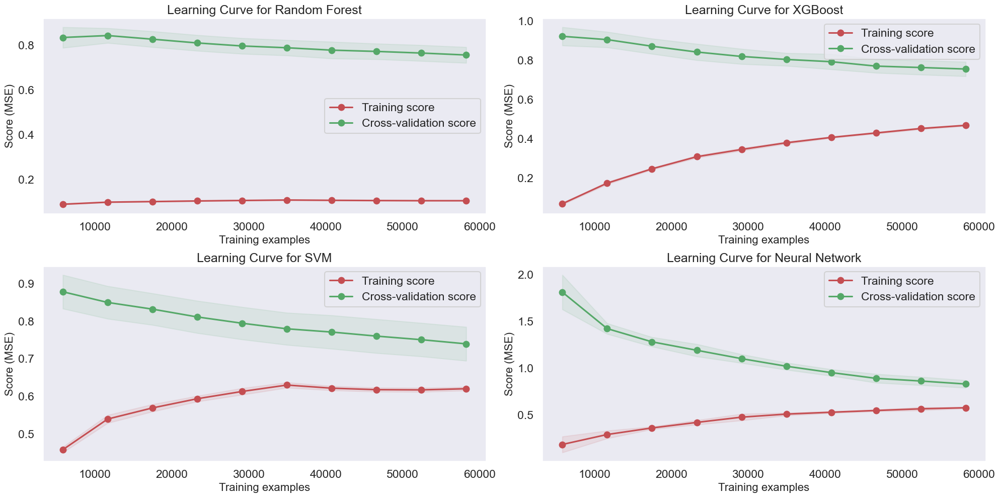

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import KFold

data = filtered_data_standardized
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define cross-validation strategy
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Define the number of training examples to use for generating the learning curves
train_sizes = np.linspace(0.1, 1.0, 10)

plt.figure(figsize=(20, 10))

for i, (name, model) in enumerate(models.items(), 1):
    plt.subplot(2, 2, i)
    
    # Generate learning curves
    train_sizes_abs, train_scores, test_scores = learning_curve(
        model, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes,
        scoring='neg_mean_squared_error')

    # Calculate mean and standard deviation for training set scores
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    
    # Calculate mean and standard deviation for test set scores
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    # Plot learning curve for the training set
    plt.fill_between(train_sizes_abs, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.plot(train_sizes_abs, train_scores_mean, 'o-', color="r",
             label="Training score")
    
    # Plot learning curve for the test set
    plt.fill_between(train_sizes_abs, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes_abs, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    
    # Labels and title
    plt.title(f"Learning Curve for {name}")
    plt.xlabel("Training examples")
    plt.ylabel("Score (MSE)")
    plt.legend(loc="best")
    plt.grid()

plt.tight_layout()
plt.show()


In [94]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [95]:
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1).values
y = data['fv'].values

# Define the models
models = {
    "Random Forest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "Neural Network": MLPRegressor(random_state=42)
}

# Define 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Initialize dictionaries to store MSE and R-squared results
mse_results = {name: [] for name in models}
r2_results = {name: [] for name in models}

# Perform 10-fold cross-validation for each model
for name, model in models.items():
    print(f"Model: {name}")
    fold = 1
    for train_index, test_index in kf.split(X):
        # Split data into training and test sets for the current fold
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        # Fit the model on the training data
        model.fit(X_train, y_train)
        
        # Predict on the test set
        y_pred = model.predict(X_test)
        
        # Calculate MSE for the test set
        mse = mean_squared_error(y_test, y_pred)
        
        # Calculate R-squared for the test set
        r2 = r2_score(y_test, y_pred)
        
        # Store MSE and R-squared results
        mse_results[name].append(mse)
        r2_results[name].append(r2)
        
        # Print the MSE and R-squared for the current fold
        print(f"Fold {fold} - MSE: {mse:.4f}, R-squared: {r2:.4f}")
        fold += 1
    
    print('-' * 30)

# Create subplots for MSE and R-squared box plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
fig.subplots_adjust(hspace=0.4)

# Plot box plots for MSE results
axes[0].boxplot(mse_results.values())
axes[0].set_xticklabels(mse_results.keys())
axes[0].set_title("MSE for Each Model (10-fold CV)")
axes[0].set_ylabel("Mean Squared Error (MSE)")

# Plot box plots for R-squared results
axes[1].boxplot(r2_results.values())
axes[1].set_xticklabels(r2_results.keys())
axes[1].set_title("R-squared for Each Model (10-fold CV)")
axes[1].set_ylabel("R-squared")

# Show the plots
plt.show()


Model: Random Forest
Fold 1 - MSE: 0.8131, R-squared: 0.2352
Fold 2 - MSE: 0.7711, R-squared: 0.2326
Fold 3 - MSE: 0.7356, R-squared: 0.2516
Fold 4 - MSE: 0.6989, R-squared: 0.2518


KeyboardInterrupt: 

In [43]:
# Assuming 'data' is the DataFrame with standardized data
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(n_estimators=100, min_samples_split=5, min_samples_leaf=2, max_depth=None, random_state=42)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(subsample=0.7, n_estimators=700, max_depth=7, learning_rate=0.05, gamma=0.1, colsample_bytree=0.7, random_state=42)
xgb_best.fit(X_train, y_train)

# Predict on the entire dataset
rf_predictions = rf_best.predict(X)
xgb_predictions = xgb_best.predict(X)

# Compute the R-squared and MSE for these predictions
rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions)
xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions)

# Compute residuals for the predicted fv
rf_resid_fv = y - rf_predictions
xgb_resid_fv = y - xgb_predictions

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_residual_fv'] = rf_resid_fv
nonscaled_no_outliers['xgb_residual_fv'] = xgb_resid_fv

In [44]:
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv,lasso_resid_fv,ridge_resid_fv,en_resid_fv,rf_residual_fv,xgb_residual_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,182.0,1.098612,-0.092914,-0.244468,-0.137715,0.045395,0.196949,0.090195,0.013106,-0.104341
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,182.0,1.098612,-0.077225,-0.310589,-0.144331,-0.279161,-0.045797,-0.212055,-0.031467,-0.112894
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,182.0,1.098612,-0.062436,-0.245949,-0.105278,0.090668,0.274181,0.133510,0.075753,0.100524
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,208.0,0.916291,-0.159458,-0.078850,-0.083581,0.519875,0.439267,0.443999,0.188119,0.201506
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,208.0,0.916291,-0.245659,-0.583705,-0.334873,-0.547802,-0.209756,-0.458588,0.101617,0.030958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,198.0,2.484907,-0.094154,0.213997,0.015785,0.611918,0.303767,0.501980,0.209222,0.041294
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,198.0,2.484907,-0.029757,-0.003049,-0.041556,0.014547,-0.012161,0.026346,0.087635,-0.135840
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,238.0,0.559616,0.067706,0.000524,0.039905,0.525818,0.593000,0.553619,-0.002553,0.415929
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,238.0,0.559616,0.215130,0.011018,0.104685,-1.672945,-1.468833,-1.562500,-0.351819,-0.844385


In [45]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [46]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [47]:
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions = svm_best.predict(X)
nn_predictions = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predictions'] = svm_predictions
nonscaled_no_outliers['nn_predictions'] = nn_predictions

# Compute residuals for the predicted fv
svm_resid_fv = y - svm_predictions
nn_resid_fv = y - nn_predictions

# Adding the predicted values to the dataframe
nonscaled_no_outliers['svm_residual_fv'] = svm_resid_fv
nonscaled_no_outliers['nn_residual_fv'] = nn_resid_fv

In [48]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [49]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [100]:
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions = rf_best.predict(X)
xgb_predictions = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions)

xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.7044
Random Forest - MSE for Entire Data: 0.2956
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.6267
XGBoost - MSE for Entire Data: 0.3733


In [101]:
filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,work_type1,fv,bp,ln_hh_income_percap,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.368311,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.368311
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.451410,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.451410
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.382853,182.0,1.098612,-0.009300,0.025428,-0.084694,-0.012093,-0.096865,-0.382853
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,0.303225,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,0.303225
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.139245,208.0,0.916291,-0.029496,0.025428,-0.084694,-0.012093,-0.115255,-0.139245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.540736,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.540736
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.0,0.150734,198.0,2.484907,0.144266,0.053222,-0.084694,-0.012093,0.039935,0.150734
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.012676,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.012676
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1.0,-0.350177,238.0,0.559616,-0.069007,-0.030160,-0.084694,-0.012093,-0.145178,-0.350177


In [102]:
# Adding the predicted values to the dataframe
nonscaled_no_outliers['rf_predicted_fv'] = rf_predictions
nonscaled_no_outliers['xgb_predicted_fv'] = xgb_predictions
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,rf_predicted_fv,xgb_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612,-0.060625,0.056822
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612,-0.324919,-0.243492
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612,-0.047521,-0.072292
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291,0.172298,0.158911
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291,-0.895078,-0.824419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,0.308543,0.476470
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.102845,0.120630
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.596077,0.177595
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,1,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,-1.105996,-0.613430


In [103]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [104]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [55]:
nonscaled_no_outliers = nonscaled_no_outliers.drop(['xgb_predicted_fv', 'rf_predicted_fv'], axis=1)
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,en_predicted_fv,lasso_resid_fv,ridge_resid_fv,en_resid_fv,rf_residual_fv,xgb_residual_fv,svm_predictions,nn_predictions,svm_residual_fv,nn_residual_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.137715,0.045395,0.196949,0.090195,0.013106,-0.104341,-0.037398,0.350296,-0.010121,-0.397816
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.144331,-0.279161,-0.045797,-0.212055,-0.031467,-0.112894,-0.260925,-0.160117,-0.095461,-0.196269
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.105278,0.090668,0.274181,0.133510,0.075753,0.100524,-0.003183,-0.047090,0.031415,0.075321
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.083581,0.519875,0.439267,0.443999,0.188119,0.201506,0.298831,0.291256,0.061586,0.069162
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.334873,-0.547802,-0.209756,-0.458588,0.101617,0.030958,-0.672780,-0.717330,-0.120681,-0.076130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.015785,0.611918,0.303767,0.501980,0.209222,0.041294,0.288137,0.489284,0.229628,0.028481
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.041556,0.014547,-0.012161,0.026346,0.087635,-0.135840,-0.005447,0.112905,-0.009763,-0.128115
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.039905,0.525818,0.593000,0.553619,-0.002553,0.415929,0.189108,-0.139949,0.404416,0.733473
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.104685,-1.672945,-1.468833,-1.562500,-0.351819,-0.844385,-0.699994,-0.600645,-0.757821,-0.857170


In [56]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [57]:
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions = svm_best.predict(X)
nn_predictions = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predictions'] = svm_predictions
nonscaled_no_outliers['nn_predictions'] = nn_predictions

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4181
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.6194
SVM - R2 for Training Data: 0.6506
SVM - MSE for Training Data: 0.3464
--------------------------------------------------
Neural Network - R2 for Training Data: 0.4367
Neural Network - MSE for Training Data: 0.5585


In [58]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predictions", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predictions+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predictions+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predictions+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predictions", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [59]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predictions", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predictions+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predictions+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predictions+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predictions", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [60]:
# Adding the predicted values to the dataframe
nonscaled_no_outliers['rf_predicted_fv'] = rf_predictions
nonscaled_no_outliers['xgb_predicted_fv'] = xgb_predictions
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,ridge_resid_fv,en_resid_fv,rf_residual_fv,xgb_residual_fv,svm_predictions,nn_predictions,svm_residual_fv,nn_residual_fv,rf_predicted_fv,xgb_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.196949,0.090195,0.013106,-0.104341,-0.037398,0.350296,-0.010121,-0.397816,-0.060625,0.056822
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.045797,-0.212055,-0.031467,-0.112894,-0.260925,-0.160117,-0.095461,-0.196269,-0.324919,-0.243492
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.274181,0.133510,0.075753,0.100524,-0.003183,-0.047090,0.031415,0.075321,-0.047521,-0.072292
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.439267,0.443999,0.188119,0.201506,0.298831,0.291256,0.061586,0.069162,0.172298,0.158911
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.209756,-0.458588,0.101617,0.030958,-0.672780,-0.717330,-0.120681,-0.076130,-0.895078,-0.824419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.303767,0.501980,0.209222,0.041294,0.288137,0.489284,0.229628,0.028481,0.308543,0.476470
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.012161,0.026346,0.087635,-0.135840,-0.005447,0.112905,-0.009763,-0.128115,-0.102845,0.120630
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.593000,0.553619,-0.002553,0.415929,0.189108,-0.139949,0.404416,0.733473,0.596077,0.177595
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-1.468833,-1.562500,-0.351819,-0.844385,-0.699994,-0.600645,-0.757821,-0.857170,-1.105996,-0.613430


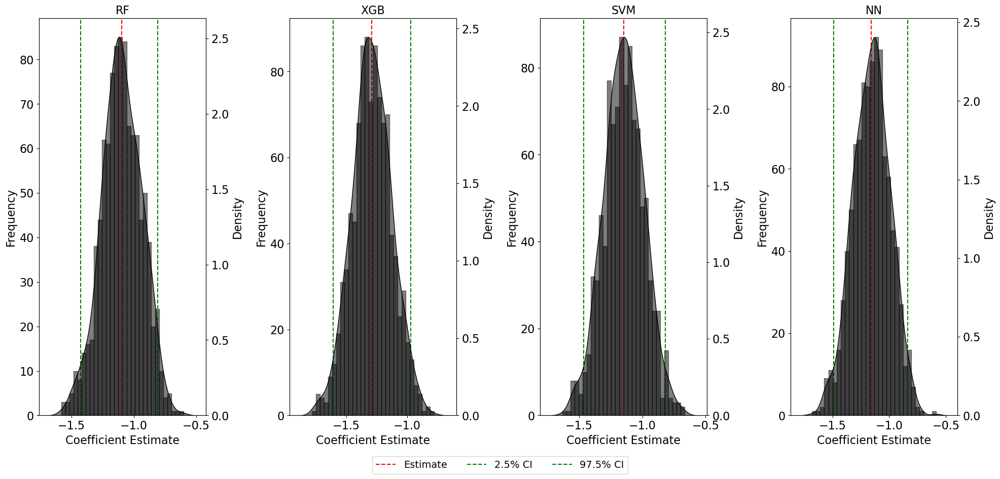

In [61]:
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000

# Predicted variables from each ML model for the first stage
predicted_vars = ['rf_predicted_fv', 'xgb_predicted_fv', 'svm_predictions', 'nn_predictions']

# Store results in a dictionary where each key is the name of the ML model
bootstrap_samples = {var: [] for var in predicted_vars}

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust the figsize appropriately

model_titles = ["RF", "XGB", "SVM", "NN"]

# Define the legend handles
handles = [
    plt.Line2D([0], [0], color='red', linestyle='--', label='Estimate'),
    plt.Line2D([0], [0], color='green', linestyle='--', label='2.5% CI'),
    plt.Line2D([0], [0], color='green', linestyle='--', label='97.5% CI')
]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean estimate and confidence interval bounds
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

# Adjust the layout to better fit the subplots and titles
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()


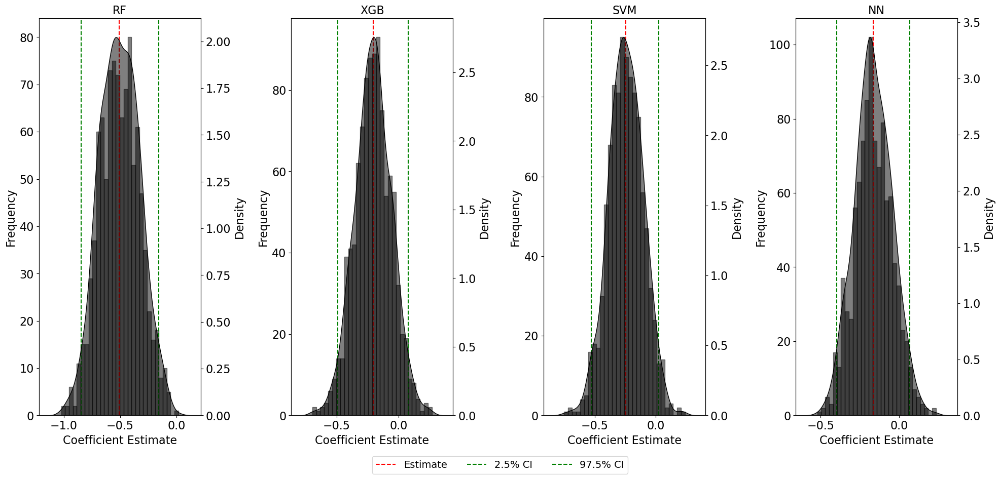

In [62]:
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000

# Predicted variables from each ML model for the first stage
predicted_vars = ['rf_residual_fv', 'xgb_residual_fv', 'svm_residual_fv', 'nn_residual_fv']

# Store results in a dictionary where each key is the name of the ML model
bootstrap_samples = {var: [] for var in predicted_vars}

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust the figsize appropriately

model_titles = ["RF", "XGB", "SVM", "NN"]

# Define the legend handles
handles = [
    plt.Line2D([0], [0], color='red', linestyle='--', label='Estimate'),
    plt.Line2D([0], [0], color='green', linestyle='--', label='2.5% CI'),
    plt.Line2D([0], [0], color='green', linestyle='--', label='97.5% CI')
]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean estimate and confidence interval bounds
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

# Adjust the layout to better fit the subplots and titles
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()


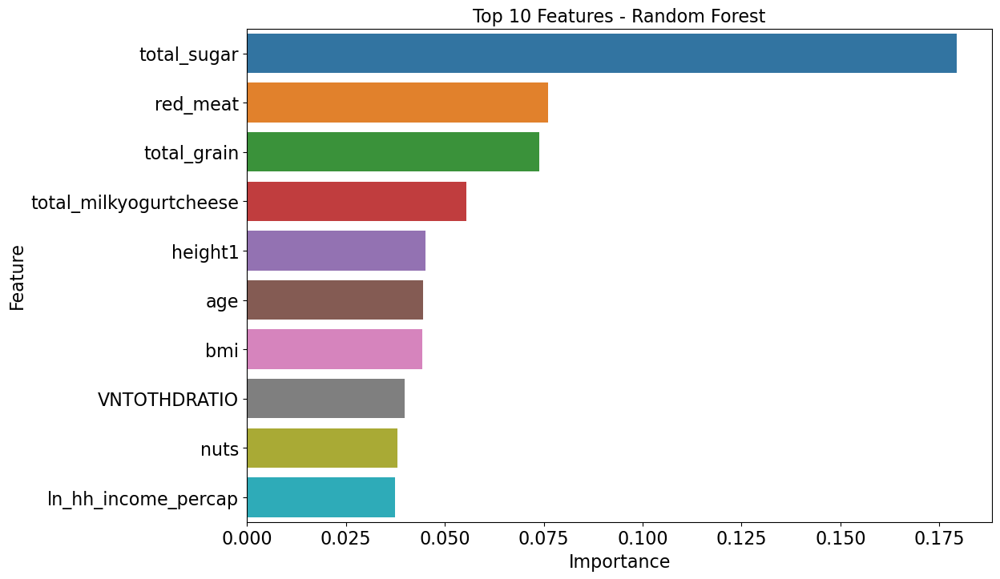

In [73]:
# Get feature importances
rf_importances = rf_best.feature_importances_

# Create a DataFrame for visualization
rf_feature_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_importances
})

# Sort the DataFrame by importance
rf_feature_df = rf_feature_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=rf_feature_df.iloc[:10, :])  # Showing top 10 features for brevity
plt.title('Top 10 Features - Random Forest')
plt.show()


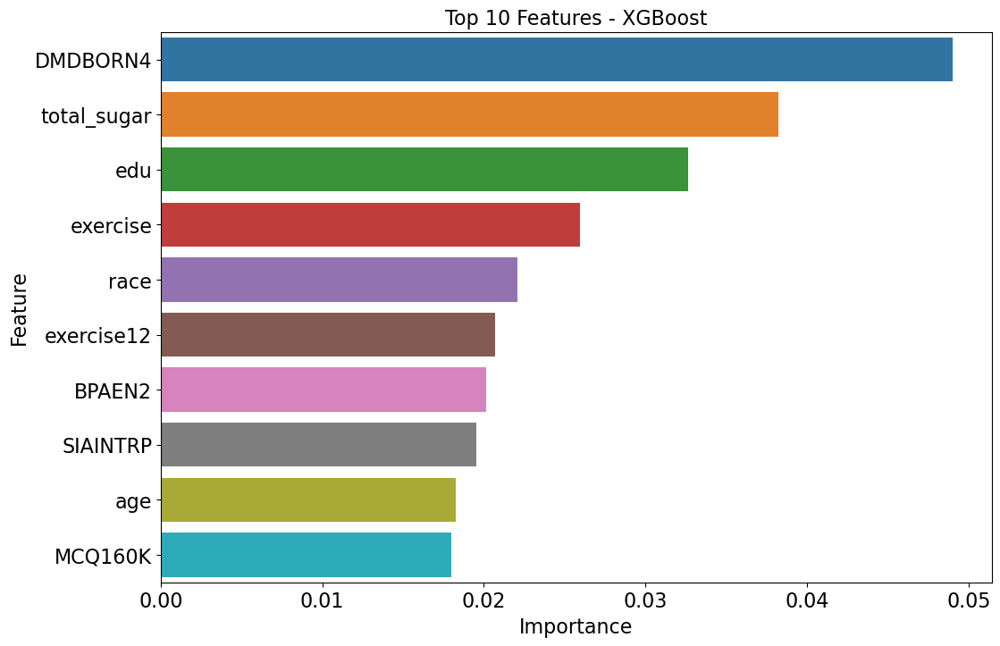

In [74]:
# Get feature importances
xgb_importances = xgb_best.feature_importances_

# Create a DataFrame for visualization
xgb_feature_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': xgb_importances
})

# Sort the DataFrame by importance
xgb_feature_df = xgb_feature_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=xgb_feature_df.iloc[:10, :])  # Showing top 10 features for brevity
plt.title('Top 10 Features - XGBoost')
plt.show()


In [75]:
# Get feature importances
rf_importances = rf_best.feature_importances_

# Create a DataFrame for visualization
rf_feature_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_importances
})

# Sort the DataFrame by importance
rf_feature_df = rf_feature_df.sort_values(by='Importance', ascending=False)
rf_feature_df


,Feature,Importance
35,total_sugar,0.179357
38,red_meat,0.076158
36,total_grain,0.073813
37,total_milkyogurtcheese,0.055537
48,height1,0.045036
...,...,...
68,SIAPROXY,0.000069
44,BPXPTY,0.000043
60,MIAPROXY,0.000026
65,RIDSTATR,0.000000


In [76]:
data=rf_feature_df.iloc[:55, :]
print(data)

                   Feature  Importance
35             total_sugar    0.179357
38                red_meat    0.076158
36             total_grain    0.073813
37  total_milkyogurtcheese    0.055537
48                 height1    0.045036
62                     age    0.044528
47                     bmi    0.044276
52            VNTOTHDRATIO    0.039903
39                    nuts    0.038083
71     ln_hh_income_percap    0.037484
49             cholesterol    0.032978
54                     edu    0.030392
0         howoftendrinkalc    0.022022
40     alcoholic_beverages    0.019643
51                   LBXTC    0.019006
50       total_cholesterol    0.018697
53                DMDBORN4    0.016268
43                  BPXML1    0.016087
34              survey_day    0.015654
64                    race    0.014076
5                   HSD010    0.013028
55                hh_size1    0.012180
57          marital_status    0.010789
33                exercise    0.008507
32              exercise1

# 100% variance feature selection from rf

In [77]:
total_importance = data['Importance'].sum()
print(f"The top 55 features explain {total_importance * 100:.2f}% of the variation in the data.")

The top 55 features explain 98.99% of the variation in the data.


In [78]:
# Get the first 30 most important features
top_55_rf_features = rf_feature_df.head(55)
top_55_rf_features

,Feature,Importance
35,total_sugar,0.179357
38,red_meat,0.076158
36,total_grain,0.073813
37,total_milkyogurtcheese,0.055537
48,height1,0.045036
62,age,0.044528
47,bmi,0.044276
52,VNTOTHDRATIO,0.039903
39,nuts,0.038083
71,ln_hh_income_percap,0.037484


In [95]:
# List of the specified features
features = [
    "total_sugar", "red_meat", "total_grain", "total_milkyogurtcheese", "bmi", 
    "height1", "ln_hh_income_percap", "nuts", "age", "VNTOTHDRATIO", 
    "cholesterol", "edu", "DMDBORN4", "howoftendrinkalc", "alcoholic_beverages",
    "LBXTC", "total_cholesterol", "survey_day", "BPXML1", "race", 
    "HSD010", "hh_size1", "marital_status", "exercise12", "exercise",
    "SDMVPSU", "work_type1", "HSQ590", "work_type", "PAQ635", 
    "MCQ160M", "RIDEXMON", "MCQ300C", "PAQ620", "DMDHRGND",
    "BPQ020", "DIQ010", "MCQ300B", "MCQ080", "MCQ010", 
    "HSQ500", "PAQ605", "MCQ300A", "gender", "MCQ092", 
    "HSQ571", "SIAINTRP", "BMDSTATS", "MCQ160K", "HSQ510", 
    "DMQMILIZ", "MCQ160L", "MCQ220", "MCQ160N", "HSQ520", "fv", "bp"
]

# Creating a new dataframe
final_df55 = filtered_data_standardized[features]
final_df55

,total_sugar,red_meat,total_grain,total_milkyogurtcheese,bmi,height1,ln_hh_income_percap,nuts,age,VNTOTHDRATIO,...,BMDSTATS,MCQ160K,HSQ510,DMQMILIZ,MCQ160L,MCQ220,MCQ160N,HSQ520,fv,bp
0,-0.483225,-0.019474,-0.915627,-0.535512,4.134877,-1.349760,-0.096055,-0.420623,0.721227,-0.102377,...,3.259886,0.120443,0.197579,0.373520,0.091290,0.263774,0.153635,0.096608,-0.047519,-0.473188
1,-0.387225,-0.672846,-0.095063,-0.229772,4.134877,-1.349760,-0.096055,-0.420623,0.721227,-0.102377,...,3.259886,0.120443,0.197579,0.373520,0.091290,0.263774,0.153635,0.096608,-0.356386,-0.473188
2,-0.312691,-0.232333,-0.387965,-0.191131,4.134877,-1.349760,-0.096055,-0.277693,0.721227,-0.102377,...,3.259886,0.120443,0.197579,0.373520,0.091290,0.263774,0.153635,0.096608,0.028232,-0.473188
3,-0.871393,2.634132,-0.192089,-0.888288,0.100734,-0.094745,-0.304660,-0.420623,1.239257,1.107420,...,-0.315726,0.120443,0.197579,-2.621581,0.091290,0.263774,0.153635,0.096608,0.360417,0.532707
4,-1.391986,-0.844786,-0.411091,-1.139151,0.100734,-0.094745,-0.304660,-0.420623,1.239257,1.107420,...,-0.315726,0.120443,0.197579,-2.621581,0.091290,0.263774,0.153635,0.096608,-0.793461,0.532707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,-0.479984,2.404878,1.210631,-1.139151,0.929470,-0.317409,1.490088,3.081073,-0.429952,-0.165387,...,-0.315726,0.120443,0.197579,0.373520,-2.835688,0.263774,0.153635,0.096608,0.517764,0.145824
64730,-0.130805,0.800210,0.604063,-0.656659,0.929470,-0.317409,1.490088,0.960397,-0.429952,-0.165387,...,-0.315726,0.120443,0.197579,0.373520,-2.835688,0.263774,0.153635,0.096608,-0.015210,0.145824
64731,0.343272,1.241418,-1.794407,-1.139151,0.972708,0.785789,-0.712753,-0.420623,-0.660188,0.556713,...,-0.315726,0.120443,0.197579,0.373520,0.091290,0.263774,0.153635,0.096608,0.593524,1.693354
64732,1.220856,-1.412187,-0.588510,-1.139151,0.972708,0.785789,-0.712753,-0.420623,-0.660188,0.556713,...,-0.315726,0.120443,0.197579,0.373520,0.091290,0.263774,0.153635,0.096608,-1.457815,1.693354


In [80]:
data=xgb_feature_df.iloc[:10, :]
data

,Feature,Importance
53,DMDBORN4,0.048997
35,total_sugar,0.038235
54,edu,0.032616
33,exercise,0.025930
64,race,0.022085
32,exercise12,0.020699
42,BPAEN2,0.020119
67,SIAINTRP,0.019538
62,age,0.018251
21,MCQ160K,0.017957


In [81]:
data_xgb=xgb_feature_df.iloc[:55, :]
print(data_xgb)

                   Feature  Importance
53                DMDBORN4    0.048997
35             total_sugar    0.038235
54                     edu    0.032616
33                exercise    0.025930
64                    race    0.022085
32              exercise12    0.020699
42                  BPAEN2    0.020119
67                SIAINTRP    0.019538
62                     age    0.018251
21                 MCQ160K    0.017957
23                 MCQ160M    0.017247
38                red_meat    0.017237
71     ln_hh_income_percap    0.017021
39                    nuts    0.016933
18                 MCQ160E    0.016639
8                   HSQ520    0.016361
63                RIDEXMON    0.016242
57          marital_status    0.016240
36             total_grain    0.016014
31                  PAQ635    0.015674
49             cholesterol    0.015668
5                   HSD010    0.014781
66                 SDMVPSU    0.014752
37  total_milkyogurtcheese    0.014149
52            VNTOTHDRATI

In [82]:
total_importance = data_xgb['Importance'].sum()
print(f"The top 55 features explain {total_importance * 100:.2f}% of the variation in the data.")

The top 55 features explain 86.09% of the variation in the data.


In [83]:
# Get the first 30 most important features
top_55_xgb_features = xgb_feature_df.head(55)
top_55_xgb_features

,Feature,Importance
53,DMDBORN4,0.048997
35,total_sugar,0.038235
54,edu,0.032616
33,exercise,0.025930
64,race,0.022085
32,exercise12,0.020699
42,BPAEN2,0.020119
67,SIAINTRP,0.019538
62,age,0.018251
21,MCQ160K,0.017957


In [116]:
selected_features = [
    'DMDBORN4', 'MIAINTRP', 'total_sugar', 'SIAINTRP', 'exercise12', 'edu', 'race',
    'HSQ520', 'exercise', 'MCQ160M', 'MCQ160K', 'red_meat', 'MCQ160E', 'PAQ635',
    'MCQ010', 'ln_hh_income_percap', 'age', 'nuts', 'RIDEXMON', 'total_grain',
    'height1', 'VNTOTHDRATIO', 'BPAEN2', 'bmi', 'MCQ092', 'total_milkyogurtcheese',
    'work_type1', 'marital_status', 'SDMVPSU', 'cholesterol', 'LBXTC', 'PAQ605',
    'hh_size1', 'gender', 'BPXML1', 'HSQ571', 'HSQ590', 'total_cholesterol',
    'BPXPULS', 'HSD010', 'MCQ160B', 'MCQ160N', 'SIAPROXY', 'BPXPTY', 'DMDHRGND',
    'MCQ300A', 'howoftendrinkalc', 'MCQ300B', 'alcoholic_beverages', 'DIQ010',
    'PAQ620', 'DMQMILIZ', 'MCQ300C', 'MCQ160G', 'MCQ080', 'fv', 'bp'
]

# Create new_df_55_xgb with selected features
new_df_55_xgb = filtered_data_standardized[selected_features]
new_df_55_xgb

,DMDBORN4,MIAINTRP,total_sugar,SIAINTRP,exercise12,edu,race,HSQ520,exercise,MCQ160M,...,MCQ300B,alcoholic_beverages,DIQ010,PAQ620,DMQMILIZ,MCQ300C,MCQ160G,MCQ080,fv,bp
0,-0.197999,0.132749,-0.483225,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.395562,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,-0.047519,-0.473188
1,-0.197999,0.132749,-0.387225,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.395562,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,-0.356386,-0.473188
2,-0.197999,0.132749,-0.312691,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.367676,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,0.028232,-0.473188
3,-0.197999,0.132749,-0.871393,0.121388,0.544521,-0.408638,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,-2.211944,0.765633,-2.621581,0.270164,0.059347,0.708404,0.360417,0.532707
4,-0.197999,0.132749,-1.391986,0.121388,0.544521,-0.408638,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,-2.211944,0.765633,-2.621581,0.270164,0.059347,0.708404,-0.793461,0.532707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.551680,0.132749,-0.479984,0.121388,0.544521,-0.408638,-1.773236,0.096608,0.824185,0.205300,...,-0.858284,-0.395562,0.245080,-1.189495,0.373520,0.270164,0.059347,-1.232258,0.517764,0.145824
64730,0.551680,0.132749,-0.130805,0.121388,0.544521,-0.408638,-1.773236,0.096608,0.824185,0.205300,...,-0.858284,-0.315869,0.245080,-1.189495,0.373520,0.270164,0.059347,-1.232258,-0.015210,0.145824
64731,-0.197999,0.132749,0.343272,0.121388,0.544521,0.406598,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,0.245080,0.765633,0.373520,0.270164,0.059347,-1.232258,0.593524,1.693354
64732,-0.197999,0.132749,1.220856,0.121388,0.544521,0.406598,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,0.245080,0.765633,0.373520,0.270164,0.059347,-1.232258,-1.457815,1.693354


In [85]:

data = final_df55

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions = rf_best.predict(X)
xgb_predictions = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions)

xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6450
Random Forest - MSE for Entire Data: 0.3550
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.6009
XGBoost - MSE for Entire Data: 0.3991


In [86]:
# Predict on the entire dataset
nonscaled_no_outliers['rf_predicted_fv'] = rf_best.predict(X)
nonscaled_no_outliers['xgb_predicted_fv'] = xgb_best.predict(X)

In [87]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [88]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [89]:

data = final_df55

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_rf = rf_best.predict(X)
xgb_predictions_rf = xgb_best.predict(X)



# Compute residuals for the predicted fv
rf_resid_rf = y - rf_predictions_rf
xgb_resid_rf = y - xgb_predictions_rf

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_rf'] = rf_resid_rf
nonscaled_no_outliers['xgb_resid_rf'] = xgb_resid_rf

In [90]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [91]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

# 85% variance feature selection from rf

In [92]:
data=rf_feature_df.iloc[:21, :]
print(data)

                   Feature  Importance
35             total_sugar    0.179357
38                red_meat    0.076158
36             total_grain    0.073813
37  total_milkyogurtcheese    0.055537
48                 height1    0.045036
62                     age    0.044528
47                     bmi    0.044276
52            VNTOTHDRATIO    0.039903
39                    nuts    0.038083
71     ln_hh_income_percap    0.037484
49             cholesterol    0.032978
54                     edu    0.030392
0         howoftendrinkalc    0.022022
40     alcoholic_beverages    0.019643
51                   LBXTC    0.019006
50       total_cholesterol    0.018697
53                DMDBORN4    0.016268
43                  BPXML1    0.016087
34              survey_day    0.015654
64                    race    0.014076
5                   HSD010    0.013028


In [93]:
total_importance = data['Importance'].sum()
print(f"The top 21 features explain {total_importance * 100:.2f}% of the variation in the data.")

The top 21 features explain 85.20% of the variation in the data.


In [94]:
# Get the first 21 most important features
top_21_rf_features = rf_feature_df.head(21)
top_21_rf_features

,Feature,Importance
35,total_sugar,0.179357
38,red_meat,0.076158
36,total_grain,0.073813
37,total_milkyogurtcheese,0.055537
48,height1,0.045036
62,age,0.044528
47,bmi,0.044276
52,VNTOTHDRATIO,0.039903
39,nuts,0.038083
71,ln_hh_income_percap,0.037484


In [119]:
# List of the specified features
features = [
    "total_sugar", "red_meat", "total_grain", "total_milkyogurtcheese", "bmi", 
    "height1", "nuts", "age", "VNTOTHDRATIO", "ln_hh_income_percap", 
    "cholesterol", "edu", "howoftendrinkalc", "alcoholic_beverages",
    "DMDBORN4", "survey_day", "total_cholesterol", "LBXTC", "BPXML1", 
    "hh_size1", "race", "fv", "bp"
]

# Creating a new dataframe
final_df21 = filtered_data_standardized[features]
final_df21

,total_sugar,red_meat,total_grain,total_milkyogurtcheese,bmi,height1,nuts,age,VNTOTHDRATIO,ln_hh_income_percap,...,alcoholic_beverages,DMDBORN4,survey_day,total_cholesterol,LBXTC,BPXML1,hh_size1,race,fv,bp
0,-0.483225,-0.019474,-0.915627,-0.535512,4.134877,-1.349760,-0.420623,0.721227,-0.102377,-0.096055,...,-0.395562,-0.197999,1.288617,-0.327824,-0.328761,-0.010109,-0.549536,1.769377,-0.047519,-0.473188
1,-0.387225,-0.672846,-0.095063,-0.229772,4.134877,-1.349760,-0.420623,0.721227,-0.102377,-0.096055,...,-0.395562,-0.197999,0.049832,-0.327824,-0.328761,-0.010109,-0.549536,1.769377,-0.356386,-0.473188
2,-0.312691,-0.232333,-0.387965,-0.191131,4.134877,-1.349760,-0.277693,0.721227,-0.102377,-0.096055,...,-0.367676,-0.197999,-1.188954,-0.327824,-0.328761,-0.010109,-0.549536,1.769377,0.028232,-0.473188
3,-0.871393,2.634132,-0.192089,-0.888288,0.100734,-0.094745,-0.420623,1.239257,1.107420,-0.304660,...,-0.395562,-0.197999,1.288617,-0.042367,-0.043005,1.671813,-0.549536,-0.001929,0.360417,0.532707
4,-1.391986,-0.844786,-0.411091,-1.139151,0.100734,-0.094745,-0.420623,1.239257,1.107420,-0.304660,...,-0.395562,-0.197999,0.049832,-0.042367,-0.043005,1.671813,-0.549536,-0.001929,-0.793461,0.532707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,-0.479984,2.404878,1.210631,-1.139151,0.929470,-0.317409,3.081073,-0.429952,-0.165387,1.490088,...,-0.395562,0.551680,0.049832,-0.254158,-0.257322,-0.010109,-1.150209,-1.773236,0.517764,0.145824
64730,-0.130805,0.800210,0.604063,-0.656659,0.929470,-0.317409,0.960397,-0.429952,-0.165387,1.490088,...,-0.315869,0.551680,-1.188954,-0.254158,-0.257322,-0.010109,-1.150209,-1.773236,-0.015210,0.145824
64731,0.343272,1.241418,-1.794407,-1.139151,0.972708,0.785789,-0.420623,-0.660188,0.556713,-0.712753,...,-0.395562,-0.197999,0.049832,-0.705363,-0.709770,0.550532,0.651810,-0.001929,0.593524,1.693354
64732,1.220856,-1.412187,-0.588510,-1.139151,0.972708,0.785789,-0.420623,-0.660188,0.556713,-0.712753,...,-0.395562,-0.197999,1.288617,-0.705363,-0.709770,0.550532,0.651810,-0.001929,-1.457815,1.693354


In [96]:

data = final_df21

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions21 = rf_best.predict(X)
xgb_predictions21 = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions21)

xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions21)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6450
Random Forest - MSE for Entire Data: 0.3685
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.6009
XGBoost - MSE for Entire Data: 0.4282


In [97]:
# Predict on the entire dataset
nonscaled_no_outliers['rf_predicted_fv21'] = rf_best.predict(X)
nonscaled_no_outliers['xgb_predicted_fv21'] = xgb_best.predict(X)

In [98]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [99]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [100]:

data = final_df21

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_rf21 = rf_best.predict(X)
xgb_predictions_rf21 = xgb_best.predict(X)



# Compute residuals for the predicted fv
rf_resid_rf21 = y - rf_predictions_rf21
xgb_resid_rf21 = y - xgb_predictions_rf21

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_rf21'] = rf_resid_rf21
nonscaled_no_outliers['xgb_resid_rf21'] = xgb_resid_rf21

In [101]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [102]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [103]:
data = final_df21

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_rf21 = svm_best.predict(X)
nn_predictions_rf21 = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions_rf21)
svm_mse_entire = mean_squared_error(y, svm_predictions_rf21)

nn_r2_entire = r2_score(y, nn_predictions_rf21)
nn_mse_entire = mean_squared_error(y, nn_predictions_rf21)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_rf21'] = svm_predictions_rf21
nonscaled_no_outliers['nn_predicted_fv_from_rf21'] = nn_predictions_rf21

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.3960
SVM - MSE for Entire Data: 0.6040
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.2484
Neural Network - MSE for Entire Data: 0.7516
SVM - R2 for Training Data: 0.4581
SVM - MSE for Training Data: 0.5372
--------------------------------------------------
Neural Network - R2 for Training Data: 0.2713
Neural Network - MSE for Training Data: 0.7225


In [104]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [105]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [106]:

# Compute residuals for the predicted fv
svm_resid_rf21 = y - svm_predictions_rf21
nn_resid_rf21 = y - nn_predictions_rf21

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_rf21'] = svm_resid_rf21
nonscaled_no_outliers['nn_resid_rf21'] = nn_resid_rf21

In [107]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [108]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_rf21", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_rf21+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_rf21+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_rf21+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_rf21", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

# 85% variance feature selection from xgb

In [109]:
new_df_55_xgb

,DMDBORN4,MIAINTRP,total_sugar,SIAINTRP,exercise12,edu,race,HSQ520,exercise,MCQ160M,...,MCQ300B,alcoholic_beverages,DIQ010,PAQ620,DMQMILIZ,MCQ300C,MCQ160G,MCQ080,fv,bp
0,-0.197999,0.132749,-0.483225,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.395562,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,-0.047519,-0.473188
1,-0.197999,0.132749,-0.387225,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.395562,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,-0.356386,-0.473188
2,-0.197999,0.132749,-0.312691,0.121388,0.544521,-0.408638,1.769377,0.096608,0.824185,-2.125032,...,0.062867,-0.367676,0.245080,0.765633,0.373520,-0.641279,0.059347,-1.232258,0.028232,-0.473188
3,-0.197999,0.132749,-0.871393,0.121388,0.544521,-0.408638,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,-2.211944,0.765633,-2.621581,0.270164,0.059347,0.708404,0.360417,0.532707
4,-0.197999,0.132749,-1.391986,0.121388,0.544521,-0.408638,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,-2.211944,0.765633,-2.621581,0.270164,0.059347,0.708404,-0.793461,0.532707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.551680,0.132749,-0.479984,0.121388,0.544521,-0.408638,-1.773236,0.096608,0.824185,0.205300,...,-0.858284,-0.395562,0.245080,-1.189495,0.373520,0.270164,0.059347,-1.232258,0.517764,0.145824
64730,0.551680,0.132749,-0.130805,0.121388,0.544521,-0.408638,-1.773236,0.096608,0.824185,0.205300,...,-0.858284,-0.315869,0.245080,-1.189495,0.373520,0.270164,0.059347,-1.232258,-0.015210,0.145824
64731,-0.197999,0.132749,0.343272,0.121388,0.544521,0.406598,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,0.245080,0.765633,0.373520,0.270164,0.059347,-1.232258,0.593524,1.693354
64732,-0.197999,0.132749,1.220856,0.121388,0.544521,0.406598,-0.001929,0.096608,0.824185,0.205300,...,0.062867,-0.395562,0.245080,0.765633,0.373520,0.270164,0.059347,-1.232258,-1.457815,1.693354


In [110]:

data = new_df_55_xgb

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_xgb = rf_best.predict(X)
xgb_predictions_xgb = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions)

xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6450
Random Forest - MSE for Entire Data: 0.3550
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.6009
XGBoost - MSE for Entire Data: 0.3991


In [111]:

# Compute residuals for the predicted fv
rf_resid_xgb = y - rf_predictions_xgb
xgb_resid_xgb = y - xgb_predictions_xgb

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_xgb'] = rf_resid_xgb
nonscaled_no_outliers['xgb_resid_xgb'] = xgb_resid_xgb

In [112]:
nonscaled_no_outliers['rf_predicted_fv_from_xgb'] = rf_predictions_xgb
nonscaled_no_outliers['xgb_predicted_fv_from_xgb'] = xgb_predictions_xgb

In [113]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [114]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [115]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [116]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [117]:
data = new_df_55_xgb

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_xgb = svm_best.predict(X)
nn_predictions_xgb = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions_xgb)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions_xgb)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_xgb'] = svm_predictions_xgb
nonscaled_no_outliers['nn_predicted_fv_from_xgb'] = nn_predictions_xgb

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4284
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.6460
SVM - R2 for Training Data: 0.6371
SVM - MSE for Training Data: 0.3597
--------------------------------------------------
Neural Network - R2 for Training Data: 0.4038
Neural Network - MSE for Training Data: 0.5911


In [118]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [119]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [120]:

# Compute residuals for the predicted fv
svm_resid_xgb = y - svm_predictions_xgb
nn_resid_xgb = y - nn_predictions_xgb

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_xgb'] = svm_resid_xgb
nonscaled_no_outliers['nn_resid_xgb'] = nn_resid_xgb

In [121]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [122]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

# 100% variance feature selection from xgb

In [123]:
data_xgb=xgb_feature_df.iloc[:70, :]
print(data_xgb)

        Feature  Importance
53     DMDBORN4    0.048997
35  total_sugar    0.038235
54          edu    0.032616
33     exercise    0.025930
64         race    0.022085
..          ...         ...
1        BPQ020    0.009156
7        HSQ510    0.009022
44       BPXPTY    0.008946
3      DIQ050_x    0.007100
60     MIAPROXY    0.006597

[70 rows x 2 columns]


In [124]:
total_importance = data_xgb['Importance'].sum()
print(f"The top 70 features explain {total_importance * 100:.2f}% of the variation in the data.")

The top 70 features explain 100.00% of the variation in the data.


In [125]:
# Get the first 70 most important features
top_70_xgb_features = xgb_feature_df.head(70)
top_70_xgb_features

,Feature,Importance
53,DMDBORN4,0.048997
35,total_sugar,0.038235
54,edu,0.032616
33,exercise,0.025930
64,race,0.022085
...,...,...
1,BPQ020,0.009156
7,HSQ510,0.009022
44,BPXPTY,0.008946
3,DIQ050_x,0.007100


In [126]:

# Set pandas to display more rows
pd.set_option('display.max_rows', 70)

# Assuming 'xgb_feature_df' is your DataFrame
# Extract the top 70 features
top_70_features = xgb_feature_df.head(70)

# Print the complete list of top 70 features
print(top_70_features)


                   Feature  Importance
53                DMDBORN4    0.048997
35             total_sugar    0.038235
54                     edu    0.032616
33                exercise    0.025930
64                    race    0.022085
32              exercise12    0.020699
42                  BPAEN2    0.020119
67                SIAINTRP    0.019538
62                     age    0.018251
21                 MCQ160K    0.017957
23                 MCQ160M    0.017247
38                red_meat    0.017237
71     ln_hh_income_percap    0.017021
39                    nuts    0.016933
18                 MCQ160E    0.016639
8                   HSQ520    0.016361
63                RIDEXMON    0.016242
57          marital_status    0.016240
36             total_grain    0.016014
31                  PAQ635    0.015674
49             cholesterol    0.015668
5                   HSD010    0.014781
66                 SDMVPSU    0.014752
37  total_milkyogurtcheese    0.014149
52            VNTOTHDRATI

In [99]:
selected_features = [
    "DMDBORN4", "edu", "exercise12", "total_sugar", "race",
    "exercise", "SIAINTRP", "red_meat", "age", "MCQ160D",
    "MCQ160E", "ln_hh_income_percap", "PAQ635", "marital_status",
    "nuts", "MIAINTRP", "bmi", "MCQ160C", "height1", "MCQ160M",
    "VNTOTHDRATIO", "total_grain", "HSD010", "MCQ160L",
    "cholesterol", "work_type1", "hh_size1", "total_milkyogurtcheese",
    "DMQMILIZ", "total_cholesterol", "SDMVPSU", "RIDEXMON",
    "MCQ160G", "HSQ571", "MCQ160K", "work_type", "BPAEN2",
    "MCQ300A", "LBXTC", "PAQ605", "BMDSTATS", "MCQ220",
    "gender", "alcoholic_beverages", "BPXPULS", "HSQ520",
    "MCQ160N", "MCQ300B", "BPXML1", "DIQ010", "MCQ160B",
    "MCQ300C", "BPAARM", "MCQ010", "MCQ080", "PAQ620",
    "DMDHRGND", "howoftendrinkalc", "MCQ053", "survey_day",
    "BPXPTY", "DIQ050_x", "HSQ590", "BPQ020", "HSQ500",
    "MCQ160F", "MCQ092", "SIAPROXY", "HSQ510", "MIAPROXY", "fv", "bp"
]

# Create new_df_55_xgb with selected features
new_df_70_xgb = filtered_data_standardized[selected_features]
new_df_70_xgb

,DMDBORN4,edu,exercise12,total_sugar,race,exercise,SIAINTRP,red_meat,age,MCQ160D,...,HSQ590,BPQ020,HSQ500,MCQ160F,MCQ092,SIAPROXY,HSQ510,MIAPROXY,fv,bp
0,-0.197999,-0.408638,0.544521,-0.483225,1.769377,0.824185,0.121388,-0.019474,0.721227,-2.389376,...,0.089246,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,-0.047519,-0.473188
1,-0.197999,-0.408638,0.544521,-0.387225,1.769377,0.824185,0.121388,-0.672846,0.721227,-2.389376,...,0.089246,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,-0.356386,-0.473188
2,-0.197999,-0.408638,0.544521,-0.312691,1.769377,0.824185,0.121388,-0.232333,0.721227,-2.389376,...,0.089246,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,0.028232,-0.473188
3,-0.197999,-0.408638,0.544521,-0.871393,-0.001929,0.824185,0.121388,2.634132,1.239257,0.010603,...,0.089246,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,0.360417,0.532707
4,-0.197999,-0.408638,0.544521,-1.391986,-0.001929,0.824185,0.121388,-0.844786,1.239257,0.010603,...,0.089246,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,-0.793461,0.532707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.551680,-0.408638,0.544521,-0.479984,-1.773236,0.824185,0.121388,2.404878,-0.429952,0.010603,...,0.089246,0.652237,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,0.517764,0.145824
64730,0.551680,-0.408638,0.544521,-0.130805,-1.773236,0.824185,0.121388,0.800210,-0.429952,0.010603,...,0.089246,0.652237,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,-0.015210,0.145824
64731,-0.197999,0.406598,0.544521,0.343272,-0.001929,0.824185,0.121388,1.241418,-0.660188,0.010603,...,-0.591632,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,0.593524,1.693354
64732,-0.197999,0.406598,0.544521,1.220856,-0.001929,0.824185,0.121388,-1.412187,-0.660188,0.010603,...,-0.591632,-1.190790,0.316467,0.088445,0.031885,0.059321,0.197579,0.059713,-1.457815,1.693354


In [128]:

data = new_df_70_xgb

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_xgb = rf_best.predict(X)
xgb_predictions_xgb = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions)
rf_mse = mean_squared_error(y, rf_predictions)

xgb_r2 = r2_score(y, xgb_predictions)
xgb_mse = mean_squared_error(y, xgb_predictions)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6450
Random Forest - MSE for Entire Data: 0.3550
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.6009
XGBoost - MSE for Entire Data: 0.3991


In [129]:

# Compute residuals for the predicted fv
rf_resid_xgb = y - rf_predictions_xgb
xgb_resid_xgb = y - xgb_predictions_xgb

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_xgb'] = rf_resid_xgb
nonscaled_no_outliers['xgb_resid_xgb'] = xgb_resid_xgb

In [130]:
nonscaled_no_outliers['rf_predicted_fv_from_xgb'] = rf_predictions_xgb
nonscaled_no_outliers['xgb_predicted_fv_from_xgb'] = xgb_predictions_xgb

In [131]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [132]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [133]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [134]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [135]:
data = new_df_70_xgb

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_xgb = svm_best.predict(X)
nn_predictions_xgb = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions_xgb)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions_xgb)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_xgb'] = svm_predictions_xgb
nonscaled_no_outliers['nn_predicted_fv_from_xgb'] = nn_predictions_xgb

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4104
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.6158
SVM - R2 for Training Data: 0.6598
SVM - MSE for Training Data: 0.3373
--------------------------------------------------
Neural Network - R2 for Training Data: 0.4384
Neural Network - MSE for Training Data: 0.5568


In [136]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [137]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [138]:

# Compute residuals for the predicted fv
svm_resid_xgb = y - svm_predictions_xgb
nn_resid_xgb = y - nn_predictions_xgb

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_xgb'] = svm_resid_xgb
nonscaled_no_outliers['nn_resid_xgb'] = nn_resid_xgb

In [139]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [140]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_xgb", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_xgb+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_xgb", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [141]:
data = final_df55

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_rf = svm_best.predict(X)
nn_predictions_rf = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions_rf)
svm_mse_entire = mean_squared_error(y, svm_predictions_rf)

nn_r2_entire = r2_score(y, nn_predictions_rf)
nn_mse_entire = mean_squared_error(y, nn_predictions_rf)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_rf'] = svm_predictions_rf
nonscaled_no_outliers['nn_predicted_fv_from_rf'] = nn_predictions_rf

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.6286
SVM - MSE for Entire Data: 0.3714
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3656
Neural Network - MSE for Entire Data: 0.6344
SVM - R2 for Training Data: 0.7071
SVM - MSE for Training Data: 0.2904
--------------------------------------------------
Neural Network - R2 for Training Data: 0.4161
Neural Network - MSE for Training Data: 0.5789


In [142]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [143]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [144]:

# Compute residuals for the predicted fv
svm_resid_rf = y - svm_predictions_rf
nn_resid_rf = y - nn_predictions_rf

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_rf'] = svm_resid_rf
nonscaled_no_outliers['nn_resid_rf'] = nn_resid_rf

In [145]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [146]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_rf", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_rf+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_rf+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_rf+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_rf", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

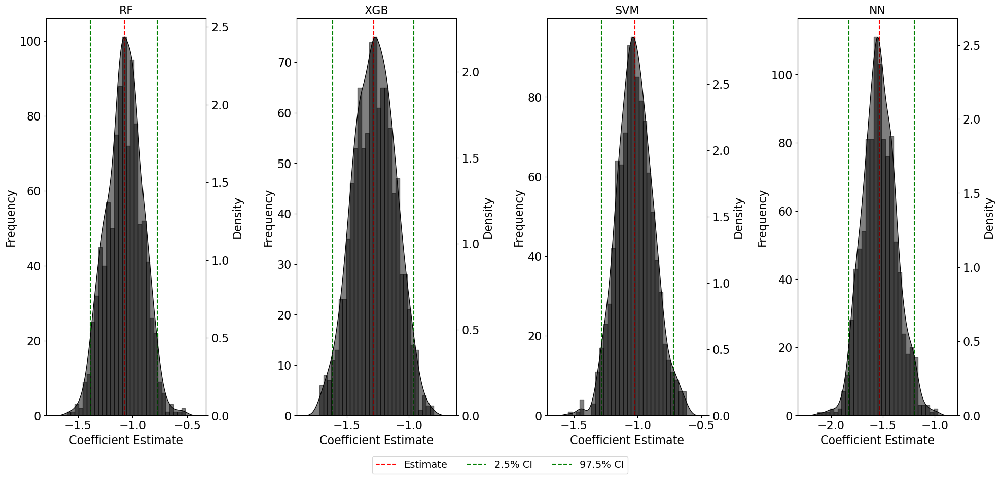

In [166]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000

# Names of the predicted variables from each ML model
predicted_vars = [
    'rf_predicted_fv',
    'xgb_predicted_fv',
    'svm_predicted_fv_from_rf',
    'nn_predicted_fv_from_rf'
]

# Store results in a dictionary where each key is the name of the ML model
bootstrap_samples = {var: [] for var in predicted_vars}

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RF", "XGB", "SVM", "NN"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

    
# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [148]:
filtered_data_standardized


,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [149]:
data = filtered_data_standardized

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions = svm_best.predict(X)
nn_predictions = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predictions'] = svm_predictions
nonscaled_no_outliers['nn_predictions'] = nn_predictions

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4181
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.6194
SVM - R2 for Training Data: 0.6506
SVM - MSE for Training Data: 0.3464
--------------------------------------------------
Neural Network - R2 for Training Data: 0.4367
Neural Network - MSE for Training Data: 0.5585


In [150]:
from sklearn.inspection import permutation_importance
# Calculate permutation importances on the test set
perm_importance = permutation_importance(svm_best, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature names
feature_names = X.columns.tolist()

# Organize the results in a DataFrame
importance_df_svm = pd.DataFrame({'feature': feature_names, 'importance_mean': perm_importance.importances_mean})

# Sort the DataFrame by importance
importance_df_svm = importance_df_svm.sort_values(by='importance_mean', ascending=False)

# Print the feature importance
print(importance_df_svm)

        feature  importance_mean
35  total_sugar         0.246392
62          age         0.051057
53     DMDBORN4         0.035575
54          edu         0.034058
38     red_meat         0.032982
..          ...              ...
68     SIAPROXY         0.002105
60     MIAPROXY         0.001129
44       BPXPTY         0.000832
65     RIDSTATR         0.000000
4       HSAQUEX         0.000000

[72 rows x 2 columns]


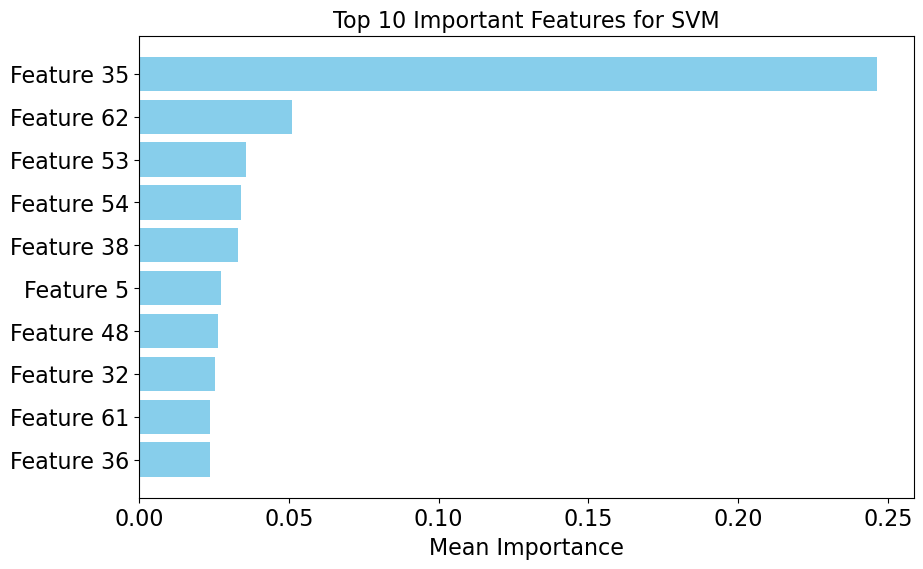

       feature  importance_mean
0    Feature 0         0.002445
1    Feature 1         0.016480
2    Feature 2         0.013720
3    Feature 3         0.008060
4    Feature 4         0.000000
5    Feature 5         0.027304
6    Feature 6         0.010845
7    Feature 7         0.008750
8    Feature 8         0.006445
9    Feature 9         0.009437
10  Feature 10         0.008536
11  Feature 11         0.012827
12  Feature 12         0.006331
13  Feature 13         0.017846
14  Feature 14         0.009038
15  Feature 15         0.006656
16  Feature 16         0.003896
17  Feature 17         0.004088
18  Feature 18         0.005392
19  Feature 19         0.006466
20  Feature 20         0.005751
21  Feature 21         0.006046


In [151]:
# Store importances in a DataFrame
feature_names = [f"Feature {i}" for i in range(X.shape[1])]
importance_df_svm = pd.DataFrame({
    'feature': feature_names,
    'importance_mean': perm_importance.importances_mean
})

# Ensure importance_df_svm is a DataFrame
assert isinstance(importance_df_svm, pd.DataFrame), "importance_df_svm must be a pandas DataFrame"

# Sort and plot
top_features_svm = importance_df_svm.sort_values(by='importance_mean', ascending=False).head(10)
plt.figure(figsize=(10, 6))
plt.barh(top_features_svm['feature'], top_features_svm['importance_mean'], color='skyblue')
plt.xlabel('Mean Importance')
plt.title('Top 10 Important Features for SVM')
plt.gca().invert_yaxis()
plt.show()

# Access the top features without altering importance_df_svm
top_55_svm_features = importance_df_svm.head(22)
print(top_55_svm_features)

# Explaining 100 percent variance from svm

In [168]:
# Get feature names
feature_names = X.columns.tolist()

# Organize the results in a DataFrame
importance_df_svm = pd.DataFrame({'feature': feature_names, 'importance_mean': perm_importance.importances_mean})

# Sort the DataFrame by importance
importance_df_svm_sorted = importance_df_svm.sort_values(by='importance_mean', ascending=False)

# Calculate the cumulative importance
importance_df_svm_sorted['cumulative_importance'] = importance_df_svm_sorted['importance_mean'].cumsum()

# Find the features that contribute to 85% of the cumulative importance
threshold = 1.0
important_features_info = importance_df_svm_sorted[importance_df_svm_sorted['cumulative_importance'] <= threshold]

important_features_info

,feature,importance_mean,cumulative_importance
35,total_sugar,0.246392,0.246392
62,age,0.051057,0.297449
53,DMDBORN4,0.035575,0.333024
54,edu,0.034058,0.367082
38,red_meat,0.032982,0.400064
5,HSD010,0.027304,0.427368
48,height1,0.026396,0.453764
32,exercise12,0.025505,0.479269
61,gender,0.023734,0.503003
36,total_grain,0.023674,0.526677


In [108]:
important_features = [
    "total_sugar", "DMDBORN4", "edu", "red_meat", "bmi", "age", "exercise12",
    "HSD010", "ln_hh_income_percap", "PAQ635", "exercise", "gender", "race",
    "marital_status", "height1", "total_grain", "SDMVPSU", "BMDSTATS",
    "hh_size1", "DMDHRGND", "PAQ605", "MCQ080", "work_type", "HSQ590",
    "RIDEXMON", "PAQ620", "cholesterol", "alcoholic_beverages",
    "VNTOTHDRATIO", "BPQ020", "DMQMILIZ", "MCQ300A", "SIAINTRP", "HSQ500",
    "work_type1", "DIQ010", "MCQ300B", "bp", "fv"
]

important_data_svm_100 = filtered_data_standardized[important_features]
important_data_svm_100

,total_sugar,DMDBORN4,edu,red_meat,bmi,age,exercise12,HSD010,ln_hh_income_percap,PAQ635,...,BPQ020,DMQMILIZ,MCQ300A,SIAINTRP,HSQ500,work_type1,DIQ010,MCQ300B,bp,fv
0,-0.483225,-0.197999,-0.408638,-0.019474,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,-0.047519
1,-0.387225,-0.197999,-0.408638,-0.672846,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,-0.356386
2,-0.312691,-0.197999,-0.408638,-0.232333,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,0.028232
3,-0.871393,-0.197999,-0.408638,2.634132,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-1.190790,-2.621581,-0.034072,0.121388,0.316467,-0.717234,-2.211944,0.062867,0.532707,0.360417
4,-1.391986,-0.197999,-0.408638,-0.844786,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-1.190790,-2.621581,-0.034072,0.121388,0.316467,-0.717234,-2.211944,0.062867,0.532707,-0.793461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,-0.479984,0.551680,-0.408638,2.404878,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,0.652237,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,-0.858284,0.145824,0.517764
64730,-0.130805,0.551680,-0.408638,0.800210,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,0.652237,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,-0.858284,0.145824,-0.015210
64731,0.343272,-0.197999,0.406598,1.241418,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,1.693354,0.593524
64732,1.220856,-0.197999,0.406598,-1.412187,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,1.693354,-1.457815


In [170]:
data = important_data_svm_100

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_svm = svm_best.predict(X)
nn_predictions_svm = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions_svm)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions_svm)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_svm'] = svm_predictions_svm
nonscaled_no_outliers['nn_predicted_fv_from_svm'] = nn_predictions_svm

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4233
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.6797
SVM - R2 for Training Data: 0.6401
SVM - MSE for Training Data: 0.3568
--------------------------------------------------
Neural Network - R2 for Training Data: 0.3591
Neural Network - MSE for Training Data: 0.6354


In [171]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [172]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [173]:

# Compute residuals for the predicted fv
svm_resid_svm = y - svm_predictions_svm
nn_resid_svm = y - nn_predictions_svm

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_svm'] = svm_resid_svm
nonscaled_no_outliers['nn_resid_svm'] = nn_resid_svm

In [174]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [175]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [176]:

data = important_data_svm_100

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_svm = rf_best.predict(X)
xgb_predictions_svm = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions_svm)
rf_mse = mean_squared_error(y, rf_predictions_svm)

xgb_r2 = r2_score(y, xgb_predictions_svm)
xgb_mse = mean_squared_error(y, xgb_predictions_svm)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6442
Random Forest - MSE for Entire Data: 0.3558
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.5800
XGBoost - MSE for Entire Data: 0.4200


In [177]:
nonscaled_no_outliers['rf_predicted_fv_from_svm'] = rf_predictions_svm
nonscaled_no_outliers['xgb_predicted_fv_from_svm'] = xgb_predictions_svm

In [178]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [179]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [180]:

# Compute residuals for the predicted fv
rf_resid_svm = y - rf_predictions_svm
xgb_resid_svm = y - nn_predictions_svm

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_svm'] = rf_resid_svm
nonscaled_no_outliers['xgb_resid_svm'] = xgb_resid_svm

In [181]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [182]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

# Explaining 85 percent variance from svm

In [183]:
from sklearn.inspection import permutation_importance
# Calculate permutation importances on the test set
perm_importance = permutation_importance(svm_best, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

# Get feature names
feature_names = X.columns.tolist()

# Organize the results in a DataFrame
importance_df_svm = pd.DataFrame({'feature': feature_names, 'importance_mean': perm_importance.importances_mean})

# Sort the DataFrame by importance
importance_df_svm = importance_df_svm.sort_values(by='importance_mean', ascending=False)

# Print the feature importance
print(importance_df_svm)

KeyboardInterrupt: 

In [ ]:
# Get feature names
feature_names = X.columns.tolist()

# Organize the results in a DataFrame
importance_df_svm = pd.DataFrame({'feature': feature_names, 'importance_mean': perm_importance.importances_mean})

# Sort the DataFrame by importance
importance_df_svm_sorted = importance_df_svm.sort_values(by='importance_mean', ascending=False)

# Calculate the cumulative importance
importance_df_svm_sorted['cumulative_importance'] = importance_df_svm_sorted['importance_mean'].cumsum()

# Find the features that contribute to 85% of the cumulative importance
threshold = 0.8
important_features_info = importance_df_svm_sorted[importance_df_svm_sorted['cumulative_importance'] <= threshold]

important_features_info

In [101]:
important_features = [
    "total_sugar", "DMDBORN4", "edu", "red_meat", "bmi", "age", "exercise12",
    "HSD010", "ln_hh_income_percap", "PAQ635", "exercise", "gender", "race",
    "marital_status", "height1", "total_grain", "SDMVPSU", "BMDSTATS",
    "hh_size1", "DMDHRGND", "PAQ605", "MCQ080", "work_type", "HSQ590",
    "RIDEXMON", "PAQ620", "cholesterol", "bp", "fv"
]

important_data_svm_85 = filtered_data_standardized[important_features]
important_data_svm_85

,total_sugar,DMDBORN4,edu,red_meat,bmi,age,exercise12,HSD010,ln_hh_income_percap,PAQ635,...,DMDHRGND,PAQ605,MCQ080,work_type,HSQ590,RIDEXMON,PAQ620,cholesterol,bp,fv
0,-0.483225,-0.197999,-0.408638,-0.019474,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-0.905768,0.498569,-1.232258,1.209280,0.089246,0.937966,0.765633,-0.355030,-0.473188,-0.047519
1,-0.387225,-0.197999,-0.408638,-0.672846,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-0.905768,0.498569,-1.232258,1.209280,0.089246,0.937966,0.765633,-0.355030,-0.473188,-0.356386
2,-0.312691,-0.197999,-0.408638,-0.232333,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-0.905768,0.498569,-1.232258,1.209280,0.089246,0.937966,0.765633,-0.355030,-0.473188,0.028232
3,-0.871393,-0.197999,-0.408638,2.634132,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-0.905768,0.498569,0.708404,1.209280,0.089246,0.937966,0.765633,-1.152328,0.532707,0.360417
4,-1.391986,-0.197999,-0.408638,-0.844786,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-0.905768,0.498569,0.708404,1.209280,0.089246,0.937966,0.765633,-1.152328,0.532707,-0.793461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,-0.479984,0.551680,-0.408638,2.404878,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,-0.905768,-1.843887,-1.232258,-0.863908,0.089246,0.937966,-1.189495,-0.232368,0.145824,0.517764
64730,-0.130805,0.551680,-0.408638,0.800210,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,-0.905768,-1.843887,-1.232258,-0.863908,0.089246,0.937966,-1.189495,-0.232368,0.145824,-0.015210
64731,0.343272,-0.197999,0.406598,1.241418,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-0.905768,0.498569,-1.232258,1.209280,-0.591632,0.937966,0.765633,-1.152328,1.693354,0.593524
64732,1.220856,-0.197999,0.406598,-1.412187,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-0.905768,0.498569,-1.232258,1.209280,-0.591632,0.937966,0.765633,-1.152328,1.693354,-1.457815


In [185]:
data = important_data_svm_85

# Split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for SVM
svm_param_grid = {
    'C': [10],
    'gamma': ['auto'],
    'epsilon': [0.01]
}

# Create SVM model with the best parameters
svm_best = SVR(C=10, gamma='auto', epsilon=0.01)
svm_best.fit(X_train, y_train)

# Define parameters for Neural Network
nn_params = {
    'hidden_layer_sizes': (100,),  # Example hyperparameter
    'activation': 'relu',  # Example hyperparameter
    'solver': 'adam',  # Example hyperparameter
    'random_state': 42
}

# Create Neural Network model with the parameters
nn_best = MLPRegressor(**nn_params)
nn_best.fit(X_train, y_train)

# Predict on the entire dataset
svm_predictions_svm = svm_best.predict(X)
nn_predictions_svm = nn_best.predict(X)

# Predict on the training set
svm_predictions_train = svm_best.predict(X_train)
nn_predictions_train = nn_best.predict(X_train)

# Compute the R-squared and MSE for these predictions on the entire dataset
svm_r2_entire = r2_score(y, svm_predictions)
svm_mse_entire = mean_squared_error(y, svm_predictions_svm)

nn_r2_entire = r2_score(y, nn_predictions)
nn_mse_entire = mean_squared_error(y, nn_predictions_svm)

# Compute the R-squared and MSE for these predictions on the training set
svm_r2_train = r2_score(y_train, svm_predictions_train)
svm_mse_train = mean_squared_error(y_train, svm_predictions_train)

nn_r2_train = r2_score(y_train, nn_predictions_train)
nn_mse_train = mean_squared_error(y_train, nn_predictions_train)

# Add predictions to the DataFrame
nonscaled_no_outliers['svm_predicted_fv_from_svm'] = svm_predictions_svm
nonscaled_no_outliers['nn_predicted_fv_from_svm'] = nn_predictions_svm

# Print R-squared and MSE values for the entire dataset
print(f"SVM - R2 for Entire Data: {svm_r2_entire:.4f}")
print(f"SVM - MSE for Entire Data: {svm_mse_entire:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Entire Data: {nn_r2_entire:.4f}")
print(f"Neural Network - MSE for Entire Data: {nn_mse_entire:.4f}")

# Print R-squared and MSE values for the training set
print(f"SVM - R2 for Training Data: {svm_r2_train:.4f}")
print(f"SVM - MSE for Training Data: {svm_mse_train:.4f}")
print("--------------------------------------------------")
print(f"Neural Network - R2 for Training Data: {nn_r2_train:.4f}")
print(f"Neural Network - MSE for Training Data: {nn_mse_train:.4f}")


SVM - R2 for Entire Data: 0.5819
SVM - MSE for Entire Data: 0.4665
--------------------------------------------------
Neural Network - R2 for Entire Data: 0.3806
Neural Network - MSE for Entire Data: 0.7061
SVM - R2 for Training Data: 0.5955
SVM - MSE for Training Data: 0.4010
--------------------------------------------------
Neural Network - R2 for Training Data: 0.3210
Neural Network - MSE for Training Data: 0.6732


In [186]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [187]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [188]:

# Compute residuals for the predicted fv
svm_resid_svm = y - svm_predictions_svm
nn_resid_svm = y - nn_predictions_svm

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['svm_resid_svm'] = svm_resid_svm
nonscaled_no_outliers['nn_resid_svm'] = nn_resid_svm

In [189]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ svm_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ svm_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "svm_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [190]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ nn_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ nn_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "nn_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [191]:

data = important_data_svm_85

# split the data into features and target variable
X = data.drop(['fv', 'bp'], axis=1)
y = data['fv']

# Split the data into training and test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# RandomForestRegressor
rf_best = RandomForestRegressor(
    n_estimators=100,
    min_samples_split=5,
    min_samples_leaf=2,
    max_depth=None,
    random_state=42
)
rf_best.fit(X_train, y_train)

# XGBoost
xgb_best = XGBRegressor(
    subsample=0.7,
    n_estimators=700,
    max_depth=7,
    learning_rate=0.05,
    gamma=0.1,
    colsample_bytree=0.7,
    random_state=42
)
xgb_best.fit(X_train, y_train)

# 2. Predict on the entire dataset
rf_predictions_svm = rf_best.predict(X)
xgb_predictions_svm = xgb_best.predict(X)

# 3. Compute the R-squared and MSE for these predictions

rf_r2 = r2_score(y, rf_predictions_svm)
rf_mse = mean_squared_error(y, rf_predictions_svm)

xgb_r2 = r2_score(y, xgb_predictions_svm)
xgb_mse = mean_squared_error(y, xgb_predictions_svm)

print(f"Random Forest - R2 for Entire Data: {rf_r2:.4f}")
print(f"Random Forest - MSE for Entire Data: {rf_mse:.4f}")
print("--------------------------------------------------")
print(f"XGBoost - R2 for Entire Data: {xgb_r2:.4f}")
print(f"XGBoost - MSE for Entire Data: {xgb_mse:.4f}")


Random Forest - R2 for Entire Data: 0.6400
Random Forest - MSE for Entire Data: 0.3600
--------------------------------------------------
XGBoost - R2 for Entire Data: 0.5692
XGBoost - MSE for Entire Data: 0.4308


In [192]:
nonscaled_no_outliers['rf_predicted_fv_from_svm'] = rf_predictions_svm
nonscaled_no_outliers['xgb_predicted_fv_from_svm'] = xgb_predictions_svm

In [193]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [194]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_predicted_fv_from_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_predicted_fv_from_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_predicted_fv_from_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [195]:

# Compute residuals for the predicted fv
rf_resid_svm = y - rf_predictions_svm
xgb_resid_svm = y - nn_predictions_svm

# Adding the predicted values to the dataframe
nonscaled_no_outliers = nonscaled_no_outliers.copy()  # Assuming data is the nonscaled dataset without outliers
nonscaled_no_outliers['rf_resid_svm'] = rf_resid_svm
nonscaled_no_outliers['xgb_resid_svm'] = xgb_resid_svm

In [196]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ rf_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ rf_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "rf_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [197]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ xgb_resid_svm", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts+cholesterol+bmi", data=nonscaled_no_outliers).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ xgb_resid_svm+red_meat+nuts+cholesterol+bmi+edu+race+gender+age+marital_status", data=nonscaled_no_outliers).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "xgb_resid_svm", "red_meat", "nuts", "cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [67]:
nonscaled_no_outliers

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612,-0.092914,-0.244468,-0.137715
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612,-0.077225,-0.310589,-0.144331
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612,-0.062436,-0.245949,-0.105278
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291,-0.159458,-0.078850,-0.083581
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291,-0.245659,-0.583705,-0.334873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,-0.094154,0.213997,0.015785
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.029757,-0.003049,-0.041556
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.067706,0.000524,0.039905
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,0.215130,0.011018,0.104685


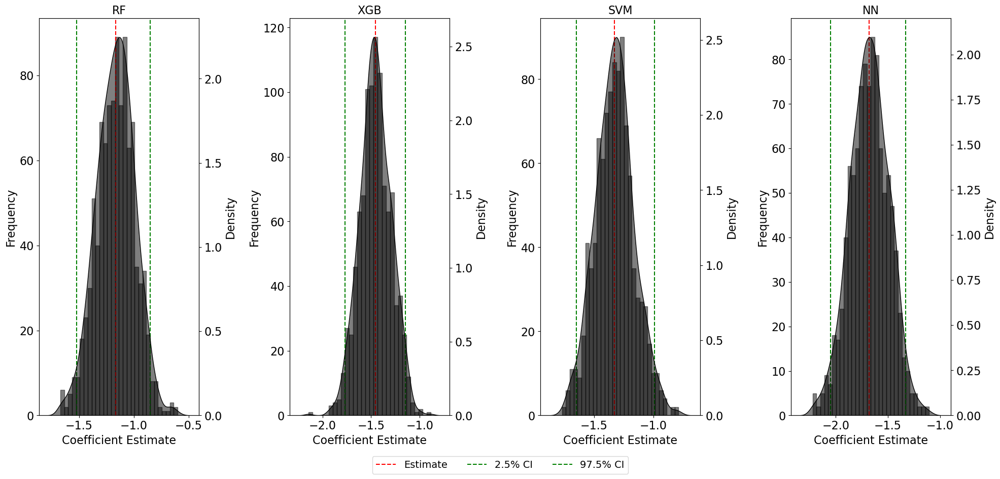

In [199]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'rf_predicted_fv_from_svm',
    'xgb_predicted_fv_from_svm',
    'svm_predicted_fv_from_svm',
    'nn_predicted_fv_from_svm'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RF", "XGB", "SVM", "NN"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')
    
# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

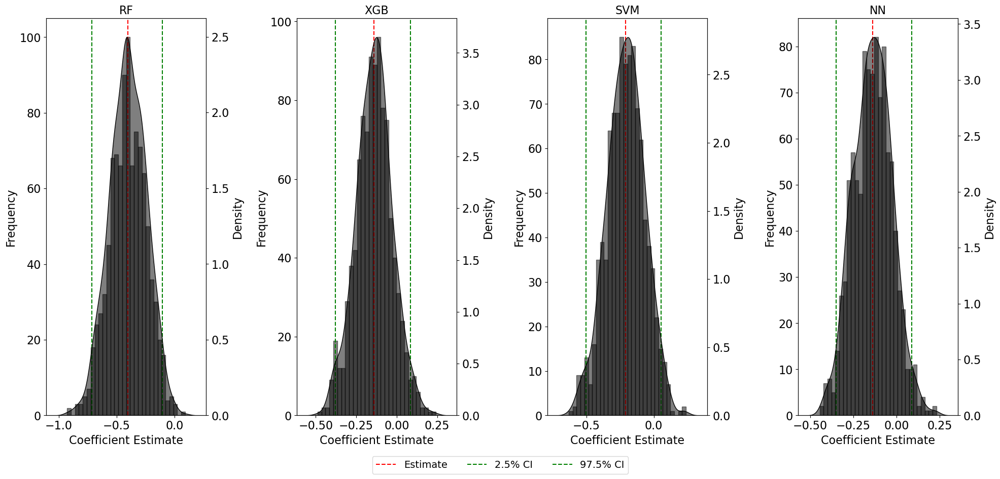

In [200]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf



# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'rf_resid_svm',
    'xgb_resid_svm',
    'svm_resid_svm',
    'nn_resid_svm'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RF", "XGB", "SVM", "NN"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

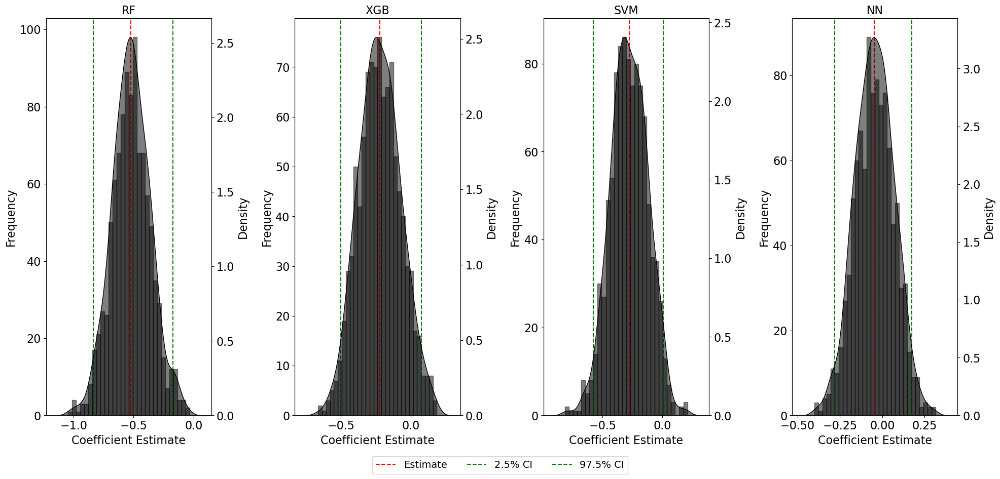

In [201]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})


# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'rf_resid_rf',
    'xgb_resid_rf',
    'svm_resid_rf',
    'nn_resid_rf'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RF", "XGB", "SVM", "NN"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

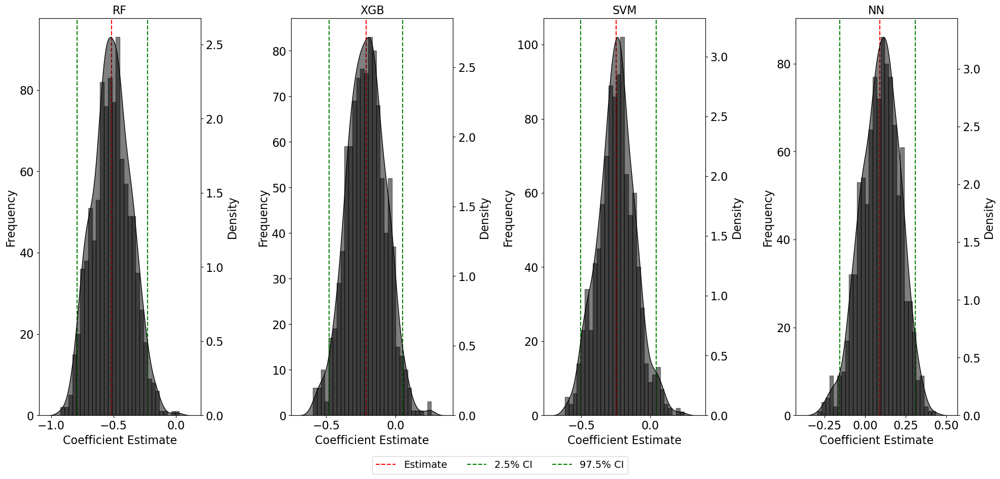

In [202]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'rf_resid_xgb',
    'xgb_resid_xgb',
    'svm_resid_xgb',
    'nn_resid_xgb'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 4, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RF", "XGB", "SVM", "NN"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

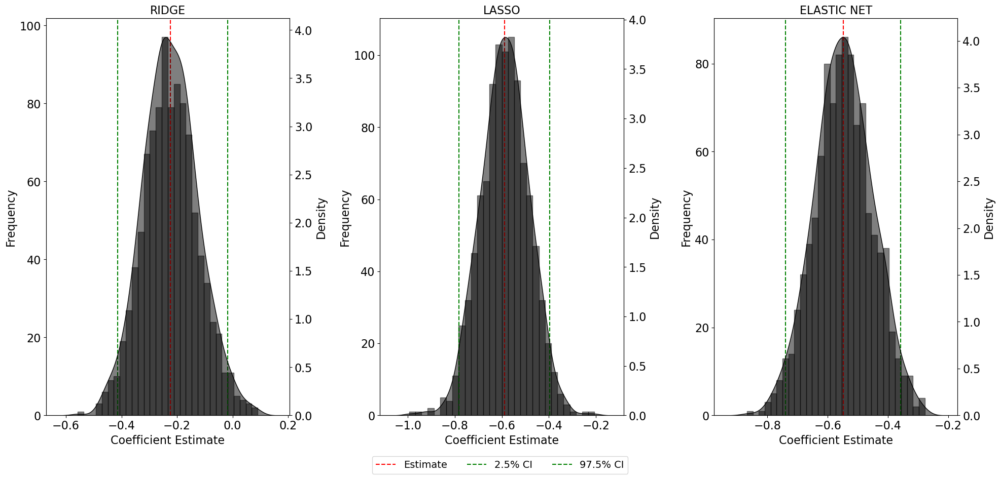

In [203]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'ridge_resid_fv',
    'lasso_resid_fv',
    'en_resid_fv'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 3, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RIDGE", "LASSO", "ELASTIC NET"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

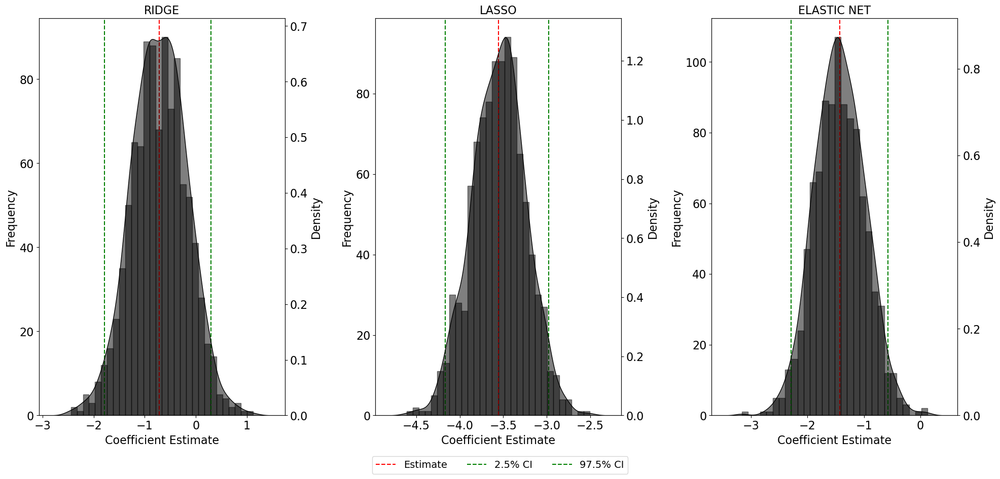

In [204]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Names of the predicted variables from each ML model
predicted_vars = [
    'lasso_predicted_fv',
    'ridge_predicted_fv',
    'en_predicted_fv'
]

# Perform bootstrap sampling and store results
for predicted_var in predicted_vars:
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = nonscaled_no_outliers.sample(n=len(nonscaled_no_outliers), replace=True)
        # Fit the model with the same controls as the second-stage regression
        formula = f"bp ~ {predicted_var} + red_meat + nuts + cholesterol + bmi + edu + race + gender + age + marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of the predicted variable
        coefs.append(model.params[predicted_var])
    bootstrap_samples[predicted_var] = coefs

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(1, 3, figsize=(20, 10))  # Adjust to 2x2 since we have 4 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["RIDGE", "LASSO", "ELASTIC NET"]

for i, (predicted_var, values) in enumerate(bootstrap_samples.items()):
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(model_titles[i])
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [68]:
strongest_filtered_data = nonscaled_no_outliers
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612,-0.092914,-0.244468,-0.137715
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612,-0.077225,-0.310589,-0.144331
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612,-0.062436,-0.245949,-0.105278
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291,-0.159458,-0.078850,-0.083581
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291,-0.245659,-0.583705,-0.334873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,-0.094154,0.213997,0.015785
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.029757,-0.003049,-0.041556
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.067706,0.000524,0.039905
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,0.215130,0.011018,0.104685


In [69]:
strongest_filtered_data = strongest_filtered_data.rename(columns={'DMDBORN4': 'birth_origin'})
strongest_filtered_data = strongest_filtered_data.rename(columns={'exercise': 'hard_exercise'})
strongest_filtered_data = strongest_filtered_data.rename(columns={'MCQ160K': 'history_bronchitis'})
strongest_filtered_data = strongest_filtered_data.rename(columns={'BPAEN2': 'enhancement'})
strongest_filtered_data = strongest_filtered_data.rename(columns={'HSD010': 'health_condition'})

In [70]:
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv
0,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.420000,182.0,1.098612,-0.092914,-0.244468,-0.137715
1,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.890000,182.0,1.098612,-0.077225,-0.310589,-0.144331
2,0.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,2.549986,182.0,1.098612,-0.062436,-0.245949,-0.105278
3,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.120000,208.0,0.916291,-0.159458,-0.078850,-0.083581
4,0.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,1.140000,208.0,0.916291,-0.245659,-0.583705,-0.334873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,-0.094154,0.213997,0.015785
64730,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.029757,-0.003049,-0.041556
64731,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.067706,0.000524,0.039905
64732,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,0.215130,0.011018,0.104685


In [208]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ fv", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ fv+red_meat+nuts", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [ ]:
# Count the occurrences of each unique value in DMDBORN4
value_counts = strongest_filtered_data['birth_origin'].value_counts()

# Plot the distribution
value_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of birth_origin')
plt.xlabel('Categories of birth_origin')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


In [ ]:
# Count the occurrences of each unique value in DMDBORN4
value_counts = strongest_filtered_data['hard_exercise'].value_counts()

# Plot the distribution
value_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of hard_exercise')
plt.xlabel('Categories of hard_exercise')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


In [ ]:
# Count the occurrences of each unique value in DMDBORN4
value_counts = strongest_filtered_data['history_bronchitis'].value_counts()

# Plot the distribution
value_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of history_bronchitis')
plt.xlabel('Categories of history_bronchitis')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
# Count the occurrences of each unique value in DMDBORN4
value_counts = strongest_filtered_data['health_condition'].value_counts()

# Plot the distribution
value_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of health_condition')
plt.xlabel('Categories of health_condition')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [ ]:
value_counts

In [258]:
strongest_filtered_data = strongest_filtered_data[strongest_filtered_data['hard_exercise'] <= 5]
strongest_filtered_data = strongest_filtered_data[strongest_filtered_data['birth_origin'] <= 50]
strongest_filtered_data = strongest_filtered_data[strongest_filtered_data['history_bronchitis'] <= 8]
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,5.400000,174.0,0.470004,-0.125472,-0.091868,-0.257610
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,3.340000,174.0,0.470004,-0.010405,0.416115,0.038419
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,3.373854,174.0,0.470004,-0.044777,0.041060,-0.128926
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.370000,186.0,0.847298,-0.070539,-0.082803,-0.121304
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,1.330000,186.0,0.847298,-0.046336,-0.193332,-0.189649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,-0.075751,0.212574,0.016483
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.034541,-0.018363,-0.046122
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.039422,-0.031549,0.020373
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,0.128696,-0.035230,0.039546


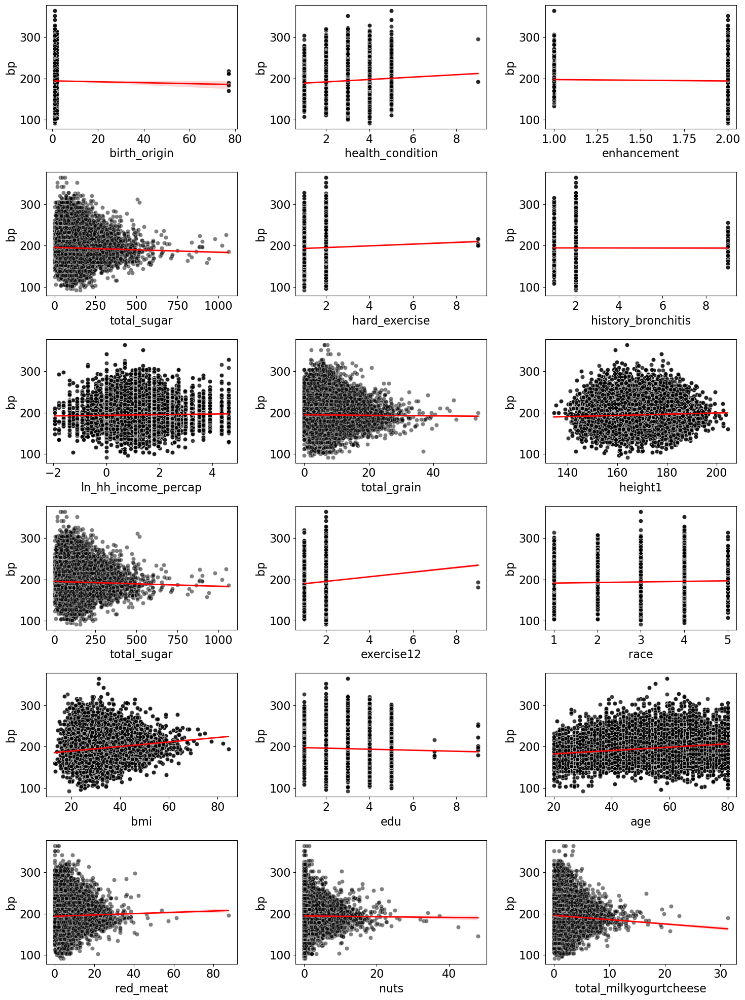

In [209]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a consistent font size for all text elements
font_size = 16

plt.figure(figsize=(15, 20))

# List of variables
height_vars = ['birth_origin', 'health_condition', 'enhancement', 'total_sugar', 'hard_exercise', 'history_bronchitis', 'ln_hh_income_percap', 'total_grain', 'height1', 'total_sugar', 'exercise12', 'race', 'bmi', 'edu', 'age', 'red_meat', 'nuts', 'total_milkyogurtcheese']

# Loop through each height variable and create a subplot
for i, var in enumerate(height_vars, 1):
    ax = plt.subplot(6, 3, i)  # Adjusted to 6 rows, 3 columns of subplots
    
    # Scatter plot in black
    sns.scatterplot(x=var, y='bp', data=strongest_filtered_data, alpha=0.5, color='black')
    
    # Line of best fit in red
    sns.regplot(x=var, y='bp', data=strongest_filtered_data, scatter=False, color='red', line_kws={'lw': 2})
    
    # Set title, labels, and tick labels with specified font size
    ax.set_xlabel(var, fontsize=font_size)
    ax.set_ylabel('bp', fontsize=font_size)
    ax.tick_params(axis='both', labelsize=font_size)

plt.tight_layout()
plt.show()


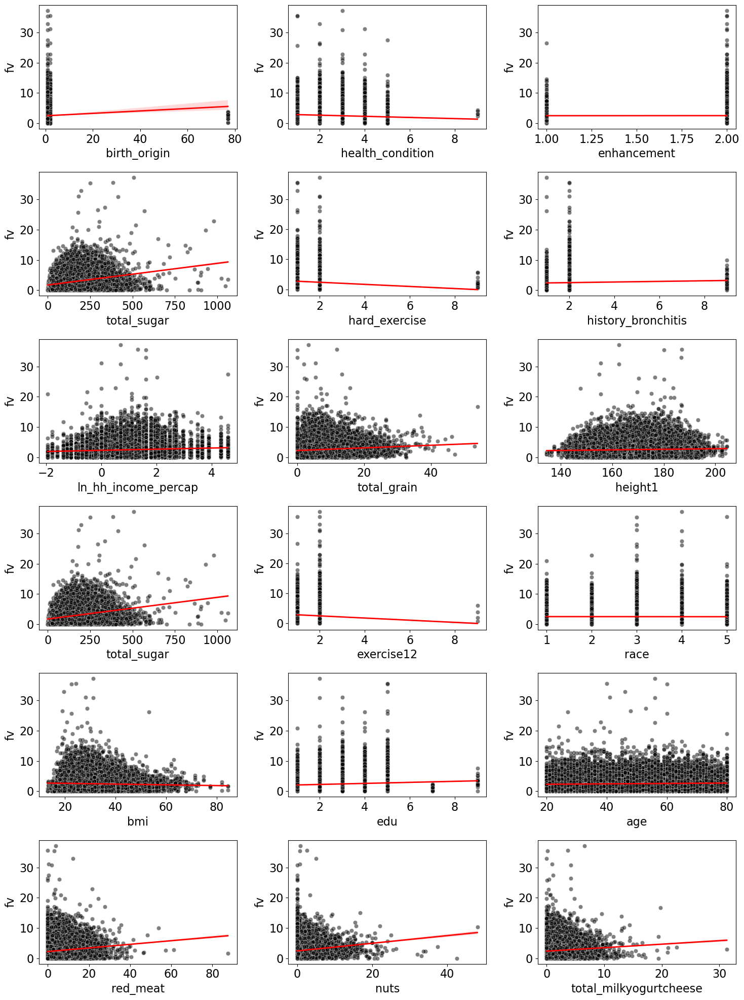

In [210]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a consistent font size for all text elements
font_size = 16

plt.figure(figsize=(15, 20))

# List of variables
height_vars = ['birth_origin', 'health_condition', 'enhancement', 'total_sugar', 'hard_exercise', 'history_bronchitis', 'ln_hh_income_percap', 'total_grain', 'height1', 'total_sugar', 'exercise12', 'race', 'bmi', 'edu', 'age', 'red_meat', 'nuts', 'total_milkyogurtcheese']

# Loop through each height variable and create a subplot
for i, var in enumerate(height_vars, 1):
    ax = plt.subplot(6, 3, i)  # Adjusted to 6 rows, 3 columns of subplots
    
    # Scatter plot in black
    sns.scatterplot(x=var, y='fv', data=strongest_filtered_data, alpha=0.5, color='black')
    
    # Line of best fit in red
    sns.regplot(x=var, y='fv', data=strongest_filtered_data, scatter=False, color='red', line_kws={'lw': 2})
    
    # Set title, labels, and tick labels with specified font size
    ax.set_xlabel(var, fontsize=font_size)
    ax.set_ylabel('fv', fontsize=font_size)
    ax.tick_params(axis='both', labelsize=font_size)

plt.tight_layout()
plt.show()


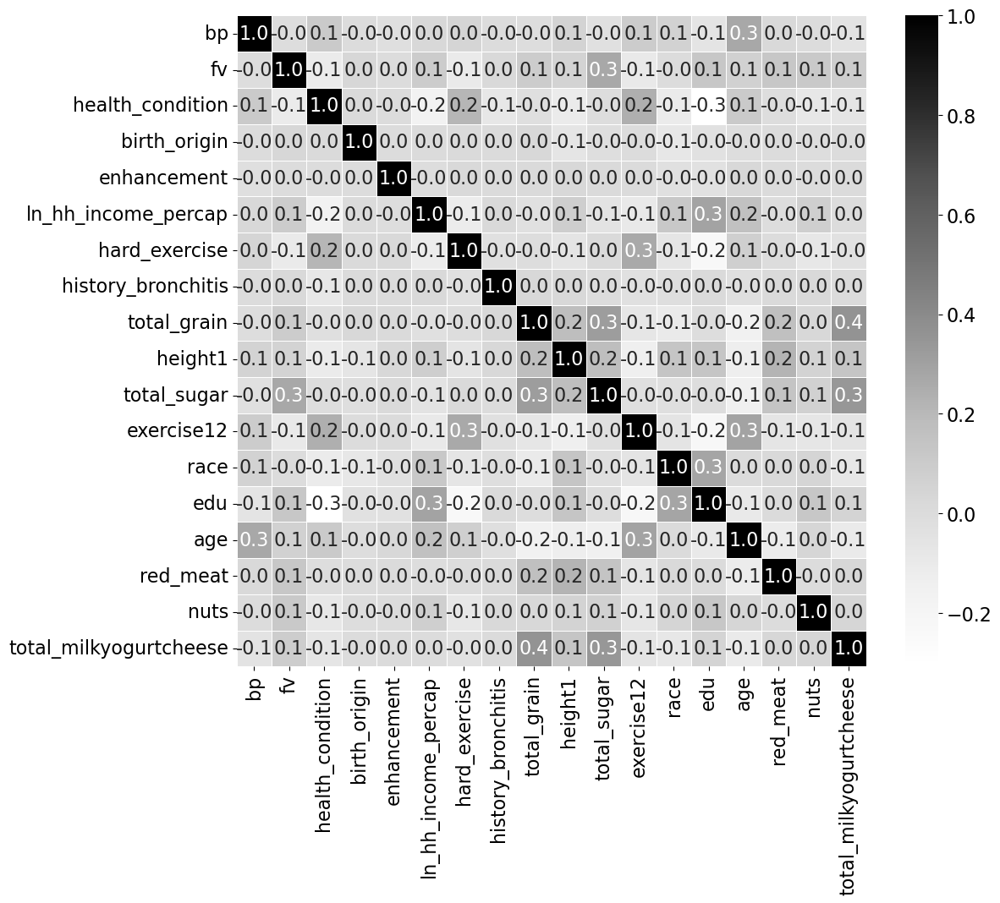

In [211]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select the desired columns
selected_cols = ["bp", "fv", "health_condition", "birth_origin", "enhancement", "ln_hh_income_percap", "hard_exercise", 
                 "history_bronchitis", "total_grain", "height1", "total_sugar", "exercise12", 
                 "race", "edu", "age", "red_meat", "nuts", "total_milkyogurtcheese"]

# Compute the correlation matrix for the selected columns
correlation_matrix = strongest_filtered_data[selected_cols].corr()

# Create a heatmap with a white-to-black color map
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True, fmt=".1f", cmap='Greys', linewidths=.5)

# Set the title with a consistent font size

plt.show()


# Only strong instruments with original controls 
the one used in the paper with model 7 from ml selected controls in the first-stage

In [74]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ exercise12", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ birth_origin+ln_hh_income_percap+exercise12+edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+ln_hh_income_percap+exercise12+edu+red_meat+nuts+total_cholesterol+bmi+age+race+gender+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+ln_hh_income_percap+exercise12+edu+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "ln_hh_income_percap", "exercise12", "edu", "red_meat", "nuts", "total_cholesterol", "bmi", "age", "race", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [75]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7


In [76]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


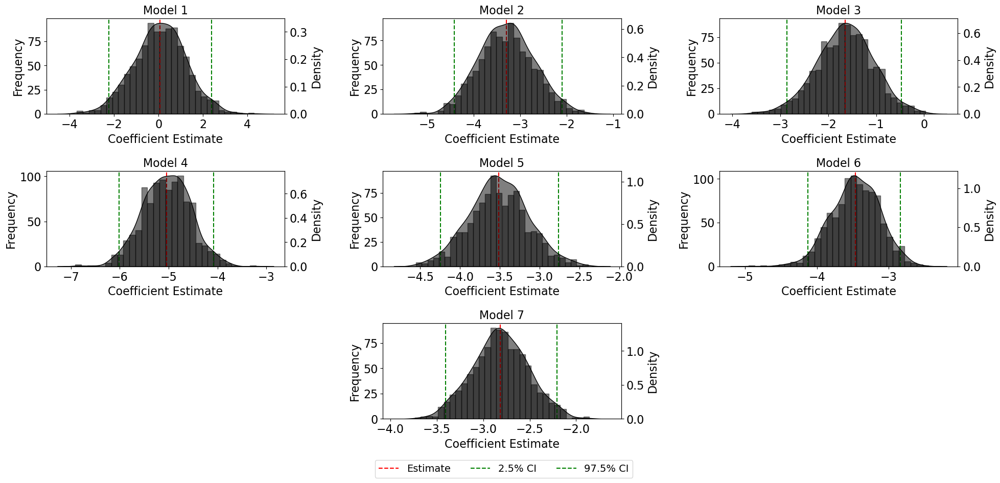

In [77]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy.stats import norm

# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")
    
# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Bootstrap Sampling
n_bootstrap = 1000
bootstrap_samples = {}

for i in range(1, 8):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = strongest_filtered_data.sample(n=len(strongest_filtered_data), replace=True)
        # Fit the model with the specific formula
        formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient of veggies_n_fruits_i
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(3, 3, figsize=(20, 10))  # 3x3 grid
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"]

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Skip the last two plots
    if i > 6:
        continue

    # Adjust index for the 7th model
    ax_idx = i if i < 6 else 7

    # Create a secondary axis for the KDE plot
    ax2 = axs[ax_idx].twinx()

    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[ax_idx].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[ax_idx].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[ax_idx].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[ax_idx].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[ax_idx].set_title(model_titles[i], fontsize=16)
    axs[ax_idx].set_xlabel('Coefficient Estimate', fontsize=16)
    axs[ax_idx].set_ylabel('Frequency', fontsize=16)

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Hide the last two subplots
axs[6].set_visible(False)
axs[8].set_visible(False)

# Place the legend in the figure
handles, labels = axs[7].get_legend_handles_labels()
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [78]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "edu", "work_type1", "red_meat", "total_grain", "total_milkyogurtcheese", "nuts", "height1", "VNTOTHDRATIO", "bmi", "age", "race"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [79]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7

In [80]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+cholesterol+bmi+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "cholesterol", "bmi", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2"], [1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [81]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


In [82]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy.stats import norm

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 10):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = strongest_filtered_data.sample(n=len(strongest_filtered_data), replace=True)
        # Fit the model
        model = smf.ols(f"bp ~ veggies_n_fruits_{i}", data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(3, 3, figsize=(20, 10))  # 3x3 grid
axs = axs.flatten()  # Flatten the axes array for easy indexing

model_titles = ["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"]

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Skip the last two plots
    if i > 6:
        continue

    # Adjust index for the 7th model
    ax_idx = i if i < 6 else 7

    # Create a secondary axis for the KDE plot
    ax2 = axs[ax_idx].twinx()

    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram on the primary y-axis
    axs[ax_idx].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and confidence interval bounds on the primary y-axis
    axs[ax_idx].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[ax_idx].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[ax_idx].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[ax_idx].set_title(model_titles[i], fontsize=16)
    axs[ax_idx].set_xlabel('Coefficient Estimate', fontsize=16)
    axs[ax_idx].set_ylabel('Frequency', fontsize=16)

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Hide the last two subplots
axs[6].set_visible(False)
axs[8].set_visible(False)

# Place the legend in the figure
handles, labels = axs[7].get_legend_handles_labels()
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


PatsyError: Error evaluating factor: NameError: name 'veggies_n_fruits_8' is not defined
    bp ~ veggies_n_fruits_8
         ^^^^^^^^^^^^^^^^^^

# Original controls in both stages

In [327]:
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap,lasso_predicted_fv,ridge_predicted_fv,en_predicted_fv
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,5.400000,174.0,0.470004,-0.125472,-0.091868,-0.257610
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,3.340000,174.0,0.470004,-0.010405,0.416115,0.038419
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,3.373854,174.0,0.470004,-0.044777,0.041060,-0.128926
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.370000,186.0,0.847298,-0.070539,-0.082803,-0.121304
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,1.330000,186.0,0.847298,-0.046336,-0.193332,-0.189649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,3.390000,198.0,2.484907,-0.075751,0.212574,0.016483
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.0,2.475441,198.0,2.484907,-0.034541,-0.018363,-0.046122
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,3.520000,238.0,0.559616,0.039422,-0.031549,0.020373
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,1.0,0.000000,238.0,0.559616,0.128696,-0.035230,0.039546


In [328]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ exercise12", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ history_bronchitis", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ total_sugar", data=strongest_filtered_data).fit(cov_type="HC1")
reg8 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+exercise12+history_bronchitis+edu+total_sugar", data=strongest_filtered_data).fit(cov_type="HC1")
reg9 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+exercise12+history_bronchitis+edu+total_sugar+red_meat+nuts+total_cholesterol+bmi+age+race+gender+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7, reg8, reg9])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "exercise12", "history_bronchitis", "edu", "total_sugar", "red_meat", "nuts", "total_cholesterol", "bmi", "age", "race", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7", "Model 8", "Model 9"], [1, 1, 1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [329]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()
predicted_values_8 = reg8.predict()
predicted_values_9 = reg9.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7
strongest_filtered_data['veggies_n_fruits_8'] = predicted_values_8
strongest_filtered_data['veggies_n_fruits_9'] = predicted_values_9

In [330]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 10):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 10):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 9)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


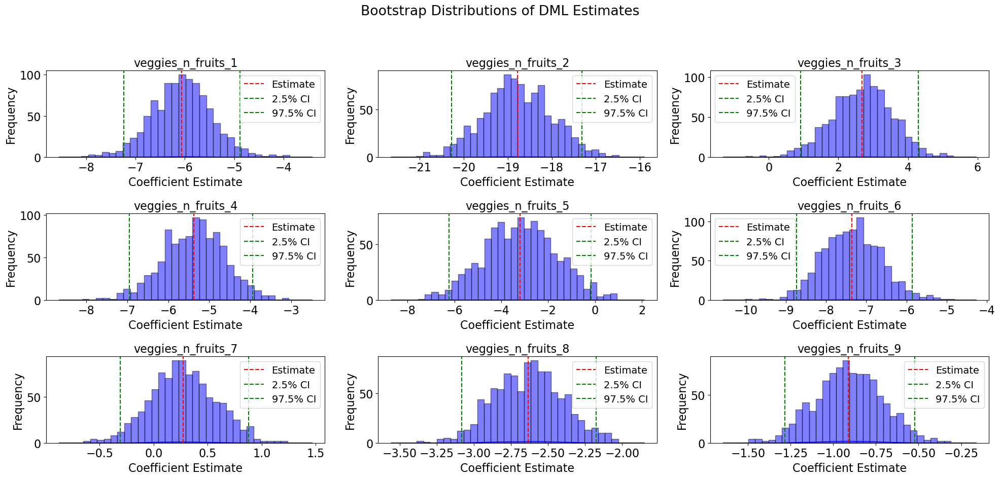

In [195]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy.stats import norm

# Assuming 'strongest_filtered_data' is your DataFrame with the data
# and 'models' is a list of strings with your model names

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 10):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = strongest_filtered_data.sample(n=len(strongest_filtered_data), replace=True)
        # Fit the model
        model = smf.ols(f"bp ~ veggies_n_fruits_{i}", data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(3, 3, figsize=(20, 10))  # Adjust to 3x3 if you have 9 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram
    axs[i].hist(values, bins=30, alpha=0.5, color='blue', edgecolor='black')

    # KDE plot
    sns.kdeplot(values, ax=axs[i], fill=True, color='blue')

    # Add vertical lines for the mean estimate and confidence interval bounds
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels
    axs[i].set_title(key)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')
    axs[i].legend()

plt.suptitle('Bootstrap Distributions of DML Estimates')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


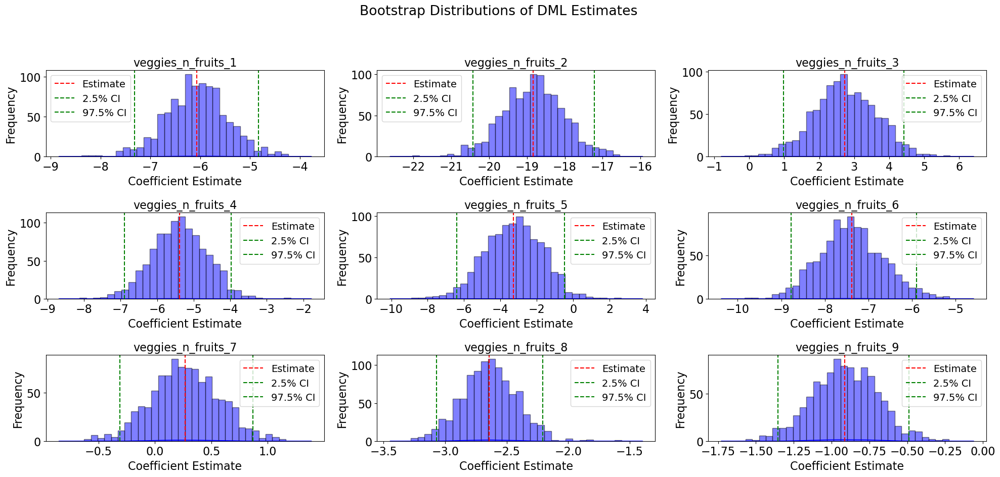

In [196]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy.stats import norm

# Assuming 'strongest_filtered_data' is your DataFrame with the data
# and 'models' is a list of strings with your model names

# Define the number of bootstrap samples
n_bootstrap = 1000
bootstrap_samples = {}

# Perform bootstrap sampling and store results
for i in range(1, 10):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = strongest_filtered_data.sample(n=len(strongest_filtered_data), replace=True)
        # Fit the model
        model = smf.ols(f"bp ~ veggies_n_fruits_{i}", data=sample).fit(cov_type='HC1')
        # Store the coefficient
        coefs.append(model.params[f'veggies_n_fruits_{i}'])
    bootstrap_samples[f'veggies_n_fruits_{i}'] = coefs

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(3, 3, figsize=(20, 10))  # Adjust to 3x3 if you have 9 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

for i, (key, values) in enumerate(bootstrap_samples.items()):
    # Calculate the confidence interval and mean estimate
    ci_lower = np.percentile(values, 2.5)
    ci_upper = np.percentile(values, 97.5)
    mean_estimate = np.mean(values)

    # Histogram
    axs[i].hist(values, bins=30, alpha=0.5, color='blue', edgecolor='black')

    # KDE plot
    sns.kdeplot(values, ax=axs[i], fill=True, color='blue')

    # Add vertical lines for the mean estimate and confidence interval bounds
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels
    axs[i].set_title(key)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')
    axs[i].legend()

plt.suptitle('Bootstrap Distributions of DML Estimates')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Only strong instruments with original controls 

In [331]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1+red_meat+nuts+total_cholesterol+bmi+age+race+gender+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "edu", "work_type1", "red_meat", "nuts", "total_cholesterol", "bmi", "age", "race", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [332]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()


# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7


In [333]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_7", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_8+red_meat+nuts+cholesterol+bmi+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_7", "red_meat", "nuts", "cholesterol", "bmi", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2"], [1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [334]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


In [304]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+edu+work_type1+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "edu", "work_type1", "red_meat", "total_grain", "total_milkyogurtcheese", "nuts", "height1", "VNTOTHDRATIO", "bmi", "age", "race"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [305]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7

In [306]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+cholesterol+bmi+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "cholesterol", "bmi", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2"], [1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [307]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


# Model 5 ML Selected Controls for both stages

In [335]:
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,en_predicted_fv,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,veggies_n_fruits_7,veggies_n_fruits_8,veggies_n_fruits_9
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.257610,2.537850,2.280568,2.383779,2.095502,2.553354,2.088176,2.396027,1.767441,2.058350
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.038419,2.537850,2.280568,2.383779,2.095502,2.553354,2.088176,3.217475,2.088226,3.016273
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.128926,2.537850,2.280568,2.383779,2.095502,2.553354,2.088176,2.570031,1.968675,2.389359
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.121304,2.481327,2.280568,2.451932,2.409908,2.553354,2.282910,2.593732,2.004252,2.324002
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.189649,2.481327,2.280568,2.451932,2.409908,2.553354,2.282910,2.076505,2.126484,2.027371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.016483,2.537850,2.280568,2.747744,2.409908,2.426502,2.440624,3.460933,2.234698,2.923541
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.046122,2.537850,2.280568,2.747744,2.409908,2.426502,2.440624,2.824186,2.385235,2.563552
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.020373,2.481327,2.464136,2.399966,2.567111,2.426502,2.403430,2.595936,2.484339,2.503321
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.039546,2.481327,2.464136,2.399966,2.567111,2.426502,2.403430,2.042294,2.862681,2.420748


In [336]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ history_bronchitis", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+history_bronchitis+edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+history_bronchitis+edu+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "history_bronchitis", "edu", "red_meat", "total_grain", "total_milkyogurtcheese", "nuts", "height1", "VNTOTHDRATIO", "bmi", "age", "race"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [337]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,en_predicted_fv,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,veggies_n_fruits_7,veggies_n_fruits_8,veggies_n_fruits_9
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.257610,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,2.237683,1.767441,2.058350
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.038419,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,3.051195,2.088226,3.016273
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.128926,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,2.413409,1.968675,2.389359
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.121304,2.481327,2.280568,2.451932,2.509286,2.409908,2.258018,2.603540,2.004252,2.324002
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.189649,2.481327,2.280568,2.451932,2.509286,2.409908,2.258018,2.003033,2.126484,2.027371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.016483,2.537850,2.280568,2.747744,2.509286,2.409908,2.499607,3.471425,2.234698,2.923541
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.046122,2.537850,2.280568,2.747744,2.509286,2.409908,2.499607,2.807124,2.385235,2.563552
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.020373,2.481327,2.464136,2.399966,2.509286,2.567111,2.452013,2.209532,2.484339,2.503321
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.039546,2.481327,2.464136,2.399966,2.509286,2.567111,2.452013,1.825027,2.862681,2.420748


In [338]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "total_grain", "total_milkyogurtcheese", "nuts", "height1", "VNTOTHDRATIO", "bmi", "age", "race"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


# Model 6  ML Instruments with ML Controls in first-stage and original controls in second stage

In [339]:
# Blood pressure vs amount of fruit and vegetables from tuned ml models' feature importances: xgboost
reg1 = smf.ols("fv ~ birth_origin", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ health_condition", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ history_bronchitis", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+history_bronchitis+edu", data=strongest_filtered_data).fit(cov_type="HC1")
reg7 = smf.ols("fv ~ birth_origin+health_condition+ln_hh_income_percap+history_bronchitis+edu+red_meat+total_grain+total_milkyogurtcheese+nuts+height1+VNTOTHDRATIO+bmi+age+race", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6, reg7])
stargazer.covariate_order(["Intercept", "birth_origin", "health_condition", "ln_hh_income_percap", "history_bronchitis", "edu", "red_meat", "total_grain", "total_milkyogurtcheese", "nuts", "height1", "VNTOTHDRATIO", "bmi", "age", "race"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6", "Model 7"], [1, 1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [340]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,en_predicted_fv,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,veggies_n_fruits_7,veggies_n_fruits_8,veggies_n_fruits_9
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.257610,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,2.237683,1.767441,2.058350
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.038419,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,3.051195,2.088226,3.016273
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.128926,2.537850,2.280568,2.383779,2.509286,2.095502,2.063599,2.413409,1.968675,2.389359
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.121304,2.481327,2.280568,2.451932,2.509286,2.409908,2.258018,2.603540,2.004252,2.324002
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.189649,2.481327,2.280568,2.451932,2.509286,2.409908,2.258018,2.003033,2.126484,2.027371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.016483,2.537850,2.280568,2.747744,2.509286,2.409908,2.499607,3.471425,2.234698,2.923541
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.046122,2.537850,2.280568,2.747744,2.509286,2.409908,2.499607,2.807124,2.385235,2.563552
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.020373,2.481327,2.464136,2.399966,2.509286,2.567111,2.452013,2.209532,2.484339,2.503321
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.039546,2.481327,2.464136,2.399966,2.509286,2.567111,2.452013,1.825027,2.862681,2.420748


In [341]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 8):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Model {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 8):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["red_meat", "nuts", "total_cholesterol", "bmi", "race", "age", "gender", "marital_status"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


In [213]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Define the number of bootstrap samples
n_bootstrap = 1000

# Function to perform bootstrap and store results
def bootstrap_regression(formula, data, n_bootstrap):
    coefs = []
    for _ in range(n_bootstrap):
        # Create a bootstrap sample
        sample = data.sample(n=len(data), replace=True)
        # Fit the model
        model = smf.ols(formula, data=sample).fit(cov_type='HC1')
        # Store the coefficient for veggies_n_fruits
        coefs.append(model.params[formula.split("~")[1].split("+")[0].strip()])
    return coefs

# Store bootstrap results for each veggies_n_fruits scenario
bootstrap_samples = {}

# Perform bootstrap sampling for each veggies_n_fruits scenario
for i in range(1, 10):
    formula = f"bp ~ veggies_n_fruits_{i}+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status"
    bootstrap_samples[f"Model {i}"] = bootstrap_regression(formula, strongest_filtered_data, n_bootstrap)

# Plotting histograms and KDE plots for each bootstrap sample
fig, axs = plt.subplots(3, 3, figsize=(20, 15))  # Adjust to 3x3 for 9 models
axs = axs.flatten()  # Flatten the axes array for easy indexing

# Iterate over each bootstrap sample and plot
for i, (scenario, values) in enumerate(bootstrap_samples.items()):
    ax2 = axs[i].twinx()  # Create a secondary axis for the KDE plot
    mean_estimate = np.mean(values)  # Calculate mean estimate
    ci_lower = np.percentile(values, 2.5)  # Calculate lower CI bound
    ci_upper = np.percentile(values, 97.5)  # Calculate upper CI bound

    # Histogram on the primary y-axis
    axs[i].hist(values, bins=30, alpha=0.5, color='black', edgecolor='black')
    # KDE plot on the secondary y-axis
    sns.kdeplot(values, ax=ax2, fill=True, color='black', alpha=0.5)

    # Add vertical lines for the mean estimate and CI bounds on the primary y-axis
    axs[i].axvline(x=mean_estimate, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')

    # Set titles and labels for primary y-axis
    axs[i].set_title(scenario)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

    # Set labels for secondary y-axis
    ax2.set_ylabel('Density')
    ax2.grid(False)  # Turn off grid for the secondary y-axis

# Place the legend in the figure
fig.legend(handles=handles, loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=3)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

PatsyError: Error evaluating factor: NameError: name 'veggies_n_fruits_1' is not defined
    bp ~ veggies_n_fruits_1+red_meat+nuts+total_cholesterol+bmi+race+gender+age+marital_status
         ^^^^^^^^^^^^^^^^^^

In [213]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()
predicted_values_7 = reg7.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data['veggies_n_fruits_7'] = predicted_values_7
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,xgb_resid_svm,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,veggies_n_fruits_7,veggies_n_fruits_8,veggies_n_fruits_9
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,1.231040,2.852502,2.279886,2.382673,2.340794,2.519174,2.094705,2.253053,2.050829,2.207091
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.364446,2.852502,2.279886,2.382673,2.340794,2.519174,2.094705,2.563095,2.392556,3.175613
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.258730,2.852502,2.279886,2.382673,2.340794,2.519174,2.094705,2.447547,2.265199,2.544615
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.041038,2.361028,2.279886,2.451186,2.340794,2.519174,2.409313,2.301157,1.762220,2.006116
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.432162,2.361028,2.279886,2.451186,2.340794,2.519174,2.409313,2.419296,1.892432,1.745124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.066285,2.852502,2.279886,2.748558,2.340794,2.519174,2.409313,2.269066,2.617963,3.383002
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.394059,2.852502,2.279886,2.748558,2.340794,2.519174,2.409313,2.414562,2.778327,3.028678
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.082718,2.361028,2.463518,2.398946,2.340794,2.519174,2.566617,2.612100,2.301034,2.350553
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,-0.780256,2.361028,2.463518,2.398946,2.340794,2.519174,2.566617,2.977771,2.704075,2.329688


In [214]:
# Function to get the reg4 for each veggies_n_fruits scenario
def get_reg4(formula, data):
    return smf.ols(formula, data=strongest_filtered_data).fit(cov_type="HC1")

# List to store reg4 models for each veggies_n_fruits scenario
reg4_models = []

# List to store model names for custom columns in Stargazer
model_names = []

# Generate reg4 models for each veggies_n_fruits scenario
for i in range(1, 6):
    formula = f"bp ~ veggies_n_fruits_{i}+total_sugar+red_meat+total_milkyogurtcheese+nuts+VNTOTHDRATIO+exercise12+edu+age+race"
    reg4_models.append(get_reg4(formula, strongest_filtered_data))
    model_names.append(f"Scenario {i}")

# Combine all reg4's into a stargazer table
stargazer = Stargazer(reg4_models)

# Specifying the covariate order for Stargazer
covariate_order_list = ["Intercept"]
for i in range(1, 6):
    covariate_order_list.append(f"veggies_n_fruits_{i}")
covariate_order_list.extend(["total_sugar", "red_meat", "total_milkyogurtcheese", "nuts", "VNTOTHDRATIO", "exercise12", "edu",  "age", "race"])

stargazer.covariate_order(covariate_order_list)
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(model_names, [1] * 5)
stargazer.show_model_numbers(False)

# Render stargazer table
HTML(stargazer.render_html())


# Traditional IV estimates for comparison

In [342]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("fv ~ ln_hh_income_percap", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("fv ~ hh_size1", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("fv ~ exercise12", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("fv ~ work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg5 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise12+work_type1", data=strongest_filtered_data).fit(cov_type="HC1")
reg6 = smf.ols("fv ~ ln_hh_income_percap+hh_size1+exercise12+work_type1+age+gender+marital_status+race+edu", data=strongest_filtered_data).fit(cov_type="HC1")

stargazer = Stargazer([reg1, reg2, reg3, reg4, reg5, reg6])
stargazer.covariate_order(["Intercept", "ln_hh_income_percap", "hh_size1", "exercise12", "work_type1", "age", "gender", "marital_status","race", "edu"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4", "Model 5", "Model 6"], [1, 1, 1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [343]:
# Extract predicted values for each model
predicted_values_1 = reg1.predict()
predicted_values_2 = reg2.predict()
predicted_values_3 = reg3.predict()
predicted_values_4 = reg4.predict()
predicted_values_5 = reg5.predict()
predicted_values_6 = reg6.predict()

# Add the predicted values as new columns to the DataFrame
strongest_filtered_data['veggies_n_fruits_1'] = predicted_values_1
strongest_filtered_data['veggies_n_fruits_2'] = predicted_values_2
strongest_filtered_data['veggies_n_fruits_3'] = predicted_values_3
strongest_filtered_data['veggies_n_fruits_4'] = predicted_values_4
strongest_filtered_data['veggies_n_fruits_5'] = predicted_values_5
strongest_filtered_data['veggies_n_fruits_6'] = predicted_values_6
strongest_filtered_data

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,health_condition,HSQ500,HSQ510,HSQ520,HSQ571,...,en_predicted_fv,veggies_n_fruits_1,veggies_n_fruits_2,veggies_n_fruits_3,veggies_n_fruits_4,veggies_n_fruits_5,veggies_n_fruits_6,veggies_n_fruits_7,veggies_n_fruits_8,veggies_n_fruits_9
0,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.257610,2.383779,2.446081,2.378603,2.553354,2.349990,2.436589,2.237683,1.767441,2.058350
1,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.038419,2.383779,2.446081,2.378603,2.553354,2.349990,2.436589,3.051195,2.088226,3.016273
2,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.128926,2.383779,2.446081,2.378603,2.553354,2.349990,2.436589,2.413409,1.968675,2.389359
3,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.121304,2.451932,2.506899,2.378603,2.553354,2.382415,2.343283,2.603540,2.004252,2.324002
4,3.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.189649,2.451932,2.506899,2.378603,2.553354,2.382415,2.343283,2.003033,2.126484,2.027371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32629,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,0.016483,2.747744,2.567716,2.378603,2.426502,2.533881,2.585702,3.471425,2.234698,2.923541
32630,6.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0,2.0,...,-0.046122,2.747744,2.567716,2.378603,2.426502,2.533881,2.585702,2.807124,2.385235,2.563552
32631,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.020373,2.399966,2.476490,2.378603,2.426502,2.265210,2.406926,2.209532,2.484339,2.503321
32632,8.0,1.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,0.039546,2.399966,2.476490,2.378603,2.426502,2.265210,2.406926,1.825027,2.862681,2.420748


In [344]:
# Blood pressure vs amount of fruit and vegetables
reg1 = smf.ols("bp ~ veggies_n_fruits_6", data=strongest_filtered_data).fit(cov_type="HC1")
reg2 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts", data=strongest_filtered_data).fit(cov_type="HC1")
reg3 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol", data=strongest_filtered_data).fit(cov_type="HC1")
reg4 = smf.ols("bp ~ veggies_n_fruits_6+red_meat+nuts+total_cholesterol+edu+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
stargazer = Stargazer([reg1, reg2, reg3, reg4])
stargazer.covariate_order(["Intercept", "veggies_n_fruits_6", "red_meat", "nuts", "total_cholesterol", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})
stargazer.custom_columns(["Model 1", "Model 2", "Model 3", "Model 4"], [1, 1, 1, 1])
stargazer.show_model_numbers(False)
HTML(stargazer.render_html())

In [345]:
# Your baseline model's reg4
baseline_reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")

# List to store all model reg4's including the baseline
all_reg4s = [baseline_reg4]

# Loop over veggies_n_fruits from 1 to 9 and run regression for each
for i in range(1, 7):
    strongest_filtered_data['fv'] = strongest_filtered_data[f'veggies_n_fruits_{i}']
    
    reg4 = smf.ols("bp ~ fv+red_meat+nuts+total_cholesterol+bmi+edu+race+gender+age+marital_status", data=strongest_filtered_data).fit(cov_type="HC1")
    all_reg4s.append(reg4)

# Report results using Stargazer
stargazer = Stargazer(all_reg4s)
stargazer.covariate_order(["Intercept", "fv", "red_meat", "nuts", "total_cholesterol", "bmi", "edu", "race", "age", "gender", "marital_status"])
stargazer.rename_covariates({"Intercept": "Constant"})

# Names for the results table
model_names = ["Baseline Model 4"] + ["Model 4 for veggies_n_fruits_" + str(i) for i in range(1, 7)]

stargazer.custom_columns(model_names, [1] * 7)
stargazer.show_model_numbers(False)

# Displaying the HTML
HTML(stargazer.render_html())


# MODELS FOR ROBUSTNESS USING DML 

In [86]:
# Assuming filtered_data_standardized is your original DataFrame
columns = ['bp', 'fv', 'red_meat', 'nuts', 'total_cholesterol', 'bmi', 'edu', 'race', 'gender', 'age', 'marital_status']

# Create the new DataFrame
traditional_df = filtered_data_standardized[columns].copy()

# Display the first few rows of the new DataFrame
print(traditional_df.head())


         bp        fv  red_meat      nuts  total_cholesterol       bmi  \
0 -0.473188 -0.047519 -0.019474 -0.420623          -0.327824  4.134877   
1 -0.473188 -0.356386 -0.672846 -0.420623          -0.327824  4.134877   
2 -0.473188  0.028232 -0.232333 -0.277693          -0.327824  4.134877   
3  0.532707  0.360417  2.634132 -0.420623          -0.042367  0.100734   
4  0.532707 -0.793461 -0.844786 -0.420623          -0.042367  0.100734   

        edu      race    gender       age  marital_status  
0 -0.408638  1.769377  1.052346  0.721227       -0.671781  
1 -0.408638  1.769377  1.052346  0.721227       -0.671781  
2 -0.408638  1.769377  1.052346  0.721227       -0.671781  
3 -0.408638 -0.001929 -0.950258  1.239257       -0.671781  
4 -0.408638 -0.001929 -0.950258  1.239257       -0.671781  


In [87]:
filtered_data_standardized

,howoftendrinkalc,BPQ020,DIQ010,DIQ050_x,HSAQUEX,HSD010,HSQ500,HSQ510,HSQ520,HSQ571,...,race,RIDSTATR,SDMVPSU,SIAINTRP,SIAPROXY,work_type,work_type1,fv,bp,ln_hh_income_percap
0,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.047519,-0.473188,-0.096055
1,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.356386,-0.473188,-0.096055
2,-0.155751,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,1.769377,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.028232,-0.473188,-0.096055
3,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.360417,0.532707,-0.304660
4,-0.155751,-1.190790,-2.211944,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-0.793461,0.532707,-0.304660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,0.517764,0.145824,1.490088
64730,0.039135,0.652237,0.245080,0.167595,0.0,1.229091,0.316467,0.197579,0.096608,0.151497,...,-1.773236,0.0,0.904055,0.121388,0.059321,-0.863908,-0.717234,-0.015210,0.145824,1.490088
64731,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,0.593524,1.693354,-0.712753
64732,0.104098,-1.190790,0.245080,0.167595,0.0,0.193479,0.316467,0.197579,0.096608,0.151497,...,-0.001929,0.0,-0.974334,0.121388,0.059321,1.209280,-0.717234,-1.457815,1.693354,-0.712753


In [88]:
traditional_df

,bp,fv,red_meat,nuts,total_cholesterol,bmi,edu,race,gender,age,marital_status
0,-0.473188,-0.047519,-0.019474,-0.420623,-0.327824,4.134877,-0.408638,1.769377,1.052346,0.721227,-0.671781
1,-0.473188,-0.356386,-0.672846,-0.420623,-0.327824,4.134877,-0.408638,1.769377,1.052346,0.721227,-0.671781
2,-0.473188,0.028232,-0.232333,-0.277693,-0.327824,4.134877,-0.408638,1.769377,1.052346,0.721227,-0.671781
3,0.532707,0.360417,2.634132,-0.420623,-0.042367,0.100734,-0.408638,-0.001929,-0.950258,1.239257,-0.671781
4,0.532707,-0.793461,-0.844786,-0.420623,-0.042367,0.100734,-0.408638,-0.001929,-0.950258,1.239257,-0.671781
...,...,...,...,...,...,...,...,...,...,...,...
64729,0.145824,0.517764,2.404878,3.081073,-0.254158,0.929470,-0.408638,-1.773236,-0.950258,-0.429952,0.605635
64730,0.145824,-0.015210,0.800210,0.960397,-0.254158,0.929470,-0.408638,-1.773236,-0.950258,-0.429952,0.605635
64731,1.693354,0.593524,1.241418,-0.420623,-0.705363,0.972708,0.406598,-0.001929,-0.950258,-0.660188,0.179830
64732,1.693354,-1.457815,-1.412187,-0.420623,-0.705363,0.972708,0.406598,-0.001929,-0.950258,-0.660188,0.179830


# DML USING NON-LINEAR ALGORITHMS

# Traditional IV estimates data

In [89]:
# Corrected import
import statsmodels.api as sm
from statsmodels.tools import add_constant

y = traditional_df['bp']
d = traditional_df['fv']
X = traditional_df.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "RF": RandomForestRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "NN": MLPRegressor(random_state=42)
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,RF,-0.008971,0.002305,0.000100,0.000234
1,XGB,-0.013122,0.003398,0.000113,0.000230
2,SVM,-0.014409,0.003678,0.000090,0.000237
3,NN,-0.014497,0.003680,0.000082,0.000240


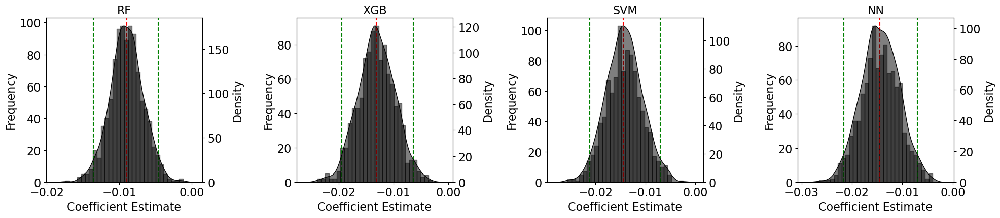

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Full sample initial tuned ML models data  

In [91]:
y = filtered_data_standardized['bp']
d = filtered_data_standardized['fv']
X = filtered_data_standardized.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "RF": RandomForestRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "NM": MLPRegressor(random_state=42)
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = sm.add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,RF,-0.003345,0.001344,0.012808,0.000096
1,XGB,-0.003928,0.002260,0.082264,0.000047
2,SVM,-0.004252,0.002361,0.071774,0.000050
3,NM,0.001582,0.002295,0.490728,0.000007


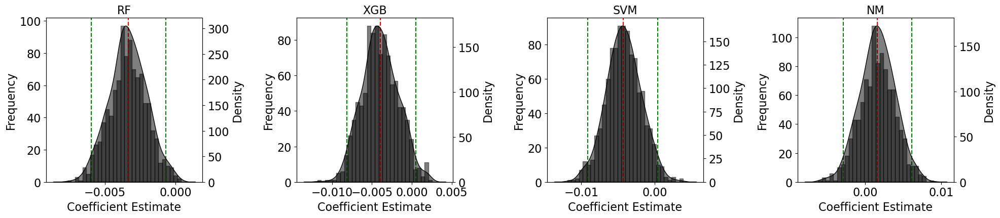

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Selected important features data

# RF

In [102]:
y = final_df55['bp']
d = final_df55['fv']
X = final_df55.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "RF": RandomForestRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "NN": MLPRegressor(random_state=42)
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = sm.add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,RF,-0.003420,0.001363,0.012069,9.733205e-05
1,XGB,-0.003956,0.002274,0.081969,4.673681e-05
2,SVM,-0.006034,0.002376,0.011089,9.965371e-05
3,NN,-0.000133,0.002365,0.955237,4.867503e-08


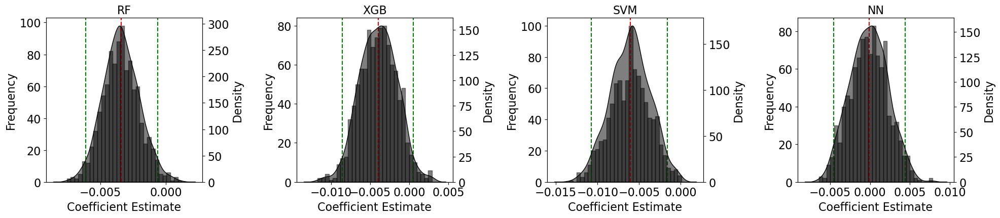

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# XGB

In [124]:
y = new_df_70_xgb['bp']
d = new_df_70_xgb['fv']
X = new_df_70_xgb.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "RF": RandomForestRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "NN": MLPRegressor(random_state=42)
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = sm.add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,RF,-0.003239,0.001344,0.015967,0.000090
1,XGB,-0.004256,0.002260,0.059679,0.000055
2,SVM,-0.004253,0.002361,0.071681,0.000050
3,NN,0.000913,0.002312,0.692844,0.000002


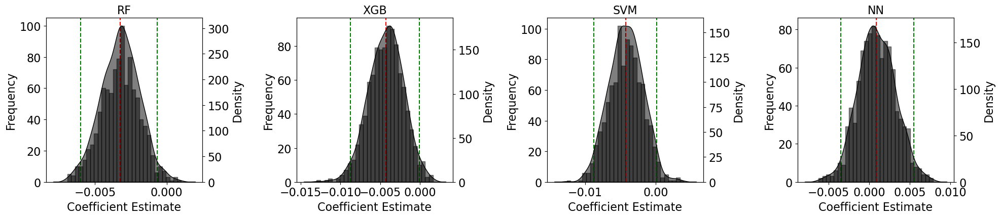

In [125]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [109]:
important_data_svm_100

,total_sugar,DMDBORN4,edu,red_meat,bmi,age,exercise12,HSD010,ln_hh_income_percap,PAQ635,...,BPQ020,DMQMILIZ,MCQ300A,SIAINTRP,HSQ500,work_type1,DIQ010,MCQ300B,bp,fv
0,-0.483225,-0.197999,-0.408638,-0.019474,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,-0.047519
1,-0.387225,-0.197999,-0.408638,-0.672846,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,-0.356386
2,-0.312691,-0.197999,-0.408638,-0.232333,4.134877,0.721227,0.544521,0.193479,-0.096055,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,-0.473188,0.028232
3,-0.871393,-0.197999,-0.408638,2.634132,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-1.190790,-2.621581,-0.034072,0.121388,0.316467,-0.717234,-2.211944,0.062867,0.532707,0.360417
4,-1.391986,-0.197999,-0.408638,-0.844786,0.100734,1.239257,0.544521,0.193479,-0.304660,0.569627,...,-1.190790,-2.621581,-0.034072,0.121388,0.316467,-0.717234,-2.211944,0.062867,0.532707,-0.793461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64729,-0.479984,0.551680,-0.408638,2.404878,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,0.652237,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,-0.858284,0.145824,0.517764
64730,-0.130805,0.551680,-0.408638,0.800210,0.929470,-0.429952,0.544521,1.229091,1.490088,0.569627,...,0.652237,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,-0.858284,0.145824,-0.015210
64731,0.343272,-0.197999,0.406598,1.241418,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,1.693354,0.593524
64732,1.220856,-0.197999,0.406598,-1.412187,0.972708,-0.660188,0.544521,0.193479,-0.712753,0.569627,...,-1.190790,0.373520,-0.034072,0.121388,0.316467,-0.717234,0.245080,0.062867,1.693354,-1.457815


# SVM

In [110]:
import statsmodels.api as sm
from statsmodels.tools import add_constant

y = important_data_svm_100['bp']
d = important_data_svm_100['fv']
X = important_data_svm_100.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "RF": RandomForestRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42),
    "SVM": SVR(),
    "NN": MLPRegressor(random_state=42)
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,RF,-0.003921,0.002148,0.067870,0.000052
1,XGB,-0.005310,0.003448,0.123532,0.000037
2,SVM,-0.007508,0.003695,0.042159,0.000064
3,NN,-0.006198,0.003683,0.092395,0.000044


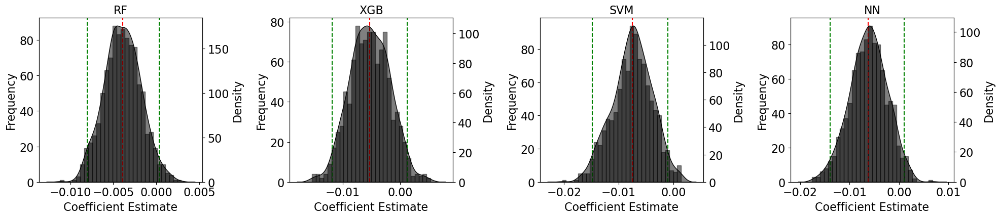

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# DML USING LINEAR ALGORITHMS

# Traditional IV estimates data

In [112]:
import statsmodels.api as sm
from statsmodels.tools import add_constant

y = traditional_df['bp']
d = traditional_df['fv']
X = traditional_df.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "OLS": LinearRegression(),
    "Ridge": RidgeCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Lasso": LassoCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Elastic Net": ElasticNetCV(alphas=[0.1, 1.0, 10.0], l1_ratio=[0.2, 0.5, 0.8])  # Adjust alphas and l1_ratio as needed
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,OLS,-0.019767,0.003749,1.355093e-07,0.000429
1,Ridge,-0.019767,0.003749,1.355093e-07,0.000429
2,Lasso,-0.018842,0.003771,5.850689e-07,0.000386
3,Elastic Net,-0.020759,0.003752,3.171658e-08,0.000473


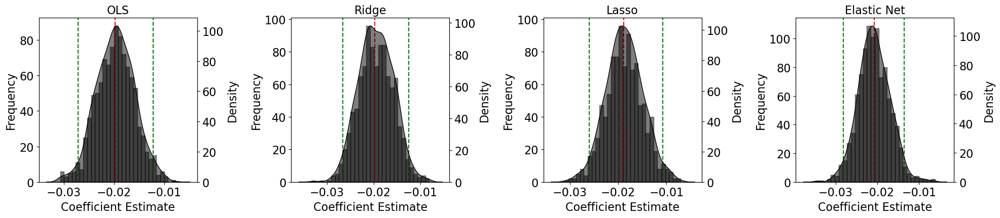

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Full sample initial tuned ML models data  

In [122]:
import statsmodels.api as sm
from statsmodels.tools import add_constant

y = filtered_data_standardized['bp']
d = filtered_data_standardized['fv']
X = filtered_data_standardized.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "OLS": LinearRegression(),
    "Ridge": RidgeCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Lasso": LassoCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Elastic Net": ElasticNetCV(alphas=[0.1, 1.0, 10.0], l1_ratio=[0.2, 0.5, 0.8])  # Adjust alphas and l1_ratio as needed
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,OLS,-0.008877,0.002570,5.538315e-04,0.000184
1,Ridge,-0.008883,0.002570,5.487216e-04,0.000184
2,Lasso,-0.016023,0.002608,8.146555e-10,0.000583
3,Elastic Net,-0.010652,0.002603,4.294110e-05,0.000259


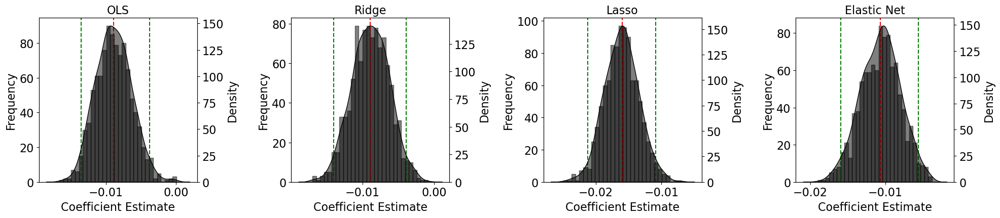

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Selected important features data

# RF

In [120]:
import statsmodels.api as sm
from statsmodels.tools import add_constant

y = final_df21['bp']
d = final_df21['fv']
X = final_df21.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "OLS": LinearRegression(),
    "Ridge": RidgeCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Lasso": LassoCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Elastic Net": ElasticNetCV(alphas=[0.1, 1.0, 10.0], l1_ratio=[0.2, 0.5, 0.8])  # Adjust alphas and l1_ratio as needed
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,OLS,-0.006608,0.002559,9.812525e-03,0.000103
1,Ridge,-0.006609,0.002559,9.799377e-03,0.000103
2,Lasso,-0.016021,0.002608,8.192647e-10,0.000582
3,Elastic Net,-0.009284,0.002589,3.365997e-04,0.000199


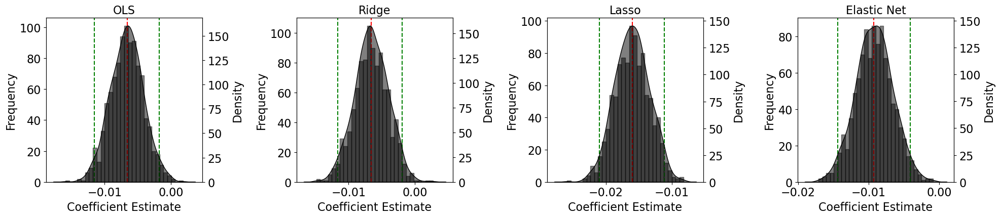

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# XGB

In [117]:
import statsmodels.api as sm
from statsmodels.tools import add_constant
y = new_df_55_xgb['bp']
d = new_df_55_xgb['fv']
X = new_df_55_xgb.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "OLS": LinearRegression(),
    "Ridge": RidgeCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Lasso": LassoCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Elastic Net": ElasticNetCV(alphas=[0.1, 1.0, 10.0], l1_ratio=[0.2, 0.5, 0.8])  # Adjust alphas and l1_ratio as needed
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,OLS,-0.009328,0.002576,2.929359e-04,0.000203
1,Ridge,-0.009333,0.002576,2.907122e-04,0.000203
2,Lasso,-0.016023,0.002608,8.146600e-10,0.000583
3,Elastic Net,-0.010187,0.002608,9.418113e-05,0.000236


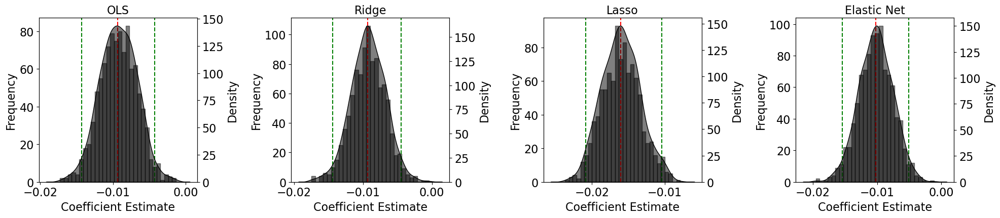

In [118]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# SVM

In [114]:
import statsmodels.api as sm
from statsmodels.tools import add_constant
y = important_data_svm_85['bp']
d = important_data_svm_85['fv']
X = important_data_svm_85.drop(['bp', 'fv'], axis=1)

# Initialize KFold for cross-fitting
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# DML estimation function with standard error, R-squared, and residuals
def dml_estimate(X, y, d, model_y, model_d, cv):
    y_resids = np.zeros(y.shape)
    d_resids = np.zeros(d.shape)

    for train_idx, test_idx in cv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        d_train, d_test = d.iloc[train_idx], d.iloc[test_idx]

        model_y_clone = clone(model_y).fit(X_train, y_train)
        model_d_clone = clone(model_d).fit(X_train, d_train)

        y_pred = model_y_clone.predict(X_test)
        d_pred = model_d_clone.predict(X_test)

        y_resids[test_idx] = y_test - y_pred
        d_resids[test_idx] = d_test - d_pred

    return y_resids, d_resids

# Define models for DML estimation
models = {
    "OLS": LinearRegression(),
    "Ridge": RidgeCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Lasso": LassoCV(alphas=[0.1, 1.0, 10.0]),  # Adjust alphas as needed
    "Elastic Net": ElasticNetCV(alphas=[0.1, 1.0, 10.0], l1_ratio=[0.2, 0.5, 0.8])  # Adjust alphas and l1_ratio as needed
}

# Initialize list to store consolidated results
consolidated_results = []

# Calculate DML estimates and residuals for each model
for name, model in models.items():
    y_resids, d_resids = dml_estimate(X, y, d, model, model, kf)
    d_resids_with_const = add_constant(d_resids)  # Add a constant term for the intercept
    sm_model = sm.OLS(y_resids, d_resids_with_const)
    sm_result = sm_model.fit()
    
    # Extract relevant statistics
    coef = sm_result.params[1]  # Coefficient for the treatment variable
    std_err = sm_result.bse[1]  # Standard error
    p_value = sm_result.pvalues[1]  # p-value
    r_squared = sm_result.rsquared  # R-squared

    # Append results to the list
    consolidated_results.append({
        'Model': name,
        'Coefficient': coef,
        'Std. Error': std_err,
        'p-value': p_value,
        'R-squared': r_squared
    })

# Create a DataFrame from the consolidated results
results_df = pd.DataFrame(consolidated_results)

results_df

,Model,Coefficient,Std. Error,p-value,R-squared
0,OLS,-0.020018,0.003964,4.418653e-07,0.000394
1,Ridge,-0.020018,0.003964,4.418947e-07,0.000394
2,Lasso,-0.018184,0.003910,3.319460e-06,0.000334
3,Elastic Net,-0.020296,0.003966,3.101164e-07,0.000404


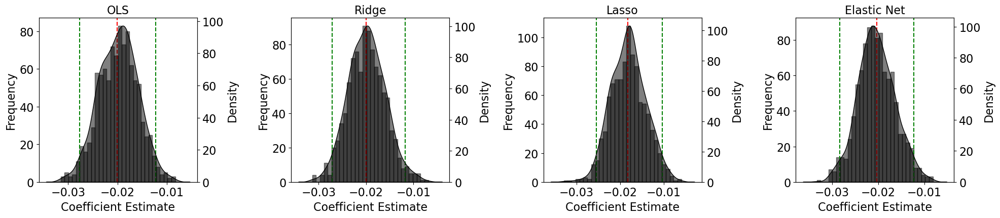

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the default font sizes using rcParams
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})

# Set the number of bootstrap samples
n_bootstrap = 1000

# Initialize dictionary to store bootstrap samples
bootstrap_samples = {name: [] for name in models.keys()}

# Perform bootstrap sampling
for name, model in models.items():
    # Extract the coefficient and standard error for the model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    std_err = results_df.loc[results_df['Model'] == name, 'Std. Error'].iloc[0]
    
    # Generate bootstrap samples
    bootstrap_samples[name] = np.random.normal(coef, std_err, n_bootstrap)

# Plotting histograms and KDE plots for each model
fig, axs = plt.subplots(1, len(models), figsize=(20, 5))

for i, (name, samples) in enumerate(bootstrap_samples.items()):
    # Re-fetch the coefficient for the current model
    coef = results_df.loc[results_df['Model'] == name, 'Coefficient'].iloc[0]
    
    # Create a secondary axis for the KDE plot
    ax2 = axs[i].twinx()
    
    # Calculate the confidence interval
    ci_lower = np.percentile(samples, 2.5)
    ci_upper = np.percentile(samples, 97.5)

    # Histogram on the primary y-axis
    axs[i].hist(samples, bins=30, alpha=0.5, color='black', edgecolor='black')
    
    # KDE plot on the secondary y-axis
    sns.kdeplot(samples, ax=ax2, fill=True, color='black', alpha=0.5)
    
    # Add vertical lines for the mean and the confidence interval bounds on the primary y-axis
    axs[i].axvline(x=coef, color='red', linestyle='--', label='Estimate')
    axs[i].axvline(x=ci_lower, color='green', linestyle='--', label='2.5% CI')
    axs[i].axvline(x=ci_upper, color='green', linestyle='--', label='97.5% CI')
    
    # Set titles and labels for primary y-axis
    axs[i].set_title(name)
    axs[i].set_xlabel('Coefficient Estimate')
    axs[i].set_ylabel('Frequency')

# Set labels for secondary y-axis
    ax2.set_ylabel('Density', fontsize=16)
    ax2.grid(False)  # Turn off grid for the secondary y-axis

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for visualization
models = ["Random Forest", "XGBoost", "SVM", "Neural Network"]
r2_scores = {
    "All Variables": [0.7199, 0.7126, 0.6382, 0.4510],
    "100% Variance RF (55 vars)": [0.6585, 0.6767, 0.6887, 0.4222],
    "100% Variance XGB (70 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "100% Variance SVM (37 vars)": [0.6535, 0.6544, 0.6382, 0.4510],
    "85% Variance XGB (55 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "85% Variance RF (21 vars)": [0.6435, 0.6558, 0.4445, 0.2713],
    "85% Variance SVM (27 vars)": [0.6500, 0.6428, 0.6382, 0.4510]
}

mse_scores = {
    "All Variables": [0.1868, 0.1917, 0.2413, 0.3661],
    "100% Variance RF (55 vars)": [0.2278, 0.2156, 0.2076, 0.3854],
    "100% Variance XGB (70 vars)": [0.2278, 0.2156, 0.2364, 0.3712],
    "100% Variance SVM (37 vars)": [0.2311, 0.2305, 0.2379, 0.4147],
    "85% Variance XGB (55 vars)": [0.2278, 0.2156, 0.2464, 0.4149],
    "85% Variance RF (21 vars)": [0.2378, 0.2295, 0.3705, 0.4860],
    "85% Variance SVM (27 vars)": [0.2334, 0.2382, 0.2570, 0.4382]
}

# Creating Box Plots for R2 Scores and MSE
plt.figure(figsize=(16, 10))

# R2 Scores Box Plot
plt.subplot(2, 1, 1)
sns.boxplot(x="Variable Set", y="R2 Score", hue="Model", data=df)
plt.title('R2 Scores for Different Models Across Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('R2 Score')
plt.xticks(rotation=45)

# MSE Scores Box Plot
plt.subplot(2, 1, 2)
sns.boxplot(x="Variable Set", y="MSE", hue="Model", data=df)
plt.title('MSE Scores for Different Models Across Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('MSE')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()



In [ ]:
# Data for visualization
models = ["Random Forest", "XGBoost", "SVM", "Neural Network"]
r2_scores = {
    "All Variables": [0.7199, 0.7126, 0.6382, 0.4510],
    "100% Variance RF (55 vars)": [0.6585, 0.6767, 0.6887, 0.4222],
    "100% Variance XGB (70 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "100% Variance SVM (37 vars)": [0.6535, 0.6544, 0.6382, 0.4510],
    "85% Variance XGB (55 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "85% Variance RF (21 vars)": [0.6435, 0.6558, 0.4445, 0.2713],
    "85% Variance SVM (27 vars)": [0.6500, 0.6428, 0.6382, 0.4510]
}

mse_scores = {
    "All Variables": [0.1868, 0.1917, 0.2413, 0.3661],
    "100% Variance RF (55 vars)": [0.2278, 0.2156, 0.2076, 0.3854],
    "100% Variance XGB (70 vars)": [0.2278, 0.2156, 0.2364, 0.3712],
    "100% Variance SVM (37 vars)": [0.2311, 0.2305, 0.2379, 0.4147],
    "85% Variance XGB (55 vars)": [0.2278, 0.2156, 0.2464, 0.4149],
    "85% Variance RF (21 vars)": [0.2378, 0.2295, 0.3705, 0.4860],
    "85% Variance SVM (27 vars)": [0.2334, 0.2382, 0.2570, 0.4382]
}

# Data Preparation for Visualization
data = {
    "Model": [],
    "R2 Score": [],
    "MSE": [],
    "Variable Set": []
}

var_sets = [
    "All Variables", 
    "100% Variance RF (55 vars)", 
    "100% Variance XGB (70 vars)", 
    "100% Variance SVM (37 vars)", 
    "85% Variance RF (21 vars)", 
    "85% Variance XGB (55 vars)", 
    "85% Variance SVM (27 vars)"
]

for var_set in var_sets:
    for model in models:
        data["Model"].append(model)
        data["R2 Score"].append(r2_scores[var_set][models.index(model)])
        data["MSE"].append(mse_scores[var_set][models.index(model)])
        data["Variable Set"].append(var_set)

df = pd.DataFrame(data)

# Plotting
plt.figure(figsize=(16, 10))

# R2 Scores
plt.subplot(2, 1, 1)
sns.barplot(x="R2 Score", y="Variable Set", hue="Model", data=df)
plt.title('R2 Scores for Different Models and Variable Sets')
plt.xlabel('R2 Score')
plt.ylabel('')

# MSE Scores
plt.subplot(2, 1, 2)
sns.barplot(x="MSE", y="Variable Set", hue="Model", data=df)
plt.title('MSE Scores for Different Models and Variable Sets')
plt.xlabel('MSE Score')
plt.ylabel('')

plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming 'models', 'r2_scores', and 'mse_scores' are already defined
models = ["Random Forest", "XGBoost", "SVM", "Neural Network"]

r2_scores = {
    "All Variables": [0.7199, 0.7126, 0.6382, 0.4510],
    "100% Variance RF (55 vars)": [0.6585, 0.6767, 0.6887, 0.4222],
    "100% Variance XGB (70 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "100% Variance SVM (37 vars)": [0.6535, 0.6544, 0.6382, 0.4510],
    "85% Variance XGB (55 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "85% Variance RF (21 vars)": [0.6435, 0.6558, 0.4445, 0.2713],
    "85% Variance SVM (27 vars)": [0.6500, 0.6428, 0.6382, 0.4510]
}

mse_scores = {
    "All Variables": [0.1868, 0.1917, 0.2413, 0.3661],
    "100% Variance RF (55 vars)": [0.2278, 0.2156, 0.2076, 0.3854],
    "100% Variance XGB (70 vars)": [0.2278, 0.2156, 0.2364, 0.3712],
    "100% Variance SVM (37 vars)": [0.2311, 0.2305, 0.2379, 0.4147],
    "85% Variance XGB (55 vars)": [0.2278, 0.2156, 0.2464, 0.4149],
    "85% Variance RF (21 vars)": [0.2378, 0.2295, 0.3705, 0.4860],
    "85% Variance SVM (27 vars)": [0.2334, 0.2382, 0.2570, 0.4382]
}
# Data Preparation for Revised Structure
data_revised = {
    "Model": [],
    "Metric": [],
    "Score": [],
    "Variable Set": []
}

for model in models:
    for var_set in var_sets:
        # Append R2 Score
        data_revised["Model"].append(model)
        data_revised["Metric"].append("R2 Score")
        data_revised["Score"].append(r2_scores[var_set][models.index(model)])
        data_revised["Variable Set"].append(var_set)

        # Append MSE
        data_revised["Model"].append(model)
        data_revised["Metric"].append("MSE")
        data_revised["Score"].append(mse_scores[var_set][models.index(model)])
        data_revised["Variable Set"].append(var_set)

# Create DataFrame with Revised Data
df_revised = pd.DataFrame(data_revised)

# Example Plotting (Customize as needed)
plt.figure(figsize=(16, 10))

# Example: Plot R2 Scores and MSE for Random Forest
rf_data = df_revised[df_revised["Model"] == "Random Forest"]
sns.lineplot(data=rf_data, x="Variable Set", y="Score", hue="Metric")
plt.title('Random Forest Performance Across Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('Score')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [ ]:
# Preparing the data for all models as per the provided structure
data_revised = {
    "Model": [],
    "Metric": [],
    "Score": [],
    "Variable Set": []
}

var_sets = [
    "All Variables", 
    "100% Variance RF (55 vars)", 
    "100% Variance XGB (70 vars)", 
    "100% Variance SVM (37 vars)", 
    "85% Variance RF (21 vars)", 
    "85% Variance XGB (55 vars)", 
    "85% Variance SVM (27 vars)"
]

# Replicating the data structure for all models
for model in models:
    for var_set in var_sets:
        # Append R2 Score
        data_revised["Model"].append(model)
        data_revised["Metric"].append("R2 Score")
        data_revised["Score"].append(r2_scores[var_set][models.index(model)])
        data_revised["Variable Set"].append(var_set)
        # Append MSE
        data_revised["Model"].append(model)
        data_revised["Metric"].append("MSE")
        data_revised["Score"].append(mse_scores[var_set][models.index(model)])
        data_revised["Variable Set"].append(var_set)

# Create DataFrame with Revised Data
df_revised = pd.DataFrame(data_revised)

# Plotting for each model
plt.figure(figsize=(20, 15))

# Looping through models to create a subplot for each
for i, model in enumerate(models, 1):
    plt.subplot(2, 2, i)
    model_data = df_revised[df_revised["Model"] == model]
    sns.lineplot(data=model_data, x="Variable Set", y="Score", hue="Metric")
    plt.title(f'{model} Performance Across Variable Sets')
    plt.xlabel('Variable Set')
    plt.ylabel('Score')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


In [ ]:
# Set the color palette for the plots using only black and gray tones
black_gray_palette = {
    "Random Forest": "black", 
    "XGBoost": "dimgray", 
    "SVM": "darkgray", 
    "Neural Network": "lightgray"
}

# Plotting with the updated black and gray color palette
plt.figure(figsize=(16, 20))

# Create a new subplot for R2 Scores without stacked bars and using the black and gray color palette
plt.subplot(2, 1, 1)
sns.barplot(y="Variable Set", x="R2 Score", hue="Model", data=df, dodge=True, palette=black_gray_palette)
plt.title('R2 Scores for Different Models and Variable Sets')
plt.ylabel('Variable Set')
plt.xlabel('R2 Score')

# Create a new subplot for MSE Scores without stacked bars and using the black and gray color palette
plt.subplot(2, 1, 2)
sns.barplot(y="Variable Set", x="MSE", hue="Model", data=df, dodge=True, palette=black_gray_palette)
plt.title('MSE Scores for Different Models and Variable Sets')
plt.ylabel('Variable Set')
plt.xlabel('MSE Score')

plt.tight_layout()
plt.show()


In [ ]:
models = ["Random Forest", "XGBoost", "SVM", "Neural Network"]

r2_scores = {
    "All Variables": [0.7199, 0.7126, 0.6382, 0.4510],
    "100% Variance RF (55 vars)": [0.6585, 0.6767, 0.6887, 0.4222],
    "100% Variance XGB (70 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "100% Variance SVM (37 vars)": [0.6535, 0.6544, 0.6382, 0.4510],
    "85% Variance XGB (55 vars)": [0.6585, 0.6767, 0.6306, 0.3779],
    "85% Variance RF (21 vars)": [0.6435, 0.6558, 0.4445, 0.2713],
    "85% Variance SVM (27 vars)": [0.6500, 0.6428, 0.6382, 0.4510]
}

mse_scores = {
    "All Variables": [0.1868, 0.1917, 0.2413, 0.3661],
    "100% Variance RF (55 vars)": [0.2278, 0.2156, 0.2076, 0.3854],
    "100% Variance XGB (70 vars)": [0.2278, 0.2156, 0.2364, 0.3712],
    "100% Variance SVM (37 vars)": [0.2311, 0.2305, 0.2379, 0.4147],
    "85% Variance XGB (55 vars)": [0.2278, 0.2156, 0.2464, 0.4149],
    "85% Variance RF (21 vars)": [0.2378, 0.2295, 0.3705, 0.4860],
    "85% Variance SVM (27 vars)": [0.2334, 0.2382, 0.2570, 0.4382]
}

# Plotting with the updated black and gray color palette and swapping x and y axes
plt.figure(figsize=(16, 20))

# Create a new subplot for R2 Scores without stacked bars and using the black and gray color palette
plt.subplot(2, 1, 1)
sns.barplot(x="Variable Set", y="R2 Score", hue="Model", data=df, dodge=True, palette=black_gray_palette)
plt.title('R2 Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('R2 Score')
plt.xticks(rotation=45)  # Rotate x labels for better readability

# Create a new subplot for MSE Scores without stacked bars and using the black and gray color palette
plt.subplot(2, 1, 2)
sns.barplot(x="Variable Set", y="MSE", hue="Model", data=df, dodge=True, palette=black_gray_palette)
plt.title('MSE Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('MSE Score')
plt.xticks(rotation=45)  # Rotate x labels for better readability

plt.tight_layout()
plt.show()


In [ ]:
# First, let's organize the given data into a DataFrame format suitable for Seaborn's barplot.
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Data preparation
models = ["Random Forest", "XGBoost", "SVM", "Neural Network"]
variables = list(r2_scores.keys())
data = []

for var_set, r2_list in r2_scores.items():
    for model, r2 in zip(models, r2_list):
        data.append({'Variable Set': var_set, 'Model': model, 'R2 Score': r2})

for var_set, mse_list in mse_scores.items():
    for model, mse in zip(models, mse_list):
        data.append({'Variable Set': var_set, 'Model': model, 'MSE': mse})

df = pd.DataFrame(data)

# To use trend lines, we need a numeric x-axis, so we convert the 'Variable Set' to a categorical type and then to codes
df['Variable Set'] = pd.Categorical(df['Variable Set'], categories=variables, ordered=True)
df['Variable Set Code'] = df['Variable Set'].cat.codes

# Plotting
plt.figure(figsize=(16, 20))

# R2 Scores plot
ax1 = plt.subplot(2, 1, 1)
sns.barplot(x="Variable Set Code", y="R2 Score", hue="Model", data=df, dodge=True)
# Add trend lines
for model in models:
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='R2 Score', data=subset, ax=ax1, label=f'{model} Trend')

plt.title('R2 Scores for Different Models and Variable Sets')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

# MSE Scores plot
ax2 = plt.subplot(2, 1, 2)
sns.barplot(x="Variable Set Code", y="MSE", hue="Model", data=df, dodge=True)
# Add trend lines
for model in models:
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='MSE', data=subset, ax=ax2, label=f'{model} Trend')

plt.title('MSE Scores for Different Models and Variable Sets')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

plt.tight_layout()
plt.legend()
plt.show()


In [ ]:
# Correcting the code to plot trend lines for each model
plt.figure(figsize=(16, 20))

# R2 Scores plot
ax1 = plt.subplot(2, 1, 1)
for model in models:
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='R2 Score', data=subset, ax=ax1, label=f'{model}')
plt.title('R2 Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('R2 Score')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

# MSE Scores plot
ax2 = plt.subplot(2, 1, 2)
for model in models:
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='MSE', data=subset, ax=ax2, label=f'{model}')
plt.title('MSE Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('MSE Score')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

plt.tight_layout()
plt.legend()
plt.show()


In [ ]:
# Create a black and gray color palette
black_gray_palette = sns.color_palette(['black', 'dimgray', 'gray', 'darkgray'])

# Plotting trend lines for each model
plt.figure(figsize=(16, 20))

# R2 Scores plot with trend lines in black and gray
ax1 = plt.subplot(2, 1, 1)
for idx, model in enumerate(models):
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='R2 Score', data=subset, ax=ax1, label=f'{model}', color=black_gray_palette[idx])
plt.title('R2 Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('R2 Score')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

# MSE Scores plot with trend lines in black and gray
ax2 = plt.subplot(2, 1, 2)
for idx, model in enumerate(models):
    subset = df[df['Model'] == model]
    sns.lineplot(x='Variable Set Code', y='MSE', data=subset, ax=ax2, label=f'{model}', color=black_gray_palette[idx])
plt.title('MSE Scores for Different Models and Variable Sets')
plt.xlabel('Variable Set')
plt.ylabel('MSE Score')
plt.xticks(ticks=df['Variable Set Code'].unique(), labels=variables, rotation=45)

plt.tight_layout()
plt.legend()
plt.show()
